In [34]:
import numpy as np
import math
import os
# pandas is a fast and simple library for data manipulation
# it supports spreadsheet-like data structures, so we can read/write/manipulate csv or excel files easily
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
# use curve_fit for Rosenbluth linear fit
from scipy.optimize import curve_fit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# import subprocess
# python version: /usr/local/bin/python3
# optional: use science paper style for plots
# from matplotlib.ticker import ScalarFormatter
from PIL import Image
#import scienceplots
#plt.style.use('science')
from PIL import Image
from reportlab.pdfgen import canvas
# plt.rcParams['font.weight'] = 'bold'  # Applies to all text elements
# plt.rcParams['axes.titleweight'] = 'bold'  # Bold titles
# plt.rcParams['axes.labelweight'] = 'bold'  # Bold axis labels
# plt.rcParams['legend.fontsize'] = 12  # Adjust legend font size
# plt.rcParams['legend.fontweight'] = 'bold'  # Bold legend text
# plt.rcParams['xtick.labelsize'] = 12  # Adjust x-tick labels font size
# plt.rcParams['ytick.labelsize'] = 12  # Adjust y-tick labels font size


In [35]:
'''
important notations that I use in the code:

nu: energy transfer
cross: cross section
Q2: four-momentum transfer squared
qv: bold q, three-momentum transfer
Ex: excitation energy
W: invariant mass of the final state (W2: W squared)
epsilon: virtual photon polarization parameter
Theta: scattering angle
E0: incident electron energy
Eprime: final electron energy
Veff: effective potential (_eff is used for "effective" quantities)
'''

# Aug 15 notes
'''
paper final version plot:
Fig 9

Fig 11, 12:
ACHILLES not there in fig 11

Fig 16, 17
into insert
    optional: put it into a formate of 4 by 4 grid

EDRMF vs STA q: no NuWRo for the 12 bins (page of 5, 5, and 2)

EDRMF vs STA Q2: no NuWRo, 13 bins, (page of 5, 5, and 3)

GENIE: see if more data helped; show negative points (for DOE proposal)

Q plots:
match colors
put Goldemberg, yamaguchi

Q2 plots:
no inserts
GENIE: see if more data helped; put gray line



'''
# reverse Veff for GENIE
# RLRT without cc
# G18_10a, v3.4.0

'\npaper final version plot:\nFig 9\n\nFig 11, 12:\nACHILLES not there in fig 11\n\nFig 16, 17\ninto insert\n    optional: put it into a formate of 4 by 4 grid\n\nEDRMF vs STA q: no NuWRo for the 12 bins (page of 5, 5, and 2)\n\nEDRMF vs STA Q2: no NuWRo, 13 bins, (page of 5, 5, and 3)\n\nGENIE: see if more data helped; show negative points (for DOE proposal)\n\nQ plots:\nmatch colors\nput Goldemberg, yamaguchi\n\nQ2 plots:\nno inserts\nGENIE: see if more data helped; put gray line\n\n\n\n'

In [46]:
# preset values for the analysis:
#____________________________________________________________________________________________________________________
# physical constants
mass_nucleon = 0.938273
mass_C12= 39.96259098
alpha_fine = 1/137

# three-momentum bin centers
qvcenters = [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649, 0.756, 0.991, 1.619, 1.921, 2.213, 2.500, 2.783, 3.500]
# three-momentum edges
qvbins = [0.063, 0.124, 0.158, 0.186, 0.223, 0.270, 0.340, 0.428, 0.523, 0.609, 0.702, 0.878, 1.302, 1.770, 2.067, 2.357, 2.642, 2.923, 4.500]
# four-momentum squared bin names, in string format
qvbin_names = ['[0.063,0.124]', '[0.124,0.158]', '[0.158,0.186]', '[0.186,0.223]', '[0.223,0.270]', '[0.270,0.340]', '[0.340,0.428]', '[0.428,0.523]', '[0.523,0.609]',
                '[0.609,0.702]', '[0.702,0.878]', '[0.878,1.302]', '[1.302,1.770]', '[1.770,2.067]', '[2.067,2.357]', '[2.357,2.642]', '[2.642,2.923]', '[2.923,4.500]']

# four-momentum squared bin centers
Q2centers = [0.010, 0.020, 0.026, 0.040, 0.056, 0.093, 0.120, 0.160, 0.265, 0.380, 0.500, 0.800, 1.250, 1.750, 2.250, 2.750, 3.250, 3.750]
# four-momentum squared bin edges
Q2bins = [0.004, 0.015, 0.025, 0.035, 0.045, 0.070, 0.100, 0.145, 0.206, 0.322, 0.438, 0.650, 1.050, 1.500, 2.000, 2.500, 3.000, 3.500, 4.000]
# four-momentum squared bin names, in string format
Q2bin_names = ['[0.004,0.015]', '[0.015,0.025]', '[0.025,0.035]', '[0.035,0.045]', '[0.045,0.070]', '[0.070,0.100]', '[0.100,0.145]', '[0.145,0.206]', '[0.206,0.322]',
                '[0.322,0.438]', '[0.438,0.650]', '[0.650,1.050]', '[1.050,1.500]', '[1.500,2.000]', '[2.000,2.500]', '[2.500,3.000]', '[3.000,3.500]', '[3.500,4.000]']

# map from data set index to data set name (author, year, etc.)
# dataSet_to_name = {1:"Barreau:1983ht", 2:"O'Connell:198", 3:"Sealock:1989nx", 4:"Baran:1988tw", 5:"Bagdasaryan:1988hp", 6:"Dai - HallA:2019da", 
#     7:"Arrington:1995hs", 8:"Day:1993md", 9:"Arrington:1998psnoCC", 10:"Gaskell:2008", 11:"Whitney:1974hr", 12:"AlsamiJan05", 13:"VaheJun07", 
#     14:"Gomez74", 15:"Fomin", 16:"Yamaguchi73", 17:"Ryan84", 18:"Cyzyk:1963zz", 19:"Bounin63", 20:"Photo-Daphne", 21:"Spamer70", 22:"Goldemberg64", 
#     23:"DeForrest65", 24:"Donnelly68", 25:"Barreau:French",26:"Julia:Genie",27:"Antony-Spies:1970jjs"}


#dataSet_to_name = {1:"Meziani:1984is_90deg", 2:"Meziani:1984is_140deg", 3:"Williamson:1997_140deg", 4:"Williamson:1997_90deg", 5:"Meziani:1984is_60deg", 6:"Williamson_45.5deg", 7:"Whitney:1974hr_60deg", 9:"Torizuka1975"}
#dataSet_to_name = {3:"Williamson:1997_140deg", 4:"Williamson:1997_90deg", 6:"Williamson_45.5deg", 10:"Meziani_0.120_140", 11:"Meziani_0.160_140", 12:"Meziani_0.200_140", 13:"Meziani_0.240_140", 14:"Meziani_0.280_140", 
#                   15:"Meziani_0.320_140", 16:"Meziani_0.360_140", 17:"Meziani_0.400_140", 18:"Meziani_0.440_140", 19:"Meziani_0.480_140",
#                   20:"Meziani_0.120_90", 21:"Meziani_0.160_90", 22:"Meziani_0.200_90", 23:"Meziani_0.240_90", 24:"Meziani_0.280_90",
#                  25:"Meziani_0.320_90", 26:"Meziani_0.360_90", 27:"Meziani_0.400_90", 30:"Torizuka:1975_Meziani_combined", 31:"Whitney:1974hr_60deg"}
#updated as of 04/02
dataSet_to_name = {1:"Meziani0.120_90", 2:"Meziani0.120_140", 3:"Williamson0.130_140", 4:"Torizuka0.15_35", 5:"Williamson0.150_90", 6:"Meziani0.160_60", 7:"Meziani0.160_90", 8:"Meziani0.160_140", 9:"Williamson0.160_140 ", 10:"Torizuka0.183_35", 
                   11:"Torizuka0.183_45", 12:"Torizuka0.183_55", 13:"Williamson0.189_140", 14:"Mezian0.2_60", 15:"Mezini0.2_90", 16:"Williamson0.2_90", 17:"Meziani0.2_140", 18:"Wlliamson_0.219_140", 19:" Meziani0.24_60", 20:"Meziani0.24_90",
                   21:"Meziani0.24_140", 22:"Williamson0.248_90", 23:"Williamson0.249_140", 24:"Torizuka0.25_50", 25:"Torizuka0.25_60", 26:"Torizuka0.25_70", 27:"Meziani0.28_60", 28:"Willaimson0.28_90", 29:"Meziani0.28_140", 30:"Williamson0.287_140",
                   31:"Williamson0.298_90", 32:"Meziani0.32_90", 33:"Meziani0.32_140", 34:"Williamson0.327_140", 35:" Meziani0.34_60", 36:"Williamson0.347_90", 37:" Williamson0.348_45.5", 38:" Meziani0.36_90", 39:"Meziani0.36_140", 40:"Williamson0.367_140",
                   41:"Williamson0.372_90", 42:"Meziani0.4_60", 43:"Meziani0.4_90", 44:"Meziani0.4_140", 45:"Williamson0.408_45.5", 46:"Meziani0.44_140", 47:" Williamson0.471_45.5", 48:"Meziani0.48_60", 49:"Meziani0.48_140", 50:"Whitney0.5_60",
                   51:"Williamson0.545_45.5", 52:"Meziani0.56_60", 53:"Williamson0.628_45.4", 54:"Williamson0.681_45.5", 55:"Williamson0.739_45.5", 56:"Williamson0.782_45.5", 57:"Williamson0.841_45.5"}


#updated normalization values for 40Ca
#reference values for normlization
#dataSet_to_normalization = {1:0.97, 2:0.93, 3:1.0, 4:1.00 , 5:1.1 , 6:1.0 , 7:1.059}

#updated normalization values as of 02/26/2025
#dataSet_to_normalization = {1:0.967103118, 2:0.965862545, 3:1.0, 4:1.0 , 5:0.9, 6:1.0 , 7:1.4, 9:0.9}

#updated normalization values as of 03/10/2025
#dataSet_to_normalization = {3:1.0, 4:1.0, 6:1.0, 10:1.080, 11:0.989, 12:0.937, 13:0.899, 14:0.913, 
#                   15:0.939, 16:0.976, 17:0.983, 18:0.970, 19:1.001,
#                   20:1.094, 21:0.934, 22:0.970, 23:0.870, 24:0.903
#                   25:1.036, 26:0.959, 27:0.927, 30:1.00, 31:0.99}

#04/03/2025
dataSet_to_normalization ={1:1.094, 2:1.080, 3:1.0, 4:1.051 , 5:1.0 , 6:0.964 , 7:0.934 ,8:0.989 , 9:1.0, 10:1.051, 11:1.051 ,
                           12:1.051 , 13:1.0, 14:0.964 , 15:0.970 , 16:1.0, 17:0.937 , 18:1.0, 19:0.964 , 20:0.870 , 21:0.899 ,
                           22:1.0 , 23:1.0 , 24:1.051 , 25:1.051 , 26:1.051 , 27:0.964 , 28:1.0 , 29:0.913 , 30:1.0 , 31:1.0 ,
                           32:1.036 , 33:0.939 , 34:1.0 , 35:0.964 , 36:1.0 , 37:1.0 , 38:0.959 , 39:0.976 , 40:0.976 , 41:1.0 ,
                           42:0.964 , 43:0.927 , 44:0.983 , 45:1.0 , 46:0.970 , 47:1.0 , 48:0.964 , 49:1.001 , 50:0.954 , 51:1.0 ,
                           52:1.0 , 53:1.0 , 54:1.0 , 55:1.0 , 56:1.0 , 57:1.0 }


#leave 1,5 at the end for fixing the  a

# map from data set index to normalization error
# dataSet_to_normError = {1:0.24320E-02, 2:0.86008E-02, 
#                         # 3:0.48305E-02,
#                          3:0.1,
#                           4:0.45501E-02, 5:0.82797E-02, 6:0.52969E-02, 7:0.13229E-01, 8:0.33307E-02, 
#         9:0.34432E-02, 10:0.50742E-02, 11:0.15258E-01, 12:0.67079E-03, 13:0.69905E-03, 14:0.14875E-01, 15:0.30856E-02, 16:0.29024E-02, 
#         17:0.13049E-01, 
#         18:0.2, 
#         19:0.23, 20:0.10513, 21:0.4, 22:0.1, 23:0.1, 24:0.1, 25:0.002432, 26:0.0, 27:0.0}

#updated normalization error values for 40Ca
dataSet_to_normError = {1:0.037, 2:0.037, 3:0.037, 4:0.037 , 5:0.037*2 , 6:0.037 , 7:0.037 ,8:0.037 , 9:0.037, 10:0.037, 11:0.037 ,
                        12:0.037 , 13:0.037, 14:0.037 , 15:0.037 , 16:0.037*2, 17:0.037 , 18:0.037, 19:0.037 , 20:0.037 , 21:0.037 ,
                        22:0.037*2 , 23:0.037 , 24:0.037 , 25:0.037 , 26:0.037 , 27:0.037 , 28:0.037 , 29:0.037 , 30:0.037 , 31:0.037*2 ,
                        32:0.037 , 33:0.037 , 34:0.037 , 35:0.037 , 36:0.037*2 , 37:0.037 , 38:0.037 , 39:0.037 , 40:0.037 , 41:0.037*2 ,
                        42:0.037 , 43:0.037 , 44:0.037 , 45:0.037 , 46:0.037 , 47:0.037 , 48:0.037 , 49:0.037 , 50:0.037 , 51:0.037 ,
                        52:0.037 , 53:0.037 , 54:0.037 , 55:0.037 , 56:0.037 , 57:0.037}





In [90]:
# utility functions:

# round to only 3 significant figures (for printing)
def round_sig_3(x):
    return '%s' % float('%.3g' % x)

# append a row to a dataframe
def append_row(df, row):
    return pd.concat([df, pd.DataFrame([row], columns=row.index)]).reset_index(drop=True)

# linear model for Rosenbluth fitting
def linear_model(x, a, b):
    return a * x + b

# prepare the dataframe
# "filepath" should be the path to the csv file that contains columns {'A', 'Z', 'nu', 'E0', 'ThetaDeg', 'cross', 'error', 'dataSet'}
def prepare_df(filepath):
    # read the csv file:
    df = pd.read_csv(filepath)

    # calculate normalized cross section:
    df["normalization"]=df["dataSet"].map(dataSet_to_normalization)
    df["normError"]=df["dataSet"].map(dataSet_to_normError)
    df['normCross'] = df['cross'] * df['normalization']
    
    #without normalization
    #df["normError"]=df["dataSet"].map(dataSet_to_normError)
    #df['normCross'] = df['cross'] 
    
    system_err = 0.05
    #remove this systematic_error
    df['error'] = np.sqrt(df['error']**2 + ((system_err*df['normCross'])**2))
    df.loc[df['Eprime'] > 0.2, 'error'] = 0.037 + ((df['Eprime'] - 0.054) / 0.150) * 0.016
    df.loc[df['Eprime'] < 0.2, 'error'] = 0.037 + ((0.2 - df['Eprime']) / 0.150) * 0.016
    df['normCrossError'] = df['normCross'] * np.sqrt((df['error'] / df['cross'])**2 + (df['normError'] / df['normalization'])**2)
    #df['normCrossError']=df['normCross']*np.sqrt((df['error']/df['cross'])**2+(df['normError']/df['normalization'])**2)
    
    # calculate the kinematic variables:
    df["ThetaRad"]=df["ThetaDeg"]*np.pi/180
    df["sin2(T/2)"]=(np.sin(df["ThetaRad"]/2))**2
    df["cos2(T/2)"]=(np.cos(df["ThetaRad"]/2))**2
    df["tan2(T/2)"]=(np.tan(df["ThetaRad"]/2))**2

    df["nu_elastic"]=df["E0"]-df["E0"]/(1+2*df["E0"]*df["sin2(T/2)"]/mass_C12)
    df["Ex"]=df["nu"]-df["nu_elastic"]
    df["Ex"] = df["nu"] - (df["E0"]-df["E0"]/(1+2*df["E0"]*df["sin2(T/2)"]/mass_C12))

    # R = 2.894, Z = 6, A = 12
    df["R"]=1.1*(df["A"])**(1/3)+0.86/((df["A"])**(1/3))
    df["Veff"]=0.0074
    #df["Veff"]=0.0
    df["Eeff"]=df["E0"]+df["Veff"]
    df["Eprime"]=df["E0"]-df["nu"]
    df["Eprime_eff"]=df["Eprime"]+df["Veff"]

    df["F2foc"]=(df["Eeff"]/df["E0"])**2
    df["Q2"]=4*df["E0"]*(df["Eprime"])*df["sin2(T/2)"]
    df["Q2eff"]=4*df["Eeff"]*df["Eprime_eff"]*df["sin2(T/2)"]
    df["q3momt_squared"]=df["nu"]**2+df["Q2eff"]
    df["q3momt"]=np.sqrt(df["q3momt_squared"])

    df["W2"]=mass_nucleon**2+2*mass_nucleon*df["nu"]-df["Q2eff"]
    df["epsilon"]=1/(1+2*(1+(df["nu"]**2)/df["Q2eff"])*df["tan2(T/2)"]) 

    df["gamma"]=alpha_fine*df["Eprime_eff"]*(df["W2"]-mass_nucleon**2)/((4*((np.pi)**2)*df["Q2eff"]*mass_nucleon*df["E0"])*(1-df["epsilon"]))
    df["Sig_R"]=df["normCross"]/df["gamma"]
    df["D_sig_R"]=df["error"]/df["gamma"]
    df["Sig_mott"]=4*(alpha_fine**2)*(df["Eprime"]**2)*df["cos2(T/2)"]/(df["Q2"]**2)
    df["Sig_mott_eff"]=df["Sig_mott"]*df["E0"]/df["Eeff"]

    # Calculate the Rosenbluth quantity:
    df["H"]=(df["q3momt_squared"]**2)/(4*(alpha_fine**2)*(df["Eprime_eff"]**2)*(df["cos2(T/2)"]+2*(df["q3momt_squared"]/df["Q2eff"])*df["sin2(T/2)"]))
    df["Hcc"]=df["H"] / df["F2foc"]
    df["Hstar_Sig(nb)"]=df["H"]*df["normCross"]
    df["Hstar_error(nb)"]=df["H"]*df["normCrossError"]
    df["Hstar_Sig(GeV)"]=df["Hstar_Sig(nb)"]/((0.1973269**2)*10000000)
    df["Hstar_error(GeV)"]=df["Hstar_error(nb)"]/((0.1973269**2)*10000000)
    df["Hcc_Sig(nb)"]=df["Hcc"]*df["normCross"]
    df["Hcc_error(nb)"]=df["Hcc"]*df["normCrossError"]
    df["Hcc_Sig(GeV)"]=df["Hcc_Sig(nb)"]/((0.1973269**2)*10000000)
    df["Hcc_error(GeV)"]=df["Hcc_error(nb)"]/((0.1973269**2)*10000000)
    # we will fit "Hcc_Sig(GeV)" vs "epsilon" to the linear model to get the Rosenbluth slope and intercept

    # apply the new condition for datasets 1, 2, and 5
    mask = df['dataSet'].isin([1, 2, 5])
    df.loc[mask & (df['Eprime'] < 0.2), 'normError'] = 0.037 + (0.2 - df['Eprime']) * 17
    df.loc[mask & (df['Eprime'] > 0.2), 'normError'] = 0.037
    
    # subdivide the data into bins
    df['qvbin'] = 0
    df['qvcenter'] = 0
    df['Q2bin'] = 0
    df['Q2center'] = 0
    df["qvbin"]=pd.cut(x=df["q3momt"],bins=qvbins,labels=qvbin_names,right=True)
    df["qvcenter"]=pd.cut(x=df["q3momt"],bins=qvbins,labels=qvcenters,right=True)
    df['qvcenter']=pd.to_numeric(df['qvcenter'])
    df["Q2bin"]=pd.cut(x=df["Q2"],bins=Q2bins,labels=Q2bin_names,right=True)
    df["Q2center"]=pd.cut(x=df["Q2"],bins=Q2bins,labels=Q2centers,right=True)
    df['Q2center']=pd.to_numeric(df['Q2center'])
    # now every row of data has a bin (Q2/qv) label

    return df

# the entire dataset is firstly subdivided into bins of qv, then further divided into sub-bins of nu.
# "nu_grid" is essentially the edges of nu sub-bins
def customized_nu_grid(bin_index):
    step_settings = np.array([
        [0.0007,  0.001,  0.002, 0.05],
        [0.0002,  0.001,  0.002, 0.05],
        [0.0002,  0.001,  0.002, 0.05],
        [0.00025, 0.0045, 0.02,  0.05],
        [0.00025, 0.004,  0.02,  0.05],
        [0.0004,  0.0055, 0.008, 0.05],
        [0.006,   0.006,  0.01,  0.01],
        [0.01,    0.01,   0.03,  0.05],
        [0.01,  0.01,  0.05,  0.05],# bad: 8: 0.57
        [0.01,  0.01,  0.01,  0.013],
        [0.01,  0.01,  0.05,  0.05], # bad: 10: 0.756
        [0.01,  0.01,  0.01,  0.01],
        [0.01,  0.01,  0.01,  0.01],
        [0.01,  0.01,  0.01,  0.01],
        [0.01,  0.01,  0.01,  0.01],
        [0.01,  0.01,  0.01,  0.01],
        [0.01,  0.01,  0.01,  0.01],
        [0.01,  0.01,  0.01,  0.01]
    ])

    
    qvcenter = qvcenters[bin_index]
    Ex_nu50 = 0.05-(qvcenter**2-0.05**2)/(2*mass_C12)
    W2_nu50 = mass_nucleon**2+2*mass_nucleon*0.05-(qvcenter**2-0.05**2)
    W2_nuQvcenter = mass_nucleon**2+2*mass_nucleon*qvcenter
    W2_nu0 = mass_nucleon**2-(qvcenter**2)
    if qvcenter <= 0.991:
        Ex_grid = np.arange(0.0,Ex_nu50, Ex_nu50/60)
        W2_grid = np.arange(W2_nu50,W2_nuQvcenter,(W2_nuQvcenter-W2_nu50)/60)
        nu_grid = np.concatenate([np.sqrt(mass_C12**2+qvcenter**2+2*mass_C12*Ex_grid)-mass_C12,
                                  np.sqrt(qvcenter**2+W2_grid)-mass_nucleon])
    else:
        W2_grid = np.arange(W2_nu0,W2_nuQvcenter,(W2_nuQvcenter-W2_nu0)/100)
        nu_grid = np.sqrt(qvcenter**2+W2_grid)-mass_nucleon
    # step_setting = step_settings[bin_index]
    # W_peaks = np.array([0.93,1.07,1.23]) 
    # W_locations = 0.025-mass_nucleon+np.sqrt(qvcenter**2+W_peaks**2)
    # EX_grid = np.arange(0.0,W_locations[0], step_setting[0])
    # QE_grid = np.arange(W_locations[0],W_locations[1],step_setting[1])
    # DL_grid = np.arange(W_locations[1],W_locations[2],step_setting[2])
    # after_grid = np.arange(W_locations[2],qvcenter,step_setting[3])
    # if qvcenter == 0.475:
    #     EX_grid = np.arange(0.0,W_locations[0], step_setting[0])
    #     QE_grid = np.arange(W_locations[0],W_locations[1],step_setting[1])
    #     DL_grid = np.arange(W_locations[1],0.35,step_setting[2])
    #     after_grid = np.arange(0.35,qvcenter,step_setting[3])
    # nu_grid = np.concatenate([EX_grid,QE_grid,DL_grid,after_grid])

    return nu_grid

# RLRT plot qvbins, investigate individual bin, combining different step sizes
def RLRT_extract_and_plot(df=None,bin_index=0,Rosenbluth_plot=False):

    # plot height settings
    RL_plot_heights = np.array([0.05,0.07,0.08,0.10,0.11,0.05,0.0440, 0.0175, 0.0150,0.01, 0.01, 0.015,0.1,0.12,0.08,0.05,0.04,0.0125])
    RT_plot_heights = np.array([0.013,0.027,0.03,0.035,0.041,0.044,0.045,0.045,0.049,0.04,0.042,0.045,0.045,0.035,0.035,0.026,0.015,0.012])

    
    fig, axs = plt.subplots(1, 2, figsize=(10, 4),dpi=300)
    qvcenter = qvcenters[bin_index]


    
    qv2center = qvcenter**2
    bin_data = df.loc[df['qvcenter']==qvcenter].copy()
    fit = pd.DataFrame()

    nu_grid = customized_nu_grid(bin_index)
    Q2_grid = qvcenter**2-nu_grid**2
    Ex_grid = nu_grid-Q2_grid/(2*mass_C12)
    W2_grid = mass_nucleon**2+2*mass_nucleon*nu_grid-Q2_grid
   
    
    # loop through nu_grid
    for j in range(len(nu_grid)-1):
        nu = nu_grid[j]
        Q2 = Q2_grid[j]
        Ex = Ex_grid[j]
        W2 = W2_grid[j]

        if qvcenter <= 0.991:
            if nu+(nu_grid[j+1]-nu)/2 <= 0.05:
                picked = bin_data.loc[(bin_data['Ex']>=Ex_grid[j]) & (bin_data['Ex']<Ex_grid[j+1])].copy()
                picked['Hbc_Sig(GeV)'] = picked['bc_qv_ex']*picked['Hcc_Sig(GeV)']
                picked['Hbc_error(GeV)'] = picked['bc_qv_ex']*picked['Hcc_error(GeV)']
            else:
                picked = bin_data.loc[(bin_data['W2']>=W2_grid[j]) & (bin_data['W2']<W2_grid[j+1])].copy()
                picked['Hbc_Sig(GeV)'] = picked['bc_qv_w2']*picked['Hcc_Sig(GeV)']
                picked['Hbc_error(GeV)'] = picked['bc_qv_w2']*picked['Hcc_error(GeV)']      
        else:
            picked = bin_data.loc[(bin_data['W2']>=W2_grid[j]) & (bin_data['W2']<W2_grid[j+1])].copy()
            picked['Hbc_Sig(GeV)'] = picked['bc_qv_w2']*picked['Hcc_Sig(GeV)']
            picked['Hbc_error(GeV)'] = picked['bc_qv_w2']*picked['Hcc_error(GeV)']      

        x = np.array(picked["epsilon"].values)
        y = np.array(picked["Hbc_Sig(GeV)"].values)
        y_err = np.array(picked["Hbc_error(GeV)"].values)
        
        if len(y)>2 and (np.max(x)-np.min(x))>=0.25:
            #____________________________________ start Rosenbluth fit _______________________________________________________
            
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])

            #params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=True)
            params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=True)
            
            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*Q2/qv2center)/1000
            RTerr = (2*b_err*Q2/qv2center)/1000
            
            # Print chi-square and reduced chi-square for each fit
            print(f"Chi-square for qv = {qvcenter}: {Chi2:.4f}")
            print(f"Reduced Chi-square for qv = {qvcenter}: {Chi2_reduced:.4f}")

            new_row = pd.Series({'nu':nu + (nu_grid[j+1]-nu)/2,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                                'num_points':len(y),'xerr':(nu_grid[j+1]-nu)/2})             
            fit = append_row(fit,new_row)
            #____________________________________ end Rosenbluth fit _________________________________________________________
            
            if Rosenbluth_plot:
                #____________________________________ start Rosenbluth plot __________________________________________________
                with PdfPages('Rosenbluth_plots.pdf') as pdf:
                    fig1 = plt.figure(figsize=(14,10))
                    plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = 'y='+str(round(a_opt,3))
                            +'*x+'+str(round(b_opt,3))+'\nRL,RT:'+str(round(RL,3))+','+str(round(RT,3)))
                    datasets = picked['dataSet'].unique()

                    plt.title('$Q^{3}_{center}$:'+str(qvcenter)+'   Ex:'+str(round(Ex, 5))+'   nu:'+str(round(nu, 5))+
                      '    RL,RT error: '+round_sig_3(RLerr)+','+round_sig_3(RTerr)+
                      '   $\chi^2$:'+str(round(Chi2, 1))+'   DoF:'+str(len(y)-2)+
                      '   $\\frac{\chi^2}{DoF}$:'+str(round(Chi2/(len(y)-2), 1)))

                    for dataset in datasets:
                        picked_dataset = picked.loc[picked['dataSet'] == dataset]

                        # Plot error bars and scatter points
                        plt.errorbar(picked_dataset['epsilon'], picked_dataset['Hbc_Sig(GeV)'],
                                     yerr=picked_dataset['Hbc_error(GeV)'], fmt='.', capsize=3, markersize=3)
                        plt.scatter(picked_dataset['epsilon'], picked_dataset['Hbc_Sig(GeV)'], s=10,
                                    label=f"{dataset} {dataSet_to_name[dataset]}")

                        # Annotate every point with its E0 and ThetaDeg
                        for _, row in picked_dataset.iterrows():
                            e0 = row.get('E0', None)
                            theta = row.get('ThetaDeg', None)
                            eps = row['epsilon']
                            hbc = row['Hbc_Sig(GeV)']

                            if pd.notna(e0) and pd.notna(theta):
                                label = f"{theta:.1f}°, {e0:.3f} GeV"
                                plt.annotate(label, (eps, hbc),
                                             textcoords="offset points", xytext=(5, 5),
                                             ha='left', fontsize=8)

                    plt.xlabel('epsilon')
                    plt.ylabel('Hbc')
                    plt.legend()
                    
                    pdf.savefig(fig1) 
                    plt.close(fig1)
                    #____________________________________ end Rosenbluth plot ___________________________________________________

    fit['Chi2_DoF']=fit['Chi2']/(fit['num_points']-2)

    ChristyBodekFit = pd.read_csv('Qvedges/'+f'Qvedge_{qvcenter}.csv',index_col = False)
    ChristyBodekFit.columns = ['qv','q2','ex','nu','RT','RL','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']
    
    #UPDATE AS OF 04/28/2025
    # Extract the relevant ChristyBodekFit values
    ChristyBodek_output = ChristyBodekFit[['nu', 'RL', 'RT', 'RLQE', 'RTQE']].copy()

    # Add the current qvcenter to the output (if needed)
    ChristyBodek_output['qvcenter'] = qvcenter

    # Define output path (adjust path as needed)
    output_filename = f"ChristyBodekFit_extracted_qv{qvcenter}.csv"
    ChristyBodek_output.to_csv(output_filename, index=False)

    print(f"Saved ChristyBodekFit extracted values to {output_filename}")
    
    
    # Christy-Bodek fit RLRT total
    axs[0].plot(ChristyBodekFit['nu'],ChristyBodekFit["RL"],color='black',label="scaled RL(total), RT(total) Christy-Bodek Fit", linestyle='solid')
    axs[1].plot(ChristyBodekFit['nu'],ChristyBodekFit["RT"],color='black', linestyle='solid')
    # Christy-Bodek fit RLRT QE only
    axs[0].plot(ChristyBodekFit['nu'],ChristyBodekFit["RLQE"],color='black',label="scaled RL(QE), RT(QE+TE) Christy-Bodek Fit", linestyle='dotted') 
    axs[1].plot(ChristyBodekFit['nu'],ChristyBodekFit["RTQE"]+ChristyBodekFit["RTE"],color='black', linestyle='dotted')
    
    
    # RL this analysis
    axs[0].scatter(fit['nu'], fit['RL'],color='red',label='RL, RT this analysis',**our_scatter_setting)
    axs[0].errorbar(fit['nu'], fit['RL'], yerr = fit['RLerr'], color='red', **errorbar_setting)
    axs[0].set_title("$\mathbf{q}=$"+str(qvcenter))
    axs[0].set_xlabel('$\\nu (GeV)$')
    axs[0].set_ylabel('$R_L$')

    # RT this analysis
    axs[1].scatter(fit['nu'], fit['RT'],color='red',**our_scatter_setting)
    axs[1].errorbar(fit['nu'], fit['RT'], yerr = fit['RTerr'], color='red', **errorbar_setting)
    axs[1].set_title("$\mathbf{q}=$"+str(qvcenter))
    axs[1].set_xlabel('$\\nu (GeV)$')
    axs[1].set_ylabel('$R_T$')

    # These W (final state invariant mass) are put on plot for kinematic reference
    W_peaks = np.array([0.93,1.07,1.23]) 
    W_colors = ['darkorange','turquoise','slateblue']
    W_locations = 0.025-mass_nucleon+np.sqrt(qvcenter**2+W_peaks**2)
    RL_plot_height = RL_plot_heights[bin_index]
    RT_plot_height = RT_plot_heights[bin_index]
    for k in range(len(W_peaks)):
        location = W_locations[k]
        if location < qvcenter:
            axs[0].axvline(x=location, color = W_colors[k], linestyle='dashed')
            axs[1].axvline(x=location, color = W_colors[k], linestyle='dashed')
            if k == 0:
                axs[0].text(location, RL_plot_height*0.98, '\n$W=$'+str(W_peaks[k]),**text_setting) 
                axs[1].text(location, RT_plot_height*0.98, '\n$W=$'+str(W_peaks[k]),**text_setting)
            elif k == 1:
                axs[0].text(location, RL_plot_height*0.98, '\n\n$W=$'+str(W_peaks[k]),**text_setting)
                axs[1].text(location, RT_plot_height*0.98, '\n\n$W=$'+str(W_peaks[k]),**text_setting)
            else:
                axs[0].text(location, RL_plot_height*0.98, '\n\n\n$W=$'+str(W_peaks[k]), **text_setting)
                axs[1].text(location, RT_plot_height*0.98, '\n\n\n$W=$'+str(W_peaks[k]), **text_setting)
        
    axs[0].axvline(x=qvcenter, color = 'brown', linestyle='dashdot')
    axs[1].axvline(x=qvcenter, color = 'brown', linestyle='dashdot')
    axs[0].text(qvcenter*0.95, RL_plot_height*0.98, '$Q^2=0$\n'+f'$(\\nu={qvcenter})$' ,**text_setting)
    axs[1].text(qvcenter*0.95, RT_plot_height*0.98, '$Q^2=0$\n'+f'$(\\nu={qvcenter})$' ,**text_setting)

    axs[0].set_xlim(0.0, qvcenter*1.05)
    axs[1].set_xlim(0.0, qvcenter*1.05)    

    axs[0].set_ylim(None,RL_plot_heights[bin_index])
    axs[1].set_ylim(None,RT_plot_heights[bin_index])
    
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15)
    fig.legend(loc='lower center', ncol=4)
    plt.show()


In [99]:
# df = pd.read_csv('40Ca_RawData_Williamson_archieve.csv')
df = prepare_df('40Ca_BinCentering_0426_filtered.csv')

# Filter only the desired dataSet values
williamson_datasets = [3, 5, 9, 13, 16, 18, 22, 23, 30, 31, 34, 36, 37, 40, 41, 45, 47, 51, 53, 54, 55, 56, 57]
df = df[df['dataSet'].isin(williamson_datasets)]

print(len(df))


307


In [100]:
# extract and plot functions

# plt.rcParams.update({'font.size': 12, 'axes.labelsize': 12, 'axes.titlesize': 12, 'legend.fontsize': 16})

errorbar_setting = {'markersize':'0','capsize':0,'lw':0.5,'fmt':'D','elinewidth':0.8,'zorder':2,'alpha':0.5}
our_scatter_setting = {'s':100,'marker':'D','edgecolors':'black','linewidth':0.5,'zorder':4,'alpha':1}
scatter_setting = {'s':90,'edgecolors':'black','linewidth':0.5,'zorder':3,'alpha':1}
photo_scatter_setting = {'s':30,'color':'lime','marker':'^','edgecolors':'black','linewidth':0.5,'zorder':1}

# plot qvbins


# Dec 18, 2024: rewrote function RLRT_extract_qvbin (now error bars are correct)

def RLRT_extract_qvbin(df=None,bin_index=0,Rosenbluth_plot=True,bc=True):

    Ex_increments=np.array([0.0006,0.0005,0.0003,0.0003,0.0003,
               0.0005,0.0018,0.005,0.01,0.01,
               0.001,0.001,0.001,0.001,0.001,
               0.001,0.001,0.001])*2
    W2_increments=np.array([0.005,0.001,0.001,0.0069,0.009,
                    0.005,0.004,0.0068,0.0041,0.009,
                    0.014,0.06,0.06,0.06,0.06,
                    0.1,0.1,0.1])*2
        
    qvcenter = qvcenters[bin_index]
    
    bin_data   = df.loc[df['qvcenter']==qvcenter].copy()
    fit = pd.DataFrame()
    nu = 0.0
    q2 = qvcenter*qvcenter - nu*nu
    A = 12
    nuel = (qvcenter**2 - nu**2)/2./(0.931494*A)
    Ex = nu - nuel
    mass_nucleus = 37.26
    
    TotalSum_chi2 = 0

    W2 = mass_nucleon**2 + 2.0*mass_nucleon*nu - (qvcenter**2 - nu**2)

    Ex_inc = Ex_increments[bin_index]
    W2_inc = W2_increments[bin_index]


    while nu <= qvcenter:
        if nu <= 0.05:
            picked = bin_data.loc[(bin_data['Ex']>=Ex) & (bin_data['Ex']<Ex+Ex_inc)].copy()
            picked['Hbc_Sig(GeV)'] = picked['bc_qv_ex']*picked['Hcc_Sig(GeV)']
            picked['Hbc_error(GeV)'] = picked['bc_qv_ex']*picked['Hcc_error(GeV)']
            Ex+=Ex_inc

            nu = np.sqrt(mass_nucleus**2+qvcenter**2+2*mass_nucleus*Ex)-mass_nucleus
            nu_upper = np.sqrt(mass_nucleus**2+qvcenter**2+2*mass_nucleus*(Ex+Ex_inc))-mass_nucleus

        else:
            picked = bin_data.loc[(bin_data['W2']>=W2) & (bin_data['W2']<W2+W2_inc)].copy()
            picked['Hbc_Sig(GeV)'] = picked['bc_qv_w2']*picked['Hcc_Sig(GeV)']
            picked['Hbc_error(GeV)'] = picked['bc_qv_w2']*picked['Hcc_error(GeV)']
            W2+=W2_inc
            

            nu = np.sqrt(qvcenter**2+W2)-mass_nucleon
            nu_upper = np.sqrt(qvcenter**2+W2+W2_inc)-mass_nucleon

        nu_mid = (nu_upper+nu)/2
        q2 = qvcenter*qvcenter - nu_mid**2
        
        x = np.array(picked["epsilon"].values)
        if bc:
            y = np.array(picked["Hbc_Sig(GeV)"].values)
            y_err = np.array(picked["Hbc_error(GeV)"].values)
        else:
            y = np.array(picked["Hcc_Sig(GeV)"].values)
            y_err = np.array(picked["Hcc_error(GeV)"].values)
       
        if len(y)>=2 and (np.max(x)-np.min(x))>=0.25:
        
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])
                

            #params, covariance = curve_fit(linear_model, x, y)
            params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=True)

            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            if not math.isnan(Chi2):
                TotalSum_chi2 += Chi2
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*q2/(qvcenter**2))/1000
            RTerr = (2*b_err*q2/(qvcenter**2))/1000
            new_row = pd.Series({'qvcenter':qvcenter,'nu':nu_mid,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                    'num_points':len(y),'xerr':nu_mid})             
          
            fit = append_row(fit,new_row)
            #____________________________________________________________________________________________________________________
            
            if Rosenbluth_plot:
                with PdfPages('Rosenbluth_plots.pdf') as pdf:
                    fig1 = plt.figure(figsize=(14,10))
                    plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = 'y='+str(round(a_opt,3))
                            +'*x+'+str(round(b_opt,3))+'\nRL,RT:'+str(round(RL,3))+','+str(round(RT,3)))
                    datasets = picked['dataSet'].unique()

                    plt.title('$q_{center}$:'+str(qvcenter)+'   Ex:'+str(round(nu_mid-(qvcenter**2-nu_mid**2)/2/(0.931494*A),3))+'   nu:'+str(round(nu_mid,3))+'    RL,RT error: '+round_sig_3(RLerr)+','+round_sig_3(RTerr)
                            +'   $\chi^2$:'+str(round(Chi2,1))+'   DoF:'+str(len(y)-2) +'   $\\frac{\chi^2}{DoF}$:'+str(round(Chi2/(len(y)-2),1)))

                    for dataset in datasets:
                        picked_dataset = picked.loc[picked['dataSet']==dataset]
                        plt.errorbar(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],yerr=picked_dataset['Hbc_error(GeV)'],
                                    fmt ='.',capsize=3,markersize='3')
                        plt.scatter(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],s=10, label = str(dataset)+' '+dataSet_to_name[dataset])

                    # plt.scatter(x,y,s=1)
                    plt.xlabel('epsilon')
                    plt.ylabel('Hbc')
                    plt.legend()
                    #pdf.savefig(fig)
                #____________________________________________________________________________________________________________________
    
    # Print total chi-square for each fit
    print(TotalSum_chi2)
    #print(fit[['nu', 'Ex']])
    
    fit['Ex']=fit['nu']-(qvcenter**2-fit['nu']**2)/2/(0.931494*A)
    return fit

def photon_locator(qvcenter):
    scalling_factor = 20/6
    Photon_plotting = pd.read_csv("Photon_plotting.csv")
    Photon_plotting = Photon_plotting.sort_values(by=['nu'])
    Photon_plotting = Photon_plotting.reset_index(drop=True)
    # photo_data = Photon_plotting.loc[(Photon_plotting['nu']>=qvcenter-0.1) & (Photon_plotting['nu']<=qvcenter+0.1)]
    photon_index = (Photon_plotting['nu'] - qvcenter).abs().idxmin()
    interpolation_rows = Photon_plotting.iloc[photon_index-5:photon_index+6]
    photon_nu = np.array(interpolation_rows['nu'])
    photon_RT = np.array(interpolation_rows['RT'])*scalling_factor
    #photon_RT = np.array(interpolation_rows['RT'])
    #photon_err = np.array(interpolation_rows['error'])
    photon_err = np.array(interpolation_rows['error'])*scalling_factor
    params, covariance = curve_fit(linear_model, photon_nu, photon_RT,sigma=photon_err, absolute_sigma=True)
    a, b = params
    a_err, b_err = np.sqrt(np.diag(covariance))

    qvcenter_RT = linear_model(qvcenter, a, b)
    yerr = np.sqrt((a_err*qvcenter)**2 + b_err**2)
    xerr = np.max(photon_nu) - np.min(photon_nu)
    return qvcenter_RT, yerr

def RLRT_plot_qvbin(df=None,bin_indices=[0],Rosenbluth_plot=True, RLRTthisAnalysis_plot=True,
                    ChristyBodekFitTotal_plot = True, ChristyBodekFitQE_plot = True, ChristyBodekFitNoDelta_plot = False, 
                    Yamaguchi_plot=True, GFMC_plot = False,SuSav2_total = True, RMF_plot = False, EDRMF_plot = False, RMF_1b2b_plot = False,STA_plot=False,
                    Goldemberg_plot=True, Jourdan_plot=True, Williamson_plot=True, Torizuka_plot=True, Barreau_plot=False,  RMF_Tania_plot=False, 
                    Buki_plot=False, NuWRo_SF_FSI_plot=False, SuSav2EDRM_plot = True, SuSav2_plot=True, SuSav2_plotQE2p2h=True, Oguro_plot = True, NuWRo_SF_plot=False, Gil_plot=False, ACHILLES_plot=False,Ex_30MeV_plot=False,
                    df_Genie_LFG=None, df_Genie_susa=None, 
                    figsize = (24,24),legend_ncol=4,subplot_adjust=0.15):
        
    # errorbar_setting = {'markersize':'0','capsize':0,'lw':0.5,'fmt':'D','elinewidth':0.8,'zorder':2,'alpha':0.5}
    # our_scatter_setting = {'s':15,'marker':'D','edgecolors':'black','linewidth':0.5,'zorder':4,'alpha':1}
    # # text_setting = {'ha':'center','va':'top','size':10}
    # scatter_setting = {'s':15,'edgecolors':'black','linewidth':0.5,'zorder':3,'alpha':1}
    # photo_scatter_setting = {'s':50,'color':'lime','marker':'^','edgecolors':'black','linewidth':0.5,'zorder':1}

    
    
    scaling_factor=20.0/6
    RL_plot_heights = np.array([0.05,0.084,0.08,0.07,0.11,
        0.05,0.0440, 0.0175, 0.0150,0.01, 
        0.01, 0.015,0.1,0.12,0.08,
        0.05,0.04,0.0125])*1e3*scaling_factor
    RT_plot_heights = np.array([0.012,0.023,0.028,0.034,0.041,
        0.039,0.045,0.045,0.049,0.04,
        0.042,0.045,0.045,0.035,0.035,
        0.026,0.015,0.012])*1e3*scaling_factor
    QE_left = [0,0,0,0,0,
            0,0,0,0,0,
            0.2,0.2,0.7,1.0,1.2,
            1.5,1.8,2.4]
    QE_right = [0.7,0.7,0.7,0.7,0.7,
                0.7,0.7,0.7,0.7,0.7,
                3,0.9,1.5,1.8,2.0,
                2.3,2.6,3.3]
    RLQE_top = np.array([0.02,0.03,0.04,0.5,0.5,
                    0.02,0.02, 0.08, 0.007,0.003, 
                    0.001, 0.005,0.0012,0.0006,0.0006,
                    0.0003,0.0003,0.0003])*1e3*scaling_factor
    RTQE_top = np.array([0.013,0.027,0.03,0.035,0.041,
                    0.044,0.045,0.045,0.049,0.04,
                    0.05,0.02,0.005,0.0025,0.002,
                    0.0015,0.001,0.0008])*1e3*scaling_factor

    handles = []
    labels = []



    fig, axs = plt.subplots(nrows=len(bin_indices), ncols=2, figsize=figsize, dpi=300)
    for i in range(len(bin_indices)):
        bin_index = bin_indices[i]
        qvcenter = qvcenters[bin_index]
        fit = RLRT_extract_qvbin(df=df, bin_index=bin_index, Rosenbluth_plot=Rosenbluth_plot)

        # Apply the Ex cut
        fit = fit.loc[fit['Ex'] >= 0.025]  # Cut for 25 MeV in Ex

        if qvcenter >= 0.31:
            fit = fit.loc[fit['Ex'] >= 0.03] 
            

        # Christy-Bodek fit RLRT total
        scalling_factor = 20 / 6
        ChristyBodekFit = pd.read_csv(f'Qvedges/Qvedge_{qvcenter}.csv', index_col=False)

        if Ex_30MeV_plot:
            ChristyBodekFit = pd.read_csv(f'EDRMF_1b2b/EDRMF_CB{qvcenter}.csv', index_col=False)

        ChristyBodekFit.columns = ['qv', 'q2', 'ex', 'nu', 'RT', 'RL', 'RTQE', 'RLQE', 'RTIE', 'RLIE', 'RTE', 'RLE', 'RTNS', 'RLNS']

        # Apply scaling
        for col in ['RL', 'RLQE', 'RT', 'RTQE', 'RTE', 'RLIE', 'RTIE', 'RLNS', 'RTNS']:
            ChristyBodekFit[col] *= 1e3 * scalling_factor

        # Apply the Ex >= 0.04 cut to the Christy-Bodek Fit
        ChristyBodekFit = ChristyBodekFit.loc[ChristyBodekFit['ex'] >= 0.04]

        # Christy-Bodek fit RLRT total
        if ChristyBodekFitTotal_plot:
            axs[i, 0].plot(ChristyBodekFit['nu'], ChristyBodekFit["RL"], color='black', label="scaled RL(total), RT(total) Christy-Bodek Fit", linestyle='solid')
            axs[i, 1].plot(ChristyBodekFit['nu'], ChristyBodekFit["RT"], color='black', linestyle='solid')

        # Christy-Bodek fit RLRT QE only
        if ChristyBodekFitQE_plot:
            axs[i, 0].plot(ChristyBodekFit['nu'], ChristyBodekFit["RLQE"], color='black', label="scaled RL(QE), RT(QE+TE) Christy-Bodek Fit", linestyle='dashed') 
            axs[i, 1].plot(ChristyBodekFit['nu'], ChristyBodekFit["RTQE"] + ChristyBodekFit["RTE"], color='black', linestyle='dashed')

        # Christy-Bodek fit RLRT no delta (NS + QE)
        if ChristyBodekFitNoDelta_plot:
            axs[i, 0].plot(ChristyBodekFit['nu'], ChristyBodekFit["RLNS"] + ChristyBodekFit["RLQE"], color='black', label="RL(QE+NS), RT(QE+NS) Christy-Bodek Fit", linestyle='dotted')
            axs[i, 1].plot(ChristyBodekFit['nu'], ChristyBodekFit["RTNS"] + ChristyBodekFit["RTQE"], color='black', linestyle='dotted')

        # ---- Save RL, RT, RLQE, RTQE to CSV ----
        if qvcenter in [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649, 0.756, 0.991, 1.619, 1.921, 2.213, 2.500, 2.783, 3.500]and ChristyBodekFitTotal_plot:
            save_df = ChristyBodekFit[['qv', 'nu', 'RL', 'RT', 'RLQE', 'RTQE']].copy()
            #save_df.to_csv('fit_RLRT_{qvcenter}.csv', index=False)
            ChristyBodek_output = ChristyBodekFit[['nu', 'RL', 'RT', 'RLQE', 'RTQE']].copy()
            ChristyBodek_output['qvcenter'] = qvcenter
            output_filename = f"ChristyBodekFit_extracted_qv{qvcenter}.csv"
            ChristyBodek_output.to_csv(output_filename, index=False)

            print(f"Saved ChristyBodekFit extracted values to {output_filename}")
            #print("Saved Christy-Bodek fit values to 'fit_RLRT.csv'")
            # -----------------------------------------

        
        # Theory RMF
        if qvcenter in [0.3,0.38,0.57] and RMF_plot:
            # theory_gfmc = pd.read_excel('GFMC_RL_RT_GEP_Dipole.xlsx')
            theory_rmf_RL = pd.read_csv(f"Eric/response-theory/rl_rmf_qv{qvcenter}.dat",delimiter='\t')
            theory_rmf_RL.columns = ['nu','RL']
            theory_rmf_RT = pd.read_csv(f"Eric/response-theory/rt_rmf_qv{qvcenter}.dat",delimiter='\t')
            theory_rmf_RT.columns = ['nu','RT']
            axs[i,0].plot(theory_rmf_RL['nu'],theory_rmf_RL['RL']*1e3, label = 'RL, RT ED-RMF',color = 'green', linestyle='solid',lw=3,zorder=-2)
            axs[i,1].plot(theory_rmf_RT['nu'],theory_rmf_RT['RT']*1e3,color = 'green', linestyle='solid',lw=3,zorder=-2)
        
        # Theory RMF 1b2b
        if qvcenter in [0.3,0.38,0.57] and RMF_1b2b_plot:
            theory_rmf_RL = pd.read_excel('EDRMF_1b2b/EDRMF_1b2b_RL.xlsx',sheet_name=f'qv={qvcenter}')
            
            theory_rmf_RT = pd.read_excel('EDRMF_1b2b/EDRMF_1b2b_RT.xlsx',sheet_name=f'qv={qvcenter}')
            axs[i,0].plot(theory_rmf_RL['nu'],theory_rmf_RL['RL'], label = 'RL, RT ED-RMF 1b+2b',color = 'springgreen', linestyle='solid',lw=3,zorder=-2)
            axs[i,1].plot(theory_rmf_RT['nu'],theory_rmf_RT['RT'],color = 'springgreen', linestyle='solid',lw=3,zorder=-2)
        
        
        # Jourdan
        if qvcenter in [0.3,0.38,0.57] and Jourdan_plot:
            Jourdan_data = pd.read_excel('Jourdan_RL_RT_plots.xlsx')
            Jourdan_data = Jourdan_data.loc[Jourdan_data['Q']==qvcenter]
            Jourdan_data['RL'] = Jourdan_data['RL']*1e3
            Jourdan_data['RT'] = Jourdan_data['RT']*1e3
            Jourdan_data['Error(RL)'] = Jourdan_data['Error(RL)']*1e3
            Jourdan_data['Error(RT)'] = Jourdan_data['Error(RT)']*1e3
            scatter_setting['s'] = 210  # Increase marker size as desired
            axs[i,0].scatter(Jourdan_data['nu'],Jourdan_data["RL"],color='#FFD700',label="RL, RT Jourdan", **scatter_setting,marker='v')
            axs[i,0].errorbar(Jourdan_data['nu'],Jourdan_data["RL"], yerr = Jourdan_data["Error(RL)"], color='limegreen', **errorbar_setting)
            axs[i,1].scatter(Jourdan_data['nu'],Jourdan_data["RT"],color='#FFD700', **scatter_setting,marker='v')
            axs[i,1].errorbar(Jourdan_data['nu'],Jourdan_data["RT"], yerr = Jourdan_data["Error(RT)"], color='limegreen', **errorbar_setting)
            
            
        # Williamson
        if qvcenter in [0.3, 0.38, 0.475] and Williamson_plot:
            Williamson_data = pd.read_excel('Williamson_RL_RT_plots.xlsx')
            Williamson_data = Williamson_data.loc[Williamson_data['Q'] == qvcenter]

            # Convert units to MeV^-1
            Williamson_data['RL'] = Williamson_data['RL'] * 1e3
            Williamson_data['RT'] = Williamson_data['RT'] * 1e3
            Williamson_data['Error(RL)'] = Williamson_data['Error(RL)'] * 1e3
            Williamson_data['Error(RT)'] = Williamson_data['Error(RT)'] * 1e3

            scatter_setting['s'] = 600  # Big marker size

            # Plot RL with error bars and markers
            axs[i, 0].errorbar(
                Williamson_data['nu'], Williamson_data['RL'],
                yerr=Williamson_data['Error(RL)'],
                fmt='*', color='#87CEFA', markeredgecolor='black', markersize=22, capsize=4, linewidth=2,
                label="RL Williamson"
            )

            # Plot RT with error bars and markers
            axs[i, 1].errorbar(
                Williamson_data['nu'], Williamson_data['RT'],
                yerr=Williamson_data['Error(RT)'],
                fmt='*', color='#87CEFA', markersize=22, markeredgecolor='black', capsize=4, linewidth=2,
                label="RT Williamson"
            )


        
        # Torizuka
        if qvcenter in [0.148, 0.167, 0.205, 0.24, 0.3] and Torizuka_plot:
        #if qvcenter in [0.3,0.38,0.475] and Williamson_plot:
            Torizuka_data = pd.read_excel('Torizuka_RL_values.xlsx')
            Torizuka_data = Torizuka_data.loc[Torizuka_data['Q']==qvcenter]
            Torizuka_data['RL'] = Torizuka_data['RL']
            Torizuka_data['Error(RL)'] = Torizuka_data['Error(RL)']
            scatter_setting['s'] = 80  # Adjust the marker size here
            axs[i,0].scatter(Torizuka_data['nu'],Torizuka_data["RL"],color='#40E0D0',label="RL Torizuka", **scatter_setting,marker='o')
            axs[i,0].errorbar(Torizuka_data['nu'],Torizuka_data["RL"], yerr = Torizuka_data["Error(RL)"], color='#40E0D0', **errorbar_setting)
            #axs[i,1].scatter(Williamson_data['nu'],Williamson_data["RT"],color='#87CEFA', **scatter_setting,marker='*')
            #axs[i,1].errorbar(Williamson_data['nu'],Williamson_data["RT"], yerr = Williamson_data["Error(RT)"], color='#87CEFA', **errorbar_setting)


        # RT Oguro
        if qvcenter in [0.148, 0.167, 0.205, 0.24] and Oguro_plot:
            rt_data = pd.read_excel('RT_40Ca_nuclear_exc.xlsx')
            rt_column = f'RT_{qvcenter:.3f}'

            # Filter the data for the current qv bin
            nu_values = rt_data['nu']
            rt_values = rt_data[rt_column]

            # Plot RT vs nu using green dots and label "RT Oguro"
            axs[i, 1].scatter(nu_values, rt_values, color='green', edgecolors='black', label="RT Oguro", s=40, marker='o')




        
        # Plot ED-RMF 40Ca data
        if qvcenter in [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649] and EDRMF_plot:
            csv_folder = 'ED-RMF_results_40Ca/ED-RMF_results_40Ca_csv'
            csv_file = os.path.join(csv_folder, f'w_RL_RT_q{int(qvcenter * 1000)}.csv')

            if os.path.exists(csv_file):
                ED_RMF_data = pd.read_csv(csv_file)

                # Convert units for plotting
                ED_RMF_data['nu'] = ED_RMF_data['nu'] * 1e-3
                ED_RMF_data['RL'] = ED_RMF_data['RL'] * 1e3
                ED_RMF_data['RT'] = ED_RMF_data['RT'] * 1e3

                # Plot lines instead of scatter points
                axs[i, 0].plot(ED_RMF_data['nu'], ED_RMF_data["RL"], color='#a087fa', label="ED-RMF", linewidth=4)
                axs[i, 1].plot(ED_RMF_data['nu'], ED_RMF_data["RT"], color='#a087fa', linewidth=4)
                
        # Plot SuSav2- QE+2p2h
        if qvcenter in [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649] and SuSav2_plotQE2p2h:
            csv_folder = '40Ca_q_results/csv_files'
            csv_file = os.path.join(csv_folder, f'40Ca_q{int(qvcenter * 1000)}.csv')

            if os.path.exists(csv_file):
                susav_data = pd.read_csv(csv_file)

                # Convert units for plotting
                #susav_data['nu'] = susav_data['nu'] 
                #susav_data['RL'] = susav_data['RL'] 
                #susav_data['RT'] = susav_data['RT'] 
                susav_data['RLQE2p2h'] = susav_data['RL']+ susav_data['RL2p2h'] 
                susav_data['RTQE2p2h'] = susav_data['RT']+ susav_data['RT2p2h']

                # Plot lines instead of scatter points
                #axs[i, 0].plot(susav_data['nu'], susav_data["RL"], color='#004fcd', label="SuSav2 (QE)", linewidth=4)
                #axs[i, 1].plot(susav_data['nu'], susav_data["RT"], color='#004fcd', linewidth=4)
                axs[i, 0].plot(susav_data['nu'], susav_data["RLQE2p2h"], color='#39FF14', label="SuSav2 (QE+2p2h)", linewidth=4)
                axs[i, 1].plot(susav_data['nu'], susav_data["RTQE2p2h"], color='#39FF14', linewidth=4)        
        
        
            # Plot SuSav2 - total
            if qvcenter in [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649] and SuSav2_total:
                csv_folder = '40Ca_q_results/csv_files'
                csv_file = os.path.join(csv_folder, f'40Ca_q{int(qvcenter * 1000)}.csv')

                if os.path.exists(csv_file):
                    susav_data = pd.read_csv(csv_file)

                    susav_data['RL_total'] = susav_data.get('RL', 0) + susav_data.get('RL2p2h', 0) + susav_data.get('RLinelastic', 0)
                    susav_data['RT_total'] = susav_data.get('RT', 0) + susav_data.get('RT2p2h', 0) + susav_data.get('RTinelastic', 0)

                    # Plot RL_total if it has at least one finite non-zero value
                    if susav_data['RL_total'].replace(0, np.nan).dropna().any():
                        axs[i, 0].plot(susav_data['nu'], susav_data['RL_total'], color='#F97306', label="SuSav2 total", linewidth=4)

                    # Plot RT_total if it has at least one finite non-zero value
                    if susav_data['RT_total'].replace(0, np.nan).dropna().any():
                        axs[i, 1].plot(susav_data['nu'], susav_data['RT_total'], color='#F97306', linewidth=4)

        
        
        
        # Plot SuSav2
        if qvcenter in [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649] and SuSav2_plot:
            csv_folder = '40Ca_q_results/csv_files'
            csv_file = os.path.join(csv_folder, f'40Ca_q{int(qvcenter * 1000)}.csv')

            if os.path.exists(csv_file):
                susav_data = pd.read_csv(csv_file)

                # Convert units for plotting
                susav_data['nu'] = susav_data['nu'] 
                susav_data['RL'] = susav_data['RL'] 
                susav_data['RT'] = susav_data['RT'] 
                susav_data['RLQE2p2h'] = susav_data['RL']+ susav_data['RL2p2h'] 
                susav_data['RTQE2p2h'] = susav_data['RT']+ susav_data['RT2p2h']

                # Plot lines instead of scatter points
                axs[i, 0].plot(susav_data['nu'], susav_data["RL"], color='#004fcd', label="SuSav2 (QE)", linewidth=4)
                axs[i, 1].plot(susav_data['nu'], susav_data["RT"], color='#004fcd', linewidth=4)
                #axs[i, 2].plot(susav_data['nu'], susav_data["RTQE2p2h"], color='#39FF14', label="SuSav2 (QE+2p2h)", linewidth=4)
                #axs[i, 3].plot(susav_data['nu'], susav_data["RTQE2p2h"], color='#39FF14', linewidth=4)
                

        # === New ED-RMF + SuSav2 interpolation and sum ===
        from scipy.interpolate import interp1d
        if qvcenter in [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649] and SuSav2EDRM_plot:
            try:
                csv_folder = '40Ca_q_results/csv_files'
                csv_file = os.path.join(csv_folder, f'40Ca_q{int(qvcenter * 1000)}.csv')
                susaq = pd.read_csv(csv_file)
                susaq.columns = ['omega', 'RLQE', 'RTQE', 'RL2p2h', 'RT2p2h', 'RLinelastic', 'RTinelastic']

                csv_folder = 'ED-RMF_results_40Ca/ED-RMF_results_40Ca_csv'
                csv_file = os.path.join(csv_folder, f'w_RL_RT_q{int(qvcenter * 1000)}.csv')
                df_Tania = pd.read_csv(csv_file)
                df_Tania.columns = ['nu', 'RL_1b', 'RT_1b', 'RL_1b2b', 'RT_1b2b']
                df_Tania['nu'] = df_Tania['nu'] * 1e-3
                df_Tania['RL_1b2b'] = df_Tania['RL_1b2b'] * 1e3
                df_Tania['RT_1b2b'] = df_Tania['RT_1b2b'] * 1e3

                nu_common = np.linspace(min(susaq['omega'].min(), df_Tania['nu'].min()), df_Tania['nu'].max(), 500)

                interp_susaRL = interp1d(susaq['omega'], susaq['RL2p2h'], kind='linear', bounds_error=False, fill_value=0)
                interp_edrmfRL = interp1d(df_Tania['nu'], df_Tania['RL_1b2b'], kind='linear', bounds_error=False, fill_value=0)

                interp_susaRT = interp1d(susaq['omega'], susaq['RT2p2h'], kind='linear', bounds_error=False, fill_value=0)
                interp_edrmfRT = interp1d(df_Tania['nu'], df_Tania['RT_1b2b'], kind='linear', bounds_error=False, fill_value=0)

                axs[i,0].plot(nu_common, interp_susaRL(nu_common) + interp_edrmfRL(nu_common), color='#FEB9DC', linestyle='-', lw=3.5, label='ED-RMF(QE)+SuSav2(2p2h)', zorder=-1)
                axs[i,1].plot(nu_common, interp_susaRT(nu_common) + interp_edrmfRT(nu_common), color='#FEB9DC', linestyle='-', lw=3.5, zorder=-1)
            except Exception as e:
                print(f"Interpolation data missing for qvcenter = {qvcenter}: {e}")

        
        
        # RL RT this analysis
        #if qvcenter in [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649] and RLRTthisAnalysis_plot:
            #fit['RL']=fit['RL']*1e3
            #fit['RLerr']=fit['RLerr']*1e3
            #axs[i,0].scatter(fit['nu'], fit['RL'],color='red',label='RL, RT this analysis',**our_scatter_setting)
            #axs[i,0].errorbar(fit['nu'], fit['RL'], yerr = fit['RLerr'], color='red', **errorbar_setting, ecolor='red')

            #fit['RT']=fit['RT']*1e3
            #fit['RTerr']=fit['RTerr']*1e3
            #axs[i,1].scatter(fit['nu'], fit['RT'],color='red',**our_scatter_setting)
            #axs[i,1].errorbar(fit['nu'], fit['RT'], yerr = fit['RTerr'], color='red', **errorbar_setting,ecolor='red')

        #UPDATE AS OF 04/25
        if qvcenter in [0.100, 0.148, 0.167, 0.205, 0.240, 0.300, 0.380, 0.475, 0.570, 0.649] and RLRTthisAnalysis_plot:
            fit['RL'] = fit['RL'] * 1e3
            fit['RLerr'] = fit['RLerr'] * 1e3
            fit['RT'] = fit['RT'] * 1e3
            fit['RTerr'] = fit['RTerr'] * 1e3

            # Auto-switch between Ex and nu based on Ex range
            if fit['Ex'].max() < 0.05:  # i.e. Ex < 50 MeV
                axs[i, 0].scatter(fit['Ex'], fit['RL'], color='red', label='RL vs Ex (this analysis)', **our_scatter_setting)
                axs[i, 0].errorbar(fit['Ex'], fit['RL'], yerr=fit['RLerr'], color='blue', **errorbar_setting, ecolor='blue')

                axs[i, 1].scatter(fit['Ex'], fit['RT'], color='red', label='RT vs Ex (this analysis)', **our_scatter_setting)
                axs[i, 1].errorbar(fit['Ex'], fit['RT'], yerr=fit['RTerr'], color='blue', **errorbar_setting, ecolor='blue')

                axs[i, 0].set_xlabel('Ex (GeV)')
                axs[i, 1].set_xlabel('Ex (GeV)')
            else:
                axs[i, 0].scatter(fit['nu'], fit['RL'], color='red', label='RL vs nu (this analysis)', **our_scatter_setting)
                axs[i, 0].errorbar(fit['nu'], fit['RL'], yerr=fit['RLerr'], color='red', **errorbar_setting, ecolor='red')

                axs[i, 1].scatter(fit['nu'], fit['RT'], color='red', label='RT vs nu (this analysis)', **our_scatter_setting)
                axs[i, 1].errorbar(fit['nu'], fit['RT'], yerr=fit['RTerr'], color='red', **errorbar_setting, ecolor='red')

                axs[i, 0].set_xlabel('nu (GeV)')
                axs[i, 1].set_xlabel('nu (GeV)')

        
    
        
        # Photo-production:
        photon_data, photon_data_err = photon_locator(qvcenter)
        axs[i,1].scatter(np.array(qvcenter),np.array(photon_data)*1e3,label="RT Photo-production",**photo_scatter_setting)
        axs[i,1].errorbar(np.array(qvcenter),np.array(photon_data)*1e3,yerr = np.array(photon_data_err),**errorbar_setting)


        if not Ex_30MeV_plot:

            # These W (final state invariant mass) are put on plot for kinematic reference
            W_peaks = np.array([0.93,1.07,1.23]) 
            W_colors = ['darkorange','turquoise','slateblue']
            W_locations = 0.025-mass_nucleon+np.sqrt(qvcenter**2+W_peaks**2)
            # text_offset=0.1*W_locations[0]
            W_labels = ['','','']
            # RL_plot_height = RL_plot_heights[bin_index]
            # RT_plot_height = RT_plot_heights[bin_index]
            if qvcenter >= 0.991:
                ax_inset0 = inset_axes(axs[i,0], width="50%", height="50%", loc='upper left')
                ax_inset1 = inset_axes(axs[i,1], width="50%", height="50%", loc='upper left')
                ax_inset0.yaxis.tick_right()
                ax_inset1.yaxis.tick_right()


                if ChristyBodekFitTotal_plot:
                    ax_inset0.plot(ChristyBodekFit['nu'],ChristyBodekFit["RL"],color='black', linestyle='solid')
                    ax_inset1.plot(ChristyBodekFit['nu'],ChristyBodekFit["RT"],color='black', linestyle='solid')
                if ChristyBodekFitQE_plot:
                    ax_inset0.plot(ChristyBodekFit['nu'],ChristyBodekFit["RLQE"],color='black', linestyle='dashed')
                    ax_inset1.plot(ChristyBodekFit['nu'],ChristyBodekFit["RTQE"]+ChristyBodekFit["RTE"],color='black', linestyle='dashed')
                if ChristyBodekFitNoDelta_plot:
                    ax_inset0.plot(ChristyBodekFit['nu'],ChristyBodekFit["RLNS"]+ChristyBodekFit["RLQE"],color='black', linestyle='dotted')
                    ax_inset1.plot(ChristyBodekFit['nu'],ChristyBodekFit["RTNS"]+ChristyBodekFit["RTQE"],color='black', linestyle='dotted')
                if RLRTthisAnalysis_plot:
                    ax_inset0.scatter(fit['nu'], fit['RL'],color='red',**our_scatter_setting)
                    ax_inset0.errorbar(fit['nu'], fit['RL'], yerr = fit['RLerr'], color='red', **errorbar_setting, ecolor='red')
                    ax_inset1.scatter(fit['nu'], fit['RT'],color='red',**our_scatter_setting)
                    ax_inset1.errorbar(fit['nu'], fit['RT'], yerr = fit['RTerr'], color='red', **errorbar_setting,ecolor='red')

                for k in range(len(W_peaks)):
                    location = W_locations[k]

                    if location < qvcenter:
                        ax_inset0.axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1,label=f'$W={W_peaks[k]}$ $GeV$ '+W_labels[k])
                        ax_inset1.axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1)
                h, l = ax_inset0.get_legend_handles_labels()
                handles.extend(h)
                labels.extend(l)
                h, l = ax_inset1.get_legend_handles_labels()
                handles.extend(h)
                labels.extend(l)

            else:

                for k in range(len(W_peaks)):
                    location = W_locations[k]
                    if location < qvcenter:
                        axs[i,0].axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1,label=f'$W={W_peaks[k]}$ $GeV$ '+W_labels[k])
                        axs[i,1].axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1)
                
            axs[i,0].axvline(x=qvcenter, color = 'brown', linestyle='dashdot',lw=1,label=f'$Q^2=0$ $GeV^2$')
            axs[i,1].axvline(x=qvcenter, color = 'brown', linestyle='dashdot',lw=1)
            axs[i,0].set_xlim(0.0, qvcenter*1.05)
            axs[i,1].set_xlim(0.0, qvcenter*1.05)
        else:
            axs[i,0].set_xlim(0.0, 0.05)
            axs[i,1].set_xlim(0.0, 0.05)
        if qvcenter in [0.148, 0.167, 0.240]:
            axs[i,0].set_ylim(None,RL_plot_heights[bin_index])
            axs[i,1].set_ylim(None,RT_plot_heights[bin_index])
        else:
            axs[i,0].set_ylim(0,RL_plot_heights[bin_index])
            axs[i,1].set_ylim(0,RT_plot_heights[bin_index])
        if Gil_plot and qvcenter == 0.1:
            axs[i,0].set_ylim(0,120)
        # plt.tight_layout()

        h, l = axs[i,0].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
        h, l = axs[i,1].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)

        # Set titles for the plots
        axs[i, 0].set_title(f'q = {qvcenter} GeV')
        axs[i, 1].set_title(f'q = {qvcenter} GeV')

        # If it's the last row, set the x-labels
        if i == len(bin_indices) - 1:
            axs[i, 0].set_xlabel('nu (GeV)')
            axs[i, 1].set_xlabel('nu (GeV)')
            
        #UPDATE AS OF 04/25
        #if i == len(bin_indices) - 1:
            #xlabel = 'Ex (GeV)' if plot_vs_Ex else 'nu (GeV)'
            #axs[i, 0].set_xlabel(xlabel)
            #axs[i, 1].set_xlabel(xlabel)


       # Set y-labels for RL and RT with better unit formatting
        axs[i, 0].set_ylabel('R_L (GeV⁻¹)')
        axs[i, 1].set_ylabel('R_T (GeV⁻¹)')


        # Add annotations to indicate R_L and R_T ranges
        xleft, xright = axs[i, 0].get_xlim()
        _, ytop = axs[i, 0].get_ylim()
        axs[i, 0].text(0.5 * (xright - xleft), ytop * 0.97, f'R_L: |q| = {qvcenter} GeV', 
                       ha='center', va='top', color='blue', zorder=5, fontsize=18)

        xleft, xright = axs[i, 1].get_xlim()
        _, ytop = axs[i, 1].get_ylim()
        axs[i, 1].text(0.5 * (xright - xleft), ytop * 0.97, f'R_T: |q| = {qvcenter} GeV', 
                       ha='center', va='top', color='red', zorder=5, fontsize=18)

    unique_handles = []
    unique_labels = []
    for label in labels:
        if label not in unique_labels:
            unique_labels.append(label)
            unique_handles.append(handles[labels.index(label)])
    
    # print(unique_labels)
    fig.legend(unique_handles, unique_labels, loc='lower center', ncol=legend_ncol)
    plt.tight_layout()
    plt.subplots_adjust(bottom=subplot_adjust)
    plt.show()
    
    return fig

# plot Q2bins

def RLRT_extract_Q2bin(df=None,bin_index=0,Rosenbluth_plot=False,Genie_inc=False):
    # if Ex_increments is None:
    Ex_increments=np.array([0.0012,0.0005,0.001,0.001,0.0006,
               0.001,0.0036,0.01,0.02,0.02,
               0.001,0.001,0.001,0.001,0.001,
               0.001,0.001,0.001])*5
    # if W2_increments is None:
    W2_increments=np.array([0.01,0.01,0.01,0.008,0.01,
                0.008,0.008,0.008,0.015,0.015,
                0.05,0.05,0.05,0.05,0.05,
                0.05,0.05,0.05])
    Genie_W2_increments=np.array([0.03,0.1,0.1,0.1,0.1,
                0.1,0.1,0.1,0.1,0.1,
                0.1,0.1,0.1,0.1,0.1,
                0.1,0.1,0.1])/2
    Genie_Ex_increments=np.array([0.0012,0.0005,0.001,0.001,0.0006,
               0.001,0.0036,0.01,0.02,0.02,
               0.001,0.001,0.001,0.001,0.001,
               0.001,0.001,0.001])*10
    
    Q2center = Q2centers[bin_index]
    
    bin_data   = df.loc[df['Q2center']==Q2center].copy()
    fit = pd.DataFrame()
    nu = 0.0
    nu_upper = Q2center/(2*mass_C12)
    Ex = 0.0
    W2 = mass_nucleon**2+2*mass_nucleon*0.05-Q2center
    Ex_inc = Ex_increments[bin_index]
    W2_inc = W2_increments[bin_index]
    if Genie_inc:
        Ex_inc = Genie_Ex_increments[bin_index]
        W2_inc = Genie_W2_increments[bin_index]


    # for nu in nu_grid:
    # for j in range(len(nu_grid)-1):
    while nu < 3.5:

        if (nu+nu_upper)/2 <= 0.05:
            picked = bin_data.loc[(bin_data['Ex']>=Ex) & (bin_data['Ex']<Ex+Ex_inc)].copy()
            picked['Hbc_Sig(GeV)'] = picked['bc_q2_ex']*picked['Hcc_Sig(GeV)']
            picked['Hbc_error(GeV)'] = picked['bc_q2_ex']*picked['Hcc_error(GeV)']
            nu = Ex + Q2center/(2*mass_C12)
            nu_upper = Ex + Ex_inc + Q2center/(2*mass_C12) 
            Ex += Ex_inc
        else:
            picked = bin_data.loc[(bin_data['W2']>=W2) & (bin_data['W2']<W2+W2_inc)].copy()
            picked['Hbc_Sig(GeV)'] = picked['bc_q2_w2']*picked['Hcc_Sig(GeV)']
            picked['Hbc_error(GeV)'] = picked['bc_q2_w2']*picked['Hcc_error(GeV)']
            nu = (W2-mass_nucleon**2+Q2center)/(2*mass_nucleon)
            nu_upper = (W2+W2_inc-mass_nucleon**2+Q2center)/(2*mass_nucleon)
            W2+=W2_inc

        qv = np.sqrt(Q2center+((nu_upper+nu)/2)**2)
        x = np.array(picked["epsilon"].values)
        y = np.array(picked["Hbc_Sig(GeV)"].values)
        y_err = np.array(picked["Hbc_error(GeV)"].values)
       
        if len(y)>2 and (np.max(x)-np.min(x))>=0.25:
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])
                
            params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=True)
            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*Q2center/(qv**2))/1000
            RTerr = (2*b_err*Q2center/(qv**2))/1000
            
            # Print chi-square and reduced chi-square for each fit
            #print(f"Chi-square for qv = {qvcenter}: {Chi2:.4f}")
            #print(f"Reduced Chi-square for qv = {qvcenter}: {Chi2_reduced:.4f}")

            new_row = pd.Series({'Q2center':Q2center,'nu':(nu_upper+nu)/2,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                    'num_points':len(y),'xerr':(nu_upper-nu)/2})             
          
            fit = append_row(fit,new_row)
            #____________________________________________________________________________________________________________________
            
            if Rosenbluth_plot:
                fig1 = plt.figure(figsize=(12,6))
                plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = 'y='+str(round(a_opt,3))
                        +'*x+'+str(round(b_opt,3))+'\nRL,RT:'+str(round(RL,3))+','+str(round(RT,3)))
                datasets = picked['dataSet'].unique()
                            
                plt.title('$Q^{2}_{center}$:'+str(Q2center)+'   Ex:'+str(round(Ex,3))+'   nu:'+str(round(nu,3))+'    RL,RT error: '+round_sig_3(RLerr)+','+round_sig_3(RTerr)
                        +'   $\chi^2$:'+str(round(Chi2,1))+'   DoF:'+str(len(y)-2) +'   $\\frac{\chi^2}{DoF}$:'+str(round(Chi2/(len(y)-2),1)))

                for dataset in datasets:
                    picked_dataset = picked.loc[picked['dataSet']==dataset]
                    plt.errorbar(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],yerr=picked_dataset['Hbc_error(GeV)'],
                                fmt ='.',capsize=3,markersize='3')
                    plt.scatter(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],s=10, label = str(dataset)+' '+dataSet_to_name[dataset])

                # plt.scatter(x,y,s=1)
                plt.xlabel('epsilon')
                plt.ylabel('Hbc')
                plt.legend()
                # pdf.savefig(fig)
            #____________________________________________________________________________________________________________________

    # fit = pd.DataFrame({'nu':nus,'RL':RLs,'RLerr':RLerrs,'RT':RTs,'RTerr':RTerrs})
    # fit['Chi2_DoF']=fit['Chi2']/(fit['num_points']-2)

    
    fit['Ex']=fit['nu']-Q2center/2/(0.931494*12)
    return fit

def RLRT_plot_Q2bin(df=None, this_analysis_plot=True, bin_indices=[0],subplot_adjust=0.2, legend_ncol=3, figsize=(14,14), Rosenbluth_plot=False, 
                    Yamaguchi_plot=True, Goldemberg_plot=True, EDRMF_plot=True, RMF_Tania_plot=False, horizontal_plot = False,
                        Sheren_plot=False, SuSav2EDRM_plot = True, SuSav2_total = True, SuSav2_plotQE2p2h= True, NuWRo_SF_FSI_plot=False,Torizuka_plot=True, NuWRo_SF_plot=False, ylimit_None=False, df_Genie_LFG=None, df_Genie_susa=None, 
                        lower_bounds=False, insert_zoom_in=False, SuSav2_plot=True, horizontal_cut=-1):
    W_labels=['','','']

    
    QE_left = [0,0,0,0,0,
            0,0,0,0,0.1,
            0.05,0.2,0.4,0.7,0.9,
            1.2,1.4,1.7]
    QE_right = [0.7,0.7,0.7,0.7,0.7,
            0.7,0.7,0.7,0.7,0.67,
            0.8,0.9,1.2,1.5,1.8,
            2.0,2.4,2.7]
    RLQE_top = np.array([0.02,0.03,0.04,0.5,0.5,
            0.02,0.02, 0.08, 0.007,0.008, 
            0.005, 0.003,0.0012,0.0006,0.0006,
            0.0003,0.0001,0.00006])*2.5e3
    RTQE_top = np.array([0.013,0.027,0.03,0.035,0.041,
            0.044,0.045,0.045,0.049,0.03,
            0.03,0.015,0.005,0.003,0.002,
            0.001,0.0007,0.00022])*2.5e3
    RL_plot_heights = np.array([0.08,0.086,0.08,0.10,0.11,
            0.06,0.032, 0.022, 0.0140,0.009, 
            0.07, 0.04, 0.019,0.012,0.01,   
            0.007, 0.005,0.0025])*2.5e3
    RT_plot_heights = np.array([0.035,0.033,0.035,0.035,0.041,
            0.044,0.04,0.09,0.03,0.05,
            0.05,0.04,0.025,0.015,0.016,  
            0.01, 0.007,0.004])*2.5e3

    RL_lower_bounds = np.array([0,0,-100,-60,-60,-20,-20,
            -10,-6,-6,-6,-6,
            0,0,0,0,0,
            0,0,0])
    RT_lower_bounds = np.array([0,-6,-6,-6,-6,
            -6,-6,-2,-2,
            0,0,0,0,0,
            0,0,0])


    
    plt.rcParams.update({'font.size': 24})
    
    handles = []
    labels = []
    #fig, axs = plt.subplots(nrows=len(bin_indices), ncols=2, figsize=(32, 32), dpi=300)
    fig, axs = plt.subplots(nrows=len(bin_indices), ncols=2, figsize=figsize, dpi=300)
    for i in range(len(bin_indices)):
        bin_index = bin_indices[i]

        Q2center = Q2centers[bin_index]
        fit = RLRT_extract_Q2bin(df,bin_index=bin_index,Rosenbluth_plot=Rosenbluth_plot)


        if Q2center >= 0.1:
            fit = fit.loc[fit['Ex']>=0.03]
        # Christy-Bodek fit RLRT total
        scalling_factor = 20/6
        ChristyBodekFit = pd.read_csv('Q2edges/'+f'Q2edge_{Q2center}.csv',index_col = False)
        #if Ex_30MeV_plot:
        #ChristyBodekFit = pd.read_csv(f'EDRMF_1b2b/EDRMF_CB{Q2center}.csv',index_col = False)
        ChristyBodekFit.columns = ['qv','q2','ex','nu','RT','RL','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']    
        ChristyBodekFit['RL'] = ChristyBodekFit['RL']*1e3 *scalling_factor
        ChristyBodekFit['RLQE'] = ChristyBodekFit['RLQE']*1e3 *scalling_factor
        ChristyBodekFit['RT'] = ChristyBodekFit['RT']*1e3 *scalling_factor
        ChristyBodekFit['RTQE'] = ChristyBodekFit['RTQE']*1e3 *scalling_factor
        ChristyBodekFit['RTE'] = ChristyBodekFit['RTE']*1e3 *scalling_factor
        ChristyBodekFit['RLIE'] = ChristyBodekFit['RLIE']*1e3 *scalling_factor
        ChristyBodekFit['RTIE'] = ChristyBodekFit['RTIE']*1e3 *scalling_factor
        ChristyBodekFit['RLNS'] = ChristyBodekFit['RLNS']*1e3 *scalling_factor
        ChristyBodekFit['RTNS'] = ChristyBodekFit['RTNS']*1e3 *scalling_factor
            
        # RLRT total
        #axs[i,0].plot(ChristyBodekFit['nu'], ChristyBodekFit["RL"], color='black', label="scaled RL(total), RT(total) Christy-Bodek Fit", linestyle='solid', zorder=0, markersize=25)
        #axs[i,1].plot(ChristyBodekFit['nu'], ChristyBodekFit["RT"], color='black', linestyle='solid', zorder=0, markersize=14)

        # RLRT QE
        #axs[i,0].plot(ChristyBodekFit['nu'], ChristyBodekFit["RLQE"], color='black', label="scaled RL(QE), RT(QE+TE) Christy-Bodek Fit", linestyle='dotted', zorder=0, markersize=25) 
        #axs[i,1].plot(ChristyBodekFit['nu'], ChristyBodekFit["RTQE"] + ChristyBodekFit["RTE"], color='black', linestyle='dotted', zorder=0, markersize=14)

        # Increase font size for tick numbers on x and y axes
        for ax in [axs[i, 0], axs[i, 1]]:
            ax.xaxis.set_tick_params(labelsize=16)
            ax.yaxis.set_tick_params(labelsize=16)
            

        if Q2center in [0.010, 0.020, 0.026, 0.040, 0.056, 0.093, 0.120, 0.160, 0.265, 0.380] and EDRMF_plot:
            csv_folder = 'ED-RMF_results_40Ca/ED-RMF_results_40Ca_csv'
            csv_file = os.path.join(csv_folder, f"w_RL_RT_Q2_{Q2center:.3f}.csv")

            if not os.path.exists(csv_file):
                print(f"WARNING: ED-RMF file not found: {csv_file}")
            else:
                ED_RMF_data = pd.read_csv(csv_file)
                #print("Columns in ED-RMF file:", ED_RMF_data.columns)

                # Convert units for plotting
                ED_RMF_data['nu'] = ED_RMF_data['nu'] * 1e-3
                ED_RMF_data['RL'] = ED_RMF_data['RL'] * 1e3
                ED_RMF_data['RT'] = ED_RMF_data['RT'] * 1e3


                # Plot lines instead of scatter points
                axs[i, 0].plot(ED_RMF_data['nu'], ED_RMF_data["RL"], color='#a087fa', label="ED-RMF", linewidth=4)
                axs[i, 1].plot(ED_RMF_data['nu'], ED_RMF_data["RT"], color='#a087fa', linewidth=4)

        
        # Plot SuSav2- QE+2p2h
        if Q2center in [0.010, 0.020, 0.026, 0.040, 0.056, 0.093, 0.120, 0.160, 0.265, 0.380] and SuSav2_plotQE2p2h:
            csv_folder = '40Ca_Q2_results/csv_files'
            csv_file = os.path.join(csv_folder, f'40Ca_Q2_{Q2center:.3f}.csv')

            if os.path.exists(csv_file):
                susav_data = pd.read_csv(csv_file)

                # Convert units for plotting
                #susav_data['nu'] = susav_data['nu'] 
                #susav_data['RL'] = susav_data['RL'] 
                #susav_data['RT'] = susav_data['RT'] 
                susav_data['RLQE2p2h'] = susav_data['RL']+ susav_data['RL2p2h'] 
                susav_data['RTQE2p2h'] = susav_data['RT']+ susav_data['RT2p2h']

                # Plot lines instead of scatter points
                #axs[i, 0].plot(susav_data['nu'], susav_data["RL"], color='#004fcd', label="SuSav2 (QE)", linewidth=4)
                #axs[i, 1].plot(susav_data['nu'], susav_data["RT"], color='#004fcd', linewidth=4)
                axs[i, 0].plot(susav_data['nu'], susav_data["RLQE2p2h"], color='#39FF14', label="SuSav2 (QE+2p2h)", linewidth=4)
                axs[i, 1].plot(susav_data['nu'], susav_data["RTQE2p2h"], color='#39FF14', linewidth=4)
                
                
                
        # Plot SuSav2 - QE+2p2h
        if Q2center in [0.010, 0.020, 0.026, 0.040, 0.056, 0.093, 0.120, 0.160, 0.265, 0.380] and SuSav2_total:
            csv_folder = '40Ca_Q2_results/csv_files'
            csv_file = os.path.join(csv_folder, f'40Ca_Q2_{Q2center:.3f}.csv')

            if os.path.exists(csv_file):
                susav_data = pd.read_csv(csv_file)

                try:
                    susav_data['RL_total'] = susav_data['RL'] + susav_data['RL2p2h'] + susav_data['RLinelastic']
                    susav_data['RT_total'] = susav_data['RT'] + susav_data['RT2p2h'] + susav_data['RTinelastic']

                    # Plot even if data is flat or all zeros
                    axs[i, 0].plot(susav_data['nu'], susav_data["RL_total"], color='#F97306', label="SuSav2 (total)", linewidth=4)
                    axs[i, 1].plot(susav_data['nu'], susav_data["RT_total"], color='#F97306', linewidth=4)

                except KeyError as e:
                    print(f"Missing column in {csv_file}: {e}")

        
        
        # Plot SuSav2
        if Q2center in [0.010, 0.020, 0.026, 0.040, 0.056, 0.093, 0.120, 0.160, 0.265, 0.380] and SuSav2_plot:
            csv_folder = '40Ca_Q2_results/csv_files'
            csv_file = os.path.join(csv_folder, f'40Ca_Q2_{Q2center:.3f}.csv')

            if os.path.exists(csv_file):
                susav_data = pd.read_csv(csv_file)

                # Convert units for plotting (if needed, modify here)
                susav_data['nu'] = susav_data['nu']  
                susav_data['RL'] = susav_data['RL']  
                susav_data['RT'] = susav_data['RT']  

                # Plot lines instead of scatter points
                axs[i, 0].plot(susav_data['nu'], susav_data["RL"], color='#004fcd', label="SuSav2", linewidth=4)
                axs[i, 1].plot(susav_data['nu'], susav_data["RT"], color='#004fcd', linewidth=4)

        
        # === New ED-RMF + SuSav2 interpolation and sum ===
        from scipy.interpolate import interp1d
        if Q2center in [0.010, 0.020, 0.026, 0.040, 0.056, 0.093, 0.120, 0.160, 0.265, 0.380] and SuSav2EDRM_plot:
            try:
                csv_folder = '40Ca_Q2_results/csv_files'
                csv_file = os.path.join(csv_folder, f'40Ca_Q2_{Q2center:.3f}.csv')
                susaq = pd.read_csv(csv_file)
                susaq.columns = ['omega', 'RLQE', 'RTQE', 'RL2p2h', 'RT2p2h', 'RLinelastic', 'RTinelastic']

                csv_folder = 'ED-RMF_results_40Ca/ED-RMF_results_40Ca_csv'
                csv_file = os.path.join(csv_folder, f"w_RL_RT_Q2_{Q2center:.3f}.csv")
                df_Tania = pd.read_csv(csv_file)
                df_Tania.columns = ['nu', 'RL_1b', 'RT_1b', 'RL_1b2b', 'RT_1b2b']
                df_Tania['nu'] = df_Tania['nu'] * 1e-3
                df_Tania['RL_1b2b'] = df_Tania['RL_1b2b'] * 1e3
                df_Tania['RT_1b2b'] = df_Tania['RT_1b2b'] * 1e3

                nu_common = np.linspace(min(susaq['omega'].min(), df_Tania['nu'].min()), df_Tania['nu'].max(), 500)

                interp_susaRL = interp1d(susaq['omega'], susaq['RL2p2h'], kind='linear', bounds_error=False, fill_value=0)
                interp_edrmfRL = interp1d(df_Tania['nu'], df_Tania['RL_1b2b'], kind='linear', bounds_error=False, fill_value=0)

                interp_susaRT = interp1d(susaq['omega'], susaq['RT2p2h'], kind='linear', bounds_error=False, fill_value=0)
                interp_edrmfRT = interp1d(df_Tania['nu'], df_Tania['RT_1b2b'], kind='linear', bounds_error=False, fill_value=0)

                axs[i,0].plot(nu_common, interp_susaRL(nu_common) + interp_edrmfRL(nu_common), color='#FEB9DC', linestyle='-', lw=3.5, label='ED-RMF(QE)+SuSav2(2p2h)', zorder=-1)
                axs[i,1].plot(nu_common, interp_susaRT(nu_common) + interp_edrmfRT(nu_common), color='#FEB9DC', linestyle='-', lw=3.5, zorder=-1)
            except Exception as e:
                print(f"Interpolation data missing for Q2center = {Q2center}: {e}")

        
        
        
        
        # Torizuka
        if Q2center in [0.02, 0.026, 0.04, 0.56, 0.093] and Torizuka_plot:
        #if qvcenter in [0.3,0.38,0.475] and Williamson_plot:
            Torizuka_data = pd.read_excel('Torizuka_RL_values.xlsx')
            Torizuka_data = Torizuka_data.loc[Torizuka_data['Q2']==Q2center]
            Torizuka_data['RL'] = Torizuka_data['RL']
            Torizuka_data['Error(RL)'] = Torizuka_data['Error(RL)']
            scatter_setting['s'] = 80  # Adjust the marker size here
            axs[i,0].scatter(Torizuka_data['nu'],Torizuka_data["RL"],color='#40E0D0',label="RL Torizuka", **scatter_setting,marker='o')
            axs[i,0].errorbar(Torizuka_data['nu'],Torizuka_data["RL"], yerr = Torizuka_data["Error(RL)"], color='#40E0D0', **errorbar_setting)
            #axs[i,1].scatter(Williamson_data['nu'],Williamson_data["RT"],color='#87CEFA', **scatter_setting,marker='*')
            #axs[i,1].errorbar(Williamson_data['nu'],Williamson_data["RT"], yerr = Williamson_data["Error(RT)"], color='#87CEFA', **errorbar_setting)

        
        # Oguro
        #if Q2center in [0.02, 0.026, 0.04, 0.56, 0.093] and Oguro_plot:
        #rt_data = pd.read_excel('RT_40Ca_nuclear_exc.xlsx')
            #rt_column = f'RT_{Q2center:.3f}'

            # Filter the data for the current qv bin
            #nu_values = rt_data['nu']
            #rt_values = rt_data[rt_column]

            # Plot RT vs nu using green dots and label "RT Oguro"
            #axs[i, 1].scatter(nu_values, rt_values, color='green', edgecolors='black', label="RT Oguro", s=40, marker='o')
        
        
        # RL and RT for this analysis
        if this_analysis_plot:
            fit['RL'] = fit['RL'] * 1e3
            fit['RLerr'] = fit['RLerr'] * 1e3
            fit['RT'] = fit['RT'] * 1e3
            fit['RTerr'] = fit['RTerr'] * 1e3
            axs[i, 0].scatter(fit['nu'], fit['RL'], color='red', label='RL,RT this analysis', **our_scatter_setting)
            axs[i, 0].errorbar(fit['nu'], fit['RL'], yerr=fit['RLerr'], color='red', **errorbar_setting)
            axs[i, 1].scatter(fit['nu'], fit['RT'], color='red', **our_scatter_setting)
            axs[i, 1].errorbar(fit['nu'], fit['RT'], yerr=fit['RTerr'], ecolor='red', **errorbar_setting)


        # NuWRo SF
        if NuWRo_SF_plot:
            df_SF = pd.read_csv(f'nuwro/Resp_SF_12C_Q2/Resp_12C_{Q2center}_Q2_SF_oldPB.txt',sep='\s+',header=None)
            df_SF.columns = ['nu','RL','RT']
            df_SF['RL'] = df_SF['RL']*1e3
            df_SF['RT'] = df_SF['RT']*1e3
            axs[i,0].plot(df_SF['nu']/1000,df_SF['RL'],label='RL,RT QE NuWRo-SF',color='violet',linestyle='-',linewidth=3,zorder=-2)
            axs[i,1].plot(df_SF['nu']/1000,df_SF['RT'],color='violet',linestyle='-',linewidth=3,zorder=-2)

        W_peaks = np.array([0.93,1.07,1.23]) 
        W_colors = ['darkorange','turquoise','slateblue']
        W_locations = 0.025 + (W_peaks**2+Q2center-mass_nucleon**2)/(2*mass_nucleon)

        # if Q2center >= 0.38:
        if False:
            ax_inset0 = inset_axes(axs[i,0], width="50%", height="50%", loc='upper left')
            ax_inset1 = inset_axes(axs[i,1], width="50%", height="50%", loc='upper left')
            ax_inset0.yaxis.tick_right()
            ax_inset1.yaxis.tick_right()
            # ax_inset0.set_xlim(W_locations[0]*0.7,W_locations[2]*1.2)
            ax_inset0.set_xlim(QE_left[bin_index],QE_right[bin_index])
            ax_inset0.set_ylim(0,RLQE_top[bin_index])
            ax_inset1.set_xlim(QE_left[bin_index],QE_right[bin_index])
            ax_inset1.set_ylim(0,RTQE_top[bin_index])

            # Christy-Bodek Fit, this analysis
            ax_inset0.plot(ChristyBodekFit['nu'],ChristyBodekFit["RL"],color='black', linestyle='solid')
            ax_inset0.plot(ChristyBodekFit['nu'],ChristyBodekFit["RLQE"],color='black', linestyle='dotted')
            ax_inset1.plot(ChristyBodekFit['nu'],ChristyBodekFit["RT"],color='black', linestyle='solid')
            ax_inset1.plot(ChristyBodekFit['nu'],ChristyBodekFit["RTQE"]+ChristyBodekFit["RTE"],color='black', linestyle='dotted')
            ax_inset0.scatter(fit['nu'], fit['RL'],color='red',**our_scatter_setting)
            ax_inset0.errorbar(fit['nu'], fit['RL'], yerr = fit['RLerr'], **errorbar_setting,ecolor='red')
            ax_inset1.scatter(fit['nu'], fit['RT'],color='red',**our_scatter_setting)
            ax_inset1.errorbar(fit['nu'], fit['RT'], yerr = fit['RTerr'], **errorbar_setting,ecolor='red')
            
 
            # NuWRo SF_FSI
            if Q2center in [0.02,0.026,0.04,0.056,0.093,0.12,0.16,0.265,0.38] and NuWRo_SF_FSI_plot:
                ax_inset0.plot(df_SF_FSI['nu']/1000,df_SF_FSI['RL'],color='green',linestyle='-',linewidth=3,zorder=0)
                ax_inset1.plot(df_SF_FSI['nu']/1000,df_SF_FSI['RT'],color='green',linestyle='-',linewidth=3,zorder=0)

            # NuWRo SF   
            if NuWRo_SF_plot:
                df_SF.columns = ['nu','RL','RT']
                ax_inset0.plot(df_SF['nu']/1000,df_SF['RL'],color='violet',linestyle='-',linewidth=3,zorder=0)
                ax_inset1.plot(df_SF['nu']/1000,df_SF['RT'],color='violet',linestyle='-',linewidth=3,zorder=0)

                
            RL_plot_height = RLQE_top[bin_index]
            RT_plot_height = RTQE_top[bin_index]
            for k in range(len(W_peaks)):
                location = W_locations[k]

                ax_inset0.axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=2,zorder=-2)
                ax_inset1.axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=2,zorder=-2)
                if k == 0:
                    ax_inset0.text(location, RL_plot_height*0.98, '\n$W=$'+str(W_peaks[k]),**text_setting) 
                    ax_inset1.text(location, RT_plot_height*0.98, '\n$W=$'+str(W_peaks[k]),**text_setting)
                elif k == 1:
                    ax_inset0.text(location, RL_plot_height*0.98, '\n\n$W=$'+str(W_peaks[k]),**text_setting)
                    ax_inset1.text(location, RT_plot_height*0.98, '\n\n$W=$'+str(W_peaks[k]),**text_setting)
                else:
                    ax_inset0.text(location, RL_plot_height*0.98, '\n\n\n$W=$'+str(W_peaks[k]), **text_setting)
                    ax_inset1.text(location, RT_plot_height*0.98, '\n\n\n$W=$'+str(W_peaks[k]), **text_setting)

        else:
            for k in range(len(W_peaks)):
                if horizontal_cut > 0:
                    if W_locations[k] > horizontal_cut:
                        continue
                location = W_locations[k]
                # if location < fit['nu'].max():
                axs[i,0].axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1,label=f'$W={W_peaks[k]}$ $GeV$ '+W_labels[k])
                axs[i,1].axvline(x=location, color = W_colors[k], linestyle='dashdot',lw=1)


                # Uncommented portion of the script with formatting updates
                # Plot vertical dashed lines and add text annotations
                for k, location in enumerate(W_peaks):
                    axs[i, 0].axvline(x=location, color=W_colors[k], linestyle='dashdot', lw=2, zorder=-2)
                    axs[i, 1].axvline(x=location, color=W_colors[k], linestyle='dashdot', lw=2, zorder=-2)

                
                # Set titles for the plots with LaTeX formatting for Q^2
                axs[i, 0].set_title(rf'$Q^2 = {Q2center}\ \mathrm{{GeV}}^2$', fontsize=22)
                axs[i, 1].set_title(rf'$Q^2 = {Q2center}\ \mathrm{{GeV}}^2$', fontsize=22)

                # If it's the last row, set the x-labels for nu (𝜈) with GeV units
                if i == len(bin_indices) - 1:
                    axs[i, 0].set_xlabel(r'$\nu$ (GeV)', fontsize=22)
                    axs[i, 1].set_xlabel(r'$\nu$ (GeV)', fontsize=22)

                # Set y-labels for RL and RT with proper unit formatting in LaTeX
                axs[i, 0].set_ylabel(r'$R_L\ (\mathrm{GeV}^{-1})$', fontsize=22)
                axs[i, 1].set_ylabel(r'$R_T\ (\mathrm{GeV}^{-1})$', fontsize=22)

                # Add centered top annotations for R_L and R_T with LaTeX formatted Q^2
                axs[i, 0].text(0.5, 0.9, 
                               rf'$R_L: Q^2 = {Q2center}\ \mathrm{{GeV}}^2$', 
                               ha='center', va='center', color='red', fontsize=20, transform=axs[i, 0].transAxes)

                axs[i, 1].text(0.5, 0.9, 
                               rf'$R_T: Q^2 = {Q2center}\ \mathrm{{GeV}}^2$', 
                               ha='center', va='center', color='blue', fontsize=20, transform=axs[i, 1].transAxes)


        if Q2center >=0.38 and insert_zoom_in:
            if Q2center == 0.38:
                axs[i,0].set_xlim(0, W_locations[2]*1.2)
                axs[i,1].set_xlim(0, W_locations[2]*1.2)          

            else:
                axs[i,0].set_xlim(W_locations[0]*0.6, W_locations[2]*1.2)
                axs[i,1].set_xlim(W_locations[0]*0.6, W_locations[2]*1.2)
        else:
            if fit['nu'].max() > W_locations[2]:
                xmax = fit['nu'].max()*1.1
                if len(Sheren)>0 and Sheren['nu'].max() > xmax:
                    xmax = Sheren['nu'].max()*1.05
                axs[i,0].set_xlim(0.0, xmax)
                axs[i,1].set_xlim(0.0, xmax)
                # axs[idx,0].set_xlim(0.0, None)
                # axs[idx,1].set_xlim(0.0, None)

            else:
                axs[i,0].set_xlim(0.0, W_locations[2]*1.1)
                axs[i,1].set_xlim(0.0, W_locations[2]*1.1)

        if Q2center >=0.38 and insert_zoom_in == True:
            axs[i,0].set_ylim(0,RLQE_top[bin_index])
            axs[i,1].set_ylim(0,RTQE_top[bin_index])
        else:
            if (df_Genie_LFG is not None) and (df_Genie_susa is not None):
                min_RL = min(fig_Genie_All['RL'].min(),fig_Genie_susa['RL'].min(),fit['RL'].min())
                min_RT = min(fig_Genie_All['RT'].min(),fig_Genie_susa['RT'].min(),fit['RT'].min())
                print('min RL RT:',min_RL,min_RT)
                axs[i,0].set_ylim(None,RL_plot_heights[bin_index])
                axs[i,1].set_ylim(None,RT_plot_heights[bin_index])
                axs[0].set_ylim(None ,RL_plot_heights[bin_index])
                axs[1].set_ylim(None,RT_plot_heights[bin_index])
            else:
        
                axs[i,0].set_ylim(0,RL_plot_heights[bin_index])
                axs[i,1].set_ylim(0,RT_plot_heights[bin_index])


        if ylimit_None == True:
            # axs[0].set_ylim(np.min(fit['RL']),RL_plot_heights[bin_index])
            # axs[1].set_ylim(np.min(fit['RT']),RT_plot_heights[bin_index])
            axs[i,0].set_ylim(None,np.max(fit['RL'])*1.2)
            axs[i,1].set_ylim(None,np.max(fit['RT'])*1.2)
            # axs[i,0].set_ylim(None,RL_plot_heights[bin_index])
        if horizontal_cut > 0:
            axs[i,0].set_xlim(0,horizontal_cut)
            axs[i,1].set_xlim(0,horizontal_cut)

        if lower_bounds:
            axs[i,0].set_ylim(RL_lower_bounds[bin_index],RL_plot_heights[bin_index])
            axs[i,1].set_ylim(RT_lower_bounds[bin_index],RT_plot_heights[bin_index])
        
       # Add legends
        h, l = axs[i, 0].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
        h, l = axs[i, 1].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)

        # Axis labels and titles
        axs[i, 0].set_ylabel(r'$R_L\ (\mathrm{GeV}^{-1})$', fontsize=23)
        axs[i, 1].set_ylabel(r'$R_T\ (\mathrm{GeV}^{-1})$', fontsize=23)
        if i == len(bin_indices) - 1:
            axs[i, 0].set_xlabel(r'$\nu$ (GeV)', fontsize=23)
            axs[i, 1].set_xlabel(r'$\nu$ (GeV)', fontsize=23)

        axs[i, 0].set_title(rf'$Q^2 = {Q2center}\ \mathrm{{GeV}}^2$', fontsize=24)
        axs[i, 1].set_title(rf'$Q^2 = {Q2center}\ \mathrm{{GeV}}^2$', fontsize=24)

    # Consolidate unique legend entries
    unique_handles, unique_labels = [], []
    for h, l in zip(handles, labels):
        if l not in unique_labels:
            unique_handles.append(h)
            unique_labels.append(l)

    # Apply the tick label size to all subplots
    for ax in axs.flat:
        ax.tick_params(axis='both', which='major', labelsize=24)

    
    # Add legend below all subplots
    fig.legend(unique_handles, unique_labels, loc='lower center', ncol=legend_ncol, fontsize=22)
    plt.tight_layout()
    plt.subplots_adjust(bottom=subplot_adjust)
    plt.show()

    return fig

# ------------------------------------------------------------------------------------------------
# function to plot qvbin against Ex

def RLRT_extract_qvbin_Ex(df=None,bin_index=0,Rosenbluth_plot=False, Genie_inc=False):
    Genie_Ex_inc=np.array([0.02,0.02,0.02,0.02,0.02,
                0.05,0.05,0.05,0.05,0.05,
                0.05,0.05,0.05,0.05,0.05,
                0.05,0.05,0.05])
    Genie_W2_inc=np.array([0.02,0.02,0.02,0.02,0.05,
                    0.05,0.05,0.05,0.05,0.5,
                    0.1,0.2,0.2,0.2,0.2,
                    0.5,0.5,0.5])
    Ex_increments=np.array([0.0006,0.0005,0.0003,0.0003,0.0003,
                0.0005,0.0005,0.005,0.001,
                0.01,
                0.001,0.001,0.001,0.001,0.001,
                0.001,0.001,0.001])*2
    W2_increments=np.array([0.005,0.001,0.001,0.0069,0.009,
                    0.005,0.004,0.0068,0.0041,0.009,
                    0.014,0.06,0.06,0.06,0.06,
                    0.1,0.1,0.1])*2
    W2_inc756 = 0.013
    
    qvcenter = qvcenters[bin_index]
    qv2center = qvcenter**2
    bin_data = df.loc[df['qvcenter']==qvcenter].copy()
    fit = pd.DataFrame()
    
    # loop through nu_grid
    # for j in range(len(nu_grid)-1):
    nu = 0.0
    Ex = 0.0
    W2 = mass_nucleon**2+2*mass_nucleon*0.05-qvcenter**2+0.05**2
    if Genie_inc:
        Ex_inc = Genie_Ex_inc[bin_index]
        W2_inc = Genie_W2_inc[bin_index]
    else:
        Ex_inc = Ex_increments[bin_index]
        W2_inc = W2_increments[bin_index]
        
        # Loop over the data and print bin boundaries
    while nu <= qvcenter:
        if nu <= 0.05:
            # Print Ex bin boundaries
            print(f"Ex bin: [{Ex}, {Ex + Ex_inc}]")
            picked = bin_data.loc[(bin_data['Ex'] >= Ex) & (bin_data['Ex'] < Ex + Ex_inc)].copy()
            Ex += Ex_inc
        else:
            # Print W2 bin boundaries
            print(f"W2 bin: [{W2}, {W2 + W2_inc}]")
            picked = bin_data.loc[(bin_data['W2'] >= W2) & (bin_data['W2'] < W2 + W2_inc)].copy()
            W2 += W2_inc

    while nu <= qvcenter:
        if Genie_inc:
            if nu <= 0.05:
                picked = bin_data.loc[(bin_data['Ex']>=Ex) & (bin_data['Ex']<Ex+Ex_inc)].copy()
                picked['Hbc_Sig(GeV)'] = picked['bc_qv_ex']*picked['Hcc_Sig(GeV)']
                picked['Hbc_error(GeV)'] = picked['bc_qv_ex']*picked['Hcc_error(GeV)']
                nu = np.sqrt(mass_C12**2+qvcenter**2+2*mass_C12*Ex)-mass_C12
                nu_upper = np.sqrt(mass_C12**2+qvcenter**2+2*mass_C12*(Ex+Ex_inc))-mass_C12
                Ex+=Ex_inc
            else:
                picked = bin_data.loc[(bin_data['W2']>=W2) & (bin_data['W2']<W2+W2_inc)].copy()
                picked['Hbc_Sig(GeV)'] = picked['bc_qv_w2']*picked['Hcc_Sig(GeV)']
                picked['Hbc_error(GeV)'] = picked['bc_qv_w2']*picked['Hcc_error(GeV)']
                nu = np.sqrt(qvcenter**2+W2)-mass_nucleon
                nu_upper = np.sqrt(qvcenter**2+W2+W2_inc)-mass_nucleon
                W2+=W2_inc
        else:
            if qvcenter <= 0.991 and qvcenter != 0.756:
                if nu <= 0.05:
                    picked = bin_data.loc[(bin_data['Ex']>=Ex) & (bin_data['Ex']<Ex+Ex_inc)].copy()
                    picked['Hbc_Sig(GeV)'] = picked['bc_qv_ex']*picked['Hcc_Sig(GeV)']
                    picked['Hbc_error(GeV)'] = picked['bc_qv_ex']*picked['Hcc_error(GeV)']
                    nu = np.sqrt(mass_C12**2+qvcenter**2+2*mass_C12*Ex)-mass_C12
                    nu_upper = np.sqrt(mass_C12**2+qvcenter**2+2*mass_C12*(Ex+Ex_inc))-mass_C12
                    Ex+=Ex_inc
                else:
                    picked = bin_data.loc[(bin_data['W2']>=W2) & (bin_data['W2']<W2+W2_inc)].copy()
                    picked['Hbc_Sig(GeV)'] = picked['bc_qv_w2']*picked['Hcc_Sig(GeV)']
                    picked['Hbc_error(GeV)'] = picked['bc_qv_w2']*picked['Hcc_error(GeV)']
                    nu = np.sqrt(qvcenter**2+W2)-mass_nucleon
                    nu_upper = np.sqrt(qvcenter**2+W2+W2_inc)-mass_nucleon
                    W2+=W2_inc
            elif qvcenter == 0.756:
                if np.sqrt(W2) <= 1.23:
                    picked = bin_data.loc[(bin_data['W2']>=W2) & (bin_data['W2']<W2+W2_inc)].copy()
                    picked['Hbc_Sig(GeV)'] = picked['bc_qv_w2']*picked['Hcc_Sig(GeV)']
                    picked['Hbc_error(GeV)'] = picked['bc_qv_w2']*picked['Hcc_error(GeV)']
                    nu = np.sqrt(qvcenter**2+W2)-mass_nucleon
                    nu_upper = np.sqrt(qvcenter**2+W2+W2_inc)-mass_nucleon
                    W2+=W2_inc
                else:
                    picked = bin_data.loc[(bin_data['W2']>=W2) & (bin_data['W2']<W2+W2_inc756)].copy()
                    picked['Hbc_Sig(GeV)'] = picked['bc_qv_w2']*picked['Hcc_Sig(GeV)']
                    picked['Hbc_error(GeV)'] = picked['bc_qv_w2']*picked['Hcc_error(GeV)']
                    nu = np.sqrt(qvcenter**2+W2)-mass_nucleon
                    nu_upper = np.sqrt(qvcenter**2+W2+W2_inc756)-mass_nucleon
                    W2+=W2_inc756
            else:
                picked = bin_data.loc[(bin_data['W2']>=W2) & (bin_data['W2']<W2+W2_inc)].copy()
                picked['Hbc_Sig(GeV)'] = picked['bc_qv_w2']*picked['Hcc_Sig(GeV)']
                picked['Hbc_error(GeV)'] = picked['bc_qv_w2']*picked['Hcc_error(GeV)']
                nu = np.sqrt(qvcenter**2+W2)-mass_nucleon
                nu_upper = np.sqrt(qvcenter**2+W2+W2_inc)-mass_nucleon
                W2+=W2_inc

        Q2 = qvcenter**2-((nu_upper+nu)/2)**2
        x = np.array(picked["epsilon"].values)
        y = np.array(picked["Hbc_Sig(GeV)"].values)
        y_err = np.array(picked["Hbc_error(GeV)"].values)
        
        if len(y)>2 and (np.max(x)-np.min(x))>=0.25:
            #____________________________________ start Rosenbluth fit _______________________________________________________
            
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])

            params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=True)
            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*Q2/qv2center)/1000
            RTerr = (2*b_err*Q2/qv2center)/1000

            new_row = pd.Series({'qvcenter':qvcenter,'nu':(nu_upper+nu)/2,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                                'num_points':len(y),'xerr':(nu_upper-nu)/2})             
            fit = append_row(fit,new_row)

            #____________________________________ end Rosenbluth fit _________________________________________________________
            
            if Rosenbluth_plot:
                #____________________________________ start Rosenbluth plot __________________________________________________
                fig1 = plt.figure(figsize=(12,6))
                plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = 'y='+str(round(a_opt,3))
                        +'*x+'+str(round(b_opt,3))+'\nRL,RT:'+str(round(RL,3))+','+str(round(RT,3)))
                datasets = picked['dataSet'].unique()
                            
                plt.title('$Q^{3}_{center}$:'+str(qvcenter)+'   Ex:'+str(round(Ex,3))+'   nu:'+str(round(nu,3))+'    RL,RT error: '+round_sig_3(RLerr)+','+round_sig_3(RTerr)
                        +'   $\chi^2$:'+str(round(Chi2,1))+'   DoF:'+str(len(y)-2) +'   $\\frac{\chi^2}{DoF}$:'+str(round(Chi2/(len(y)-2),1)))

                for dataset in datasets:
                    picked_dataset = picked.loc[picked['dataSet']==dataset]
                    plt.errorbar(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],yerr=picked_dataset['Hbc_error(GeV)'],
                                fmt ='.',capsize=3,markersize='3')
                    plt.scatter(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],s=10, label = str(dataset)+' '+dataSet_to_name[dataset])

                plt.xlabel('epsilon')
                plt.ylabel('Hbc')
                plt.legend()
                #____________________________________ end Rosenbluth plot ___________________________________________________
    
    fit['Q2']=qvcenter**2-fit['nu']**2
    fit['nuel'] = fit['Q2']/2/(0.931494*12)
    fit['Ex']=fit['nu']-fit['nuel']
    fit = fit.sort_values(by=['nu'])
    return fit

def RLRT_plot_qvbin_Ex(df=None,bin_indices=[0,1,2,3], subplot_adjust=0.1, legend_ncol=4, Rosenbluth_plot=False, RLRTthisAnalysis_plot=True, STA_plot=False,
                    ChristyBodekFitTotal_plot = True, ChristyBodekFitQE_plot = True, ChristyBodekFitNoDelta_plot = False, 
                    Yamaguchi_plot=True, GFMC_plot = False, RMF_plot = False, RMF_1b2b_plot = False,
                    Goldemberg_plot=True, Jourdan_plot=False, Barreau_plot=False, RMF_Tania_plot=False,
                    Buki_plot=False, NuWRo_SF_FSI_plot=False, NuWRo_SF_plot=False, Gil_plot=False, ACHILLES_plot=False, Ex_30MeV_plot=False,figsize=(10, 10)):
    
    
    RL_plot_heights = np.array([0.08,0.09,0.08,0.10,0.11,
        0.065,0.018, 0.0175, 0.0008,
        0.01, 
        0.01, 0.015,0.1,0.12,0.08,
        0.05,0.04,0.0125])*1e3
    RT_plot_heights = np.array([0.012,0.027,0.03,0.035,0.041,
        0.044,0.035,0.045,0.0035,
        0.04,
        0.042,0.045,0.045,0.035,0.035,
        0.026,0.015,0.012])*1e3

    # errorbar_setting = {'markersize':'0','capsize':0,'lw':0.5,'fmt':'D','elinewidth':0.8,'zorder':2,'alpha':0.5}
    # our_scatter_setting = {'s':15,'marker':'D','edgecolors':'black','linewidth':0.5,'zorder':4,'alpha':1}
    # # text_setting = {'ha':'center','va':'top','size':10}
    # scatter_setting = {'s':15,'edgecolors':'black','linewidth':0.5,'zorder':3,'alpha':1}

    handles = []
    labels = []


    fig, axs = plt.subplots(nrows=(len(bin_indices)+1)//2, ncols=4, figsize=figsize,dpi=300)


    subplot_pos = []
    for i in range((len(bin_indices)+1)//2):
        for j in range(2):
            subplot_pos.append(((i, j*2), (i, j*2 + 1)))
    # for p in subplot_pos:
    #     print(p)


    for i in range(len(bin_indices)):
        bin_index = bin_indices[i]
        pos = subplot_pos[i]


        qvcenter = qvcenters[bin_index]

        fit = RLRT_extract_qvbin_Ex(df=df,bin_index=bin_index,Rosenbluth_plot=Rosenbluth_plot)

        if qvcenter > 0.31:
            fit = fit.loc[fit['Ex']>=0.03]

        # Christy-Bodek fit RLRT total
        ChristyBodekFit = pd.read_csv('Qvedges/'+f'Qvedge_{qvcenter}.csv',index_col = False)
        if Ex_30MeV_plot:
            ChristyBodekFit = pd.read_csv('EDRMF_1b2b/'+f'EDRMF_CB{qvcenter}.csv',index_col = False)
        ChristyBodekFit.columns = ['qv','q2','ex','nu','RT','RL','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']    
        ChristyBodekFit['RL'] = ChristyBodekFit['RL']*1e3
        ChristyBodekFit['RLQE'] = ChristyBodekFit['RLQE']*1e3
        ChristyBodekFit['RT'] = ChristyBodekFit['RT']*1e3
        ChristyBodekFit['RTQE'] = ChristyBodekFit['RTQE']*1e3
        ChristyBodekFit['RTE'] = ChristyBodekFit['RTE']*1e3
        ChristyBodekFit['RLIE'] = ChristyBodekFit['RLIE']*1e3
        ChristyBodekFit['RTIE'] = ChristyBodekFit['RTIE']*1e3
        ChristyBodekFit['RLNS'] = ChristyBodekFit['RLNS']*1e3
        ChristyBodekFit['RTNS'] = ChristyBodekFit['RTNS']*1e3


        # Christy-Bodek fit RLRT total
        if ChristyBodekFitTotal_plot:        
            axs[pos[0]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RL"],color='black',label="RL(total), RT(total) Christy-Bodek Fit", linestyle='solid')
            axs[pos[1]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RT"],color='black', linestyle='solid')

        # Christy-Bodek fit RLRT QE only
        if ChristyBodekFitQE_plot:
            axs[pos[0]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RLQE"],color='black',label="RL(QE), RT(QE+TE) Christy-Bodek Fit", linestyle='dashed') 
            axs[pos[1]].plot(ChristyBodekFit['ex'],(ChristyBodekFit["RTQE"]+ChristyBodekFit["RTE"]),color='black', linestyle='dashed')

        # Christy-Bodek fit RLRT no delta (NS + QE)
        if ChristyBodekFitNoDelta_plot:
            axs[pos[0]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RLNS"]+ChristyBodekFit["RLQE"],color='black',label="RL(QE+NS), RT(QE+NS) Christy-Bodek Fit", linestyle='dotted')
            axs[pos[1]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RTNS"]+ChristyBodekFit["RTQE"],color='black', linestyle='dotted')
        '''
        q2 = qv*qv - nu*nu
        nuel = q2/2./(0.931494*A)
        ex = nu-nuel
        w2 = mp*mp+2.0*mp*nu-q2
        xb = q2/2.0/mp/nu
        '''
        # Yamaguchi    
        if qvcenter in [0.148,0.167,0.205,0.24,0.3] and Yamaguchi_plot:
            # Yamaguchi RL
            yam_scatter = {'s':6,'marker':'o','edgecolors':'black','linewidth':0.5,'zorder':3}

            Yam_data = pd.read_excel('Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(qvcenter))                    
            Yam_data['RL'] = Yam_data['RL']*1e3
            axs[pos[0]].scatter(Yam_data['EX_RL'],Yam_data["RL"],color='cyan',label="RL, RT Yamaguchi",**yam_scatter)
            axs[pos[0]].plot(Yam_data['EX_RL'],Yam_data["RL"],lw=0.5,color='gray',zorder=-2)
            # Yamaguchi RT
            Yam_data = pd.read_excel('Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(qvcenter))
            Yam_data['RT'] = Yam_data['RT']*1e3
            axs[pos[1]].scatter(Yam_data['EX_RT'],Yam_data["RT"],color='cyan',**yam_scatter)
            axs[pos[1]].plot(Yam_data['EX_RT'],Yam_data["RT"],lw=0.5,color='gray',zorder=-2)
            nu_Yamaguchi = Yam_data['nu_RL'].max()
            fit = fit.loc[fit['nu']>nu_Yamaguchi+0.002]

        # Goldemberg
        if qvcenter == 0.1 and Goldemberg_plot: 
            Goldem_data = pd.read_csv('Goldemberger_180.csv')
            Goldem_data['RT'] = Goldem_data['RT']*1e3
            Goldem_data['error'] = Goldem_data['error']*1e3

            Goldem_data['q2']=qvcenter**2-Goldem_data['nu']**2
            Goldem_data['nuel'] = Goldem_data['q2']/2/(0.931494*12)
            Goldem_data['ex']=Goldem_data['nu']-Goldem_data['nuel']

            axs[pos[1]].errorbar(Goldem_data['ex'],Goldem_data["RT"], yerr = Goldem_data["error"], color='skyblue',**errorbar_setting,ecolor='blue')
            axs[pos[1]].scatter(Goldem_data['ex'],Goldem_data["RT"],color='blue',label="RT Goldemberg",**scatter_setting,marker='d')

        # Theory GFMC
        if qvcenter in [0.3,0.38,0.57] and GFMC_plot:
            theory_gfmc = pd.read_excel('GFMC_RL_RT_GEP_Dipole.xlsx')
            theory_gfmc['q2']=qvcenter**2-theory_gfmc[f'RL_nu_{qvcenter}']**2
            theory_gfmc['nuel'] = theory_gfmc['q2']/2/(0.931494*12)
            theory_gfmc['ex']=theory_gfmc[f'RL_nu_{qvcenter}']-theory_gfmc['nuel']

            axs[pos[0]].plot(theory_gfmc['ex'],theory_gfmc['RL_GFMC_'+str(qvcenter)]*1e3, label = 'RL, RT GFMC',color = 'violet', linestyle='solid',lw=3,zorder=-2)
            axs[pos[1]].plot(theory_gfmc['ex'],theory_gfmc['RT_GFMC_'+str(qvcenter)]*1e3,color = 'violet', linestyle='solid',lw=3,zorder=-2)

        # Theory RMF
        if qvcenter in [0.3,0.38,0.57] and RMF_plot:
            # theory_gfmc = pd.read_excel('GFMC_RL_RT_GEP_Dipole.xlsx')
            theory_rmf_RL = pd.read_csv(f"Eric/response-theory/rl_rmf_qv{qvcenter}.dat",delimiter='\t')
            theory_rmf_RL.columns = ['nu','RL']
            theory_rmf_RL['q2']=qvcenter**2-theory_rmf_RL['nu']**2
            theory_rmf_RL['nuel'] = theory_rmf_RL['q2']/2/(0.931494*12)
            theory_rmf_RL['ex']=theory_rmf_RL['nu']-theory_rmf_RL['nuel']

            theory_rmf_RT = pd.read_csv(f"Eric/response-theory/rt_rmf_qv{qvcenter}.dat",delimiter='\t')
            theory_rmf_RT.columns = ['nu','RT']
            theory_rmf_RT['q2']=qvcenter**2-theory_rmf_RT['nu']**2
            theory_rmf_RT['nuel'] = theory_rmf_RT['q2']/2/(0.931494*12)
            theory_rmf_RT['ex']=theory_rmf_RT['nu']-theory_rmf_RT['nuel']

            axs[pos[0]].plot(theory_rmf_RL['ex'],theory_rmf_RL['RL']*1e3, label = 'RL, RT ED-RMF',color = 'green', linestyle='solid',lw=3,zorder=-2)
            axs[pos[1]].plot(theory_rmf_RT['ex'],theory_rmf_RT['RT']*1e3,color = 'green', linestyle='solid',lw=3,zorder=-2)
        
        # Theory RMF 1b2b
        if qvcenter in [0.3,0.38,0.57] and RMF_1b2b_plot:
            theory_rmf_RL = pd.read_excel('EDRMF_1b2b/EDRMF_1b2b_RL.xlsx',sheet_name=f'qv={qvcenter}')
            theory_rmf_RL['q2']=qvcenter**2-theory_rmf_RL['nu']**2
            theory_rmf_RL['nuel'] = theory_rmf_RL['q2']/2/(0.931494*12)
            theory_rmf_RL['ex']=theory_rmf_RL['nu']-theory_rmf_RL['nuel']

            theory_rmf_RT = pd.read_excel('EDRMF_1b2b/EDRMF_1b2b_RT.xlsx',sheet_name=f'qv={qvcenter}')
            theory_rmf_RT['q2']=qvcenter**2-theory_rmf_RT['nu']**2
            theory_rmf_RT['nuel'] = theory_rmf_RT['q2']/2/(0.931494*12)
            theory_rmf_RT['ex']=theory_rmf_RT['nu']-theory_rmf_RT['nuel']

            axs[pos[0]].plot(theory_rmf_RL['ex'],theory_rmf_RL['RL'], label = 'RL, RT ED-RMF 1b+2b',color = 'springgreen', linestyle='solid',lw=3,zorder=-2)
            axs[pos[1]].plot(theory_rmf_RT['ex'],theory_rmf_RT['RT'],color = 'springgreen', linestyle='solid',lw=3,zorder=-2)
        
        # STA
        if qvcenter in [0.3,0.38,0.57] and STA_plot:
            # RL_STA = pd.read_csv(f'STA/STA_{int(qvcenter*1e3)}_longitudinal.csv',sep='\s+',header=None)
            RL_STA = pd.read_csv(f'STA/STA_{qvcenter}_RL.csv')
            RL_STA['q2']=qvcenter**2-RL_STA['nu']**2
            RL_STA['nuel'] = RL_STA['q2']/2/(0.931494*12)
            RL_STA['ex']=RL_STA['nu']-RL_STA['nuel']
            # RL_STA.columns = ['nu','RL']
            # RT_STA = pd.read_csv(f'STA/STA_{int(qvcenter*1e3)}_transverse.csv',sep='\s+',header=None)
            RT_STA = pd.read_csv(f'STA/STA_{qvcenter}_RT.csv')
            RT_STA['q2']=qvcenter**2-RT_STA['nu']**2
            RT_STA['nuel'] = RT_STA['q2']/2/(0.931494*12)
            RT_STA['ex']=RT_STA['nu']-RT_STA['nuel']
            
            axs[pos[0]].plot(RL_STA['ex'],RL_STA['RL']*1e3, label = 'RL, RT STA',color = 'lime', linestyle='solid',lw=3,zorder=-2)
            axs[pos[1]].plot(RT_STA['ex'],RT_STA['RT']*1e3,color = 'lime', linestyle='solid',lw=3,zorder=-2)
        
        # Tania ED RMF
        if qvcenter in [0.1,0.148,0.167,0.205,0.240,0.3,0.38,0.475,0.57,0.649,0.756,0.991] and RMF_Tania_plot:
            df_Tania = pd.read_csv(f'ED_RMF_Tania/w_RL_RT_q{int(qvcenter*1e3)}.out', sep='\s+', header = None)
            df_Tania.columns = ['nu', 'RL_1b', 'RT_1b', 'RL_1b2b',  'RT_1b2b']
            df_Tania['nu']=df_Tania['nu']*1e-3
            df_Tania['q2']=qvcenter**2-df_Tania['nu']**2
            df_Tania['nuel'] = df_Tania['q2']/2/(0.931494*12)
            df_Tania['ex']=df_Tania['nu']-df_Tania['nuel']
            axs[pos[0]].plot(df_Tania['ex'],df_Tania['RL_1b2b']*1e3, label = 'RL, RT ED-RMF',color = 'cornflowerblue', linestyle='solid',lw=3,zorder=-2)
            axs[pos[1]].plot(df_Tania['ex'],df_Tania['RT_1b2b']*1e3,color = 'cornflowerblue', linestyle='solid',lw=3,zorder=-2)
        
        # Jourdan
        if qvcenter in [0.3,0.38,0.57] and Jourdan_plot:
            Jourdan_data = pd.read_excel('Jourdan_RL_RT_plots.xlsx')
            Jourdan_data = Jourdan_data.loc[Jourdan_data['Q']==qvcenter]
            Jourdan_data['RL'] = Jourdan_data['RL']*1e3
            Jourdan_data['RT'] = Jourdan_data['RT']*1e3
            Jourdan_data['Error(RL)'] = Jourdan_data['Error(RL)']*1e3
            Jourdan_data['Error(RT)'] = Jourdan_data['Error(RT)']*1e3
            Jourdan_data['q2']=qvcenter**2-Jourdan_data['nu']**2
            Jourdan_data['nuel'] = Jourdan_data['q2']/2/(0.931494*12)
            Jourdan_data['ex']=Jourdan_data['nu']-Jourdan_data['nuel']
            scatter_setting['s'] = 80
            axs[pos[0]].scatter(Jourdan_data['ex'],Jourdan_data["RL"],color='magenta',label="RL, RT Jourdan", **scatter_setting)
            axs[pos[0]].errorbar(Jourdan_data['ex'],Jourdan_data["RL"], yerr = Jourdan_data["Error(RL)"], color='magenta', **errorbar_setting)
            axs[pos[1]].scatter(Jourdan_data['ex'],Jourdan_data["RT"],color='magenta', **scatter_setting)
            axs[pos[1]].errorbar(Jourdan_data['ex'],Jourdan_data["RT"], yerr = Jourdan_data["Error(RT)"], color='magenta', **errorbar_setting)

        # Barreau
        if qvcenter in [0.3,0.38,0.57] and Barreau_plot:
            
            Bar_RL = pd.read_csv('Barreau/Barreau_RL_qvcenter_'+str(qvcenter)+'.csv')
            Bar_RT = pd.read_csv('Barreau/Barreau_RT_qvcenter_'+str(qvcenter)+'.csv')
            Bar_RL['RLbc'] = Bar_RL['RLbc']*1e3
            Bar_RL['RLerr_bc'] = Bar_RL['RLerr_bc']*1e3
            Bar_RL['q2']=qvcenter**2-Bar_RL['nu']**2
            Bar_RL['nuel'] = Bar_RL['q2']/2/(0.931494*12)
            Bar_RL['ex']=Bar_RL['nu']-Bar_RL['nuel']


            Bar_RT['RTbc'] = Bar_RT['RTbc']*1e3
            Bar_RT['RTerr_bc'] = Bar_RT['RTerr_bc']*1e3
            Bar_RT['q2']=qvcenter**2-Bar_RT['nu']**2
            Bar_RT['nuel'] = Bar_RT['q2']/2/(0.931494*12)
            Bar_RT['ex']=Bar_RT['nu']-Bar_RT['nuel']

            axs[pos[0]].scatter(Bar_RL['ex'],Bar_RL["RLbc"],color='yellow',label="RL, RT Barreau", **scatter_setting)
            axs[pos[0]].errorbar(Bar_RL['ex'],Bar_RL["RLbc"], yerr = Bar_RL["RLerr_bc"], color='black', **errorbar_setting)
            axs[pos[1]].scatter(Bar_RT['ex'],Bar_RT["RTbc"],color='yellow', **scatter_setting)
            axs[pos[1]].errorbar(Bar_RT['ex'],Bar_RT["RTbc"], yerr = Bar_RT["RTerr_bc"], color='black', **errorbar_setting)

        # Buki
        if  qvcenter == 0.3 and Buki_plot:
            df_Buki = pd.read_csv('Buki.csv')
            df_Buki['q2']=qvcenter**2-df_Buki['nu_RL']**2
            df_Buki['nuel'] = df_Buki['q2']/2/(0.931494*12)
            df_Buki['ex']=df_Buki['nu_RL']-df_Buki['nuel']
            df_Buki['RL'] = df_Buki['RL']*1e3
            df_Buki['RLerr'] = df_Buki['RLerr']*1e3
            axs[pos[0]].errorbar(df_Buki['ex'],df_Buki['RL'],yerr=df_Buki['RLerr'],color='blue',**errorbar_setting)
            axs[pos[0]].scatter(df_Buki['ex'],df_Buki['RL'],color='blue',label="RL, RT Buki",**scatter_setting)
            
            df_Buki = pd.read_csv('Buki.csv')
            df_Buki['q2']=qvcenter**2-df_Buki['nu_RT']**2
            df_Buki['nuel'] = df_Buki['q2']/2/(0.931494*12)
            df_Buki['ex']=df_Buki['nu_RT']-df_Buki['nuel']
            df_Buki['RT'] = df_Buki['RT']*1e3
            df_Buki['RTerr'] = df_Buki['RTerr']*1e3
            axs[pos[1]].errorbar(df_Buki['ex'],df_Buki['RT'],yerr=df_Buki['RTerr'],color='blue',**errorbar_setting)
            axs[pos[1]].scatter(df_Buki['ex'],df_Buki['RT'],color='blue',**scatter_setting)

        # Gil Paz
        if qvcenter in [0.1  , 0.148, 0.167, 0.205, 0.24 , 0.3  , 0.38 , 0.4  , 0.475, 0.55 , 0.57 , 0.649, 0.756, 0.991] and Gil_plot:
            df_Gil = pd.read_csv('CFG_Response_Data_Bhubanjyoti_Sam_Erez_Gil.dat', sep='\s+')
            df_Gil.columns = ['qvcenter','nu','RL','RLerr','RT','RTerr']
            df_Gil = df_Gil.loc[df_Gil['qvcenter']==qvcenter]
            df_Gil['q2']=qvcenter**2-df_Gil['nu']**2
            df_Gil['nuel'] = df_Gil['q2']/2/(0.931494*12)
            df_Gil['ex']=df_Gil['nu']-df_Gil['nuel']
            
            # axs[0].errorbar(df_Gil['nu'],df_Gil['RL'],yerr=df_Gil['RLerr'],color='orange',**errorbar_setting)
            # axs[0].scatter(df_Gil['nu'],df_Gil['RL'],color='orange',label="RL, RT Correlated-Fermi-Gas",**scatter_setting)
            # axs[1].errorbar(df_Gil['nu'],df_Gil['RT'],yerr=df_Gil['RTerr'],color='orange',**errorbar_setting)
            # axs[1].scatter(df_Gil['nu'],df_Gil['RT'],color='orange',**scatter_setting)
            axs[pos[0]].plot(df_Gil['ex'],df_Gil['RL'],color='brown',label="RL, RT Correlated-Fermi-Gas",linestyle='-',lw=3,zorder=0)
            axs[pos[1]].plot(df_Gil['ex'],df_Gil['RT'],color='brown',linestyle='-',lw=3,zorder=0)

        # NuWRo SF-FSI
        if  qvcenter in [0.148,0.167,0.205,0.24,0.3,0.307,0.38,0.475,0.57,0.649,0.756] and NuWRo_SF_FSI_plot:
            df_SF = pd.read_csv(f'nuwro/Resp_FSI_12C_Qv/Resp_FSI_12C_{qvcenter}_SF_oldPB.txt',sep='\s+',header=None)
            df_SF.columns = ['nu','RL','RT']
            df_SF['nu']=df_SF['nu']*1e-3
            df_SF['RL']=df_SF['RL']*1e3
            df_SF['RT']=df_SF['RT']*1e3

            df_SF['q2']=qvcenter**2-df_SF['nu']**2
            df_SF['nuel'] = df_SF['q2']/2/(0.931494*12)
            df_SF['ex']=df_SF['nu']-df_SF['nuel']

            axs[pos[0]].plot(df_SF['ex'],df_SF['RL'],label='RL(QE), RT(QE) NuWRo-SF-FSI',color='green',lw=3,linestyle='-', zorder=0)
            axs[pos[1]].plot(df_SF['ex'],df_SF['RT'],color='green',lw=3,linestyle='-',zorder=0)
        
        # NuWRo SF
        if qvcenter in [0.3, 0.24, 0.38, 0.57, 0.148, 0.167, 0.205, 0.307, 0.475, 0.649, 0.756, 0.878, 0.991, 1.168, 1.619, 1.921, 2.5, 2.213, 2.783] and NuWRo_SF_plot:
            df_SF = pd.read_csv(f'nuwro/Resp_SF_12C_Qv/Resp_12C_{qvcenter}_SF_oldPB.txt',sep='\s+',header=None)
            
            df_SF.columns = ['nu','RL','RT']
            df_SF['nu']=df_SF['nu']*1e-3
            df_SF['RL']=df_SF['RL']*1e3
            df_SF['RT']=df_SF['RT']*1e3

            df_SF['q2']=qvcenter**2-df_SF['nu']**2
            df_SF['nuel'] = df_SF['q2']/2/(0.931494*12)
            df_SF['ex']=df_SF['nu']-df_SF['nuel']

            axs[pos[0]].plot(df_SF['ex'],df_SF['RL'],label='RL(QE), RT(QE) NuWRo-SF',color='violet',linestyle='-',lw=3,zorder=0)
            axs[pos[1]].plot(df_SF['ex'],df_SF['RT'],color='violet',linestyle='-',lw=3,zorder=0)

        # ACHILLES
        if qvcenter in [0.57, 0.649, 0.756, 0.991, 1.619] and ACHILLES_plot:
            df_ACHILLES = pd.read_csv(f'ACHILLES/C12_FSI_EM_QMC_q{qvcenter}.out',header=None, sep='\s+')
            df_ACHILLES.columns = ['nu','RL','RT']
            df_ACHILLES['nu']=df_ACHILLES['nu']*1e-3
            df_ACHILLES['RL']=df_ACHILLES['RL']*1e3
            df_ACHILLES['RT']=df_ACHILLES['RT']*1e3
            # if qvcenter == 1.619:
            #     label_ACHILLES = 'RL(QE), RT(QE) ACHILLES $\mathbf{q}=1.659$'
            # else:
            label_ACHILLES = 'RL(QE), RT(QE) ACHILLES SF-FSI'

            df_ACHILLES['q2']=qvcenter**2-df_ACHILLES['nu']**2
            df_ACHILLES['nuel'] = df_ACHILLES['q2']/2/(0.931494*12)
            df_ACHILLES['ex']=df_ACHILLES['nu']-df_ACHILLES['nuel']


            axs[pos[0]].plot(df_ACHILLES['ex'],df_ACHILLES['RL'],label=label_ACHILLES,color='dodgerblue',linestyle='-',lw=3,zorder=0)        
            axs[pos[1]].plot(df_ACHILLES['ex'],df_ACHILLES['RT'],color='dodgerblue',linestyle='-',lw=3,zorder=0)        

        # RL RT this analysis
        if RLRTthisAnalysis_plot:

            fit['RL']=fit['RL']*1e3
            fit['RLerr']=fit['RLerr']*1e3
            axs[pos[0]].scatter(fit['Ex'], fit['RL'],color='red',label='RL, RT this analysis',**our_scatter_setting)
            axs[pos[0]].errorbar(fit['Ex'], fit['RL'], yerr = fit['RLerr'], color='red', **errorbar_setting, ecolor='red')

            fit['RT']=fit['RT']*1e3
            fit['RTerr']=fit['RTerr']*1e3
            axs[pos[1]].scatter(fit['Ex'], fit['RT'],color='red',**our_scatter_setting)
            axs[pos[1]].errorbar(fit['Ex'], fit['RT'], yerr = fit['RTerr'], color='red', **errorbar_setting,ecolor='red')

        # axs[pos[0]].set_title("$\mathbf{q}=$ "+str(qvcenter)+' $GeV$')
        # axs[pos[0]].set_xlabel('$Ex$ $(GeV)$')
        # axs[pos[0]].set_ylabel('$R_L$ $(GeV^{-1})$')
        # axs[pos[1]].set_title("$\mathbf{q}=$ "+str(qvcenter)+ ' $GeV$')
        # axs[pos[1]].set_xlabel('$Ex$ $(GeV)$')
        # axs[pos[1]].set_ylabel('$R_T$ $(GeV^{-1})$')

        axs[pos[0]].set_xlim(-0.005, 0.06)
        axs[pos[1]].set_xlim(-0.005, 0.06)
        axs[pos[0]].set_ylim(0,RL_plot_heights[bin_index])
        axs[pos[1]].set_ylim(0,RT_plot_heights[bin_index])

        if pos[0][0] == (len(bin_indices)+1)//2-1:
            axs[pos[0]].set_xlabel('$\\boldsymbol{Ex (GeV)}$')
            axs[pos[1]].set_xlabel('$\\boldsymbol{Ex (GeV)}$')
        axs[pos[0]].set_ylabel('$\pmb{R_L}$ $\pmb{(GeV^{-1})}$')
        axs[pos[1]].set_ylabel('$\pmb{R_T}$ $\pmb{(GeV^{-1})}$')
        xleft, xright = axs[pos[0]].get_xlim()
        _,ytop = axs[pos[0]].get_ylim()
        # axs[pos[0]].text(0.85*(xright-xleft),ytop*0.97,"$\pmb{\mathbf{q}=}$ "+f'{qvcenter}'+' $\pmb{GeV}$',ha='right',va='top',color='grey',zorder=5)
        axs[pos[0]].text(0.4*(xright-xleft),ytop*0.97,"$\pmb{R_L : |\mathbf{q}|=}$ "+f'{qvcenter}'+' $\pmb{GeV}$',ha='center',va='top',color='blue',zorder=5,fontsize=15)

        xleft, xright = axs[pos[1]].get_xlim()
        _,ytop = axs[pos[1]].get_ylim()
        # axs[pos[1]].text(0.85*(xright-xleft),ytop*0.97,"$\pmb{\mathbf{q}=}$ "+f'{qvcenter}'+' $\pmb{GeV}$',ha='right',va='top',color='grey',zorder=5)
        axs[pos[1]].text(0.4*(xright-xleft),ytop*0.97,"$\pmb{R_T : |\mathbf{q}|=}$ "+f'{qvcenter}'+' $\pmb{GeV}$',ha='center',va='top',color='red',zorder=5, fontsize=15)

        h, l = axs[pos[0]].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
        h, l = axs[pos[1]].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
    unique_handles = []
    unique_labels = []
    for label in labels:
        if label not in unique_labels:
            unique_labels.append(label)
            unique_handles.append(handles[labels.index(label)])
    
    fig.legend(unique_handles, unique_labels, loc='lower center', ncol=legend_ncol)
    plt.tight_layout()
    plt.subplots_adjust(bottom=subplot_adjust)
    plt.show()


    return fig

# function to plot Q2bin against Ex

def RLRT_extract_Q2bin_Ex(df=None,bin_index=0,Rosenbluth_plot=False,Genie_inc=False):
    
    Ex_increments=np.array([0.0012,0.0005,0.001,0.001,0.0006,
                0.001,0.0036,0.01,0.02,0.02,
                0.001,0.001,0.001,0.001,0.001,
                0.001,0.001,0.001])*5
    W2_increments=np.array([0.01,0.01,0.01,0.008,0.01,
                    0.008,0.008,0.008,0.015,0.015,
                    0.05,0.05,0.05,0.05,0.05,
                    0.05,0.05,0.05])

    Genie_W2_increments=np.array([0.03,0.1,0.1,0.1,0.1,
                0.1,0.1,0.1,0.1,0.1,
                0.1,0.1,0.1,0.1,0.1,
                0.1,0.1,0.1])/2
    Genie_Ex_increments=np.array([0.0012,0.0005,0.001,0.001,0.0006,
               0.001,0.0036,0.01,0.02,0.02,
               0.001,0.001,0.001,0.001,0.001,
               0.001,0.001,0.001])*10
    
    Q2center = Q2centers[bin_index]
    
    bin_data   = df.loc[df['Q2center']==Q2center].copy()
    fit = pd.DataFrame()
    nu = 0.0
    nu_upper = Q2center/(2*mass_C12)
    Ex = 0.0
    W2 = mass_nucleon**2+2*mass_nucleon*0.05-Q2center
    Ex_inc = Ex_increments[bin_index]
    W2_inc = W2_increments[bin_index]
    if Genie_inc:
        Ex_inc = Genie_Ex_increments[bin_index]
        W2_inc = Genie_W2_increments[bin_index]


    # for nu in nu_grid:
    # for j in range(len(nu_grid)-1):
    # Example binning loop for Ex and W2
    while nu <= qvcenter:
        if nu <= 0.05:
            # Print the bin boundaries for Ex
            print(f"Ex bin: [{Ex}, {Ex + Ex_inc}]")
            picked = bin_data.loc[(bin_data['Ex'] >= Ex) & (bin_data['Ex'] < Ex + Ex_inc)].copy()
            Ex += Ex_inc
        else:
            # Print the bin boundaries for W2
            print(f"W2 bin: [{W2}, {W2 + W2_inc}]")
            picked = bin_data.loc[(bin_data['W2'] >= W2) & (bin_data['W2'] < W2 + W2_inc)].copy()
            W2 += W2_inc

    
    while nu < 3.5:

        if (nu+nu_upper)/2 <= 0.05:
            picked = bin_data.loc[(bin_data['Ex']>=Ex) & (bin_data['Ex']<Ex+Ex_inc)].copy()
            picked['Hbc_Sig(GeV)'] = picked['bc_q2_ex']*picked['Hcc_Sig(GeV)']
            picked['Hbc_error(GeV)'] = picked['bc_q2_ex']*picked['Hcc_error(GeV)']
            nu = Ex + Q2center/(2*mass_C12)
            nu_upper = Ex + Ex_inc + Q2center/(2*mass_C12) 
            Ex += Ex_inc
        else:
            picked = bin_data.loc[(bin_data['W2']>=W2) & (bin_data['W2']<W2+W2_inc)].copy()
            picked['Hbc_Sig(GeV)'] = picked['bc_q2_w2']*picked['Hcc_Sig(GeV)']
            picked['Hbc_error(GeV)'] = picked['bc_q2_w2']*picked['Hcc_error(GeV)']
            nu = (W2-mass_nucleon**2+Q2center)/(2*mass_nucleon)
            nu_upper = (W2+W2_inc-mass_nucleon**2+Q2center)/(2*mass_nucleon)
            W2+=W2_inc

        qv = np.sqrt(Q2center+((nu_upper+nu)/2)**2)
        x = np.array(picked["epsilon"].values)
        y = np.array(picked["Hbc_Sig(GeV)"].values)
        y_err = np.array(picked["Hbc_error(GeV)"].values)
       
        if len(y)>2 and (np.max(x)-np.min(x))>=0.25:
            if len(y)==2:
                x = np.concatenate([x, x])
                y = np.concatenate([y+0.1*y_err, y-0.1*y_err])
                y_err = y_err * 1.414
                y_err = np.concatenate([y_err, y_err])
                
            params, covariance = curve_fit(linear_model, x, y, sigma=y_err, absolute_sigma=True)
            a_opt, b_opt = params
            a_err, b_err = np.sqrt(np.diag(covariance))
            Chi2 = np.sum(np.square((y-linear_model(x,a_opt,b_opt))/y_err))
            RL = a_opt/1000
            RLerr = a_err/1000 
            RT = (2*b_opt*Q2center/(qv**2))/1000
            RTerr = (2*b_err*Q2center/(qv**2))/1000

            new_row = pd.Series({'Q2center':Q2center,'nu':(nu_upper+nu)/2,'RL':RL,'RLerr':RLerr,'RT':RT,'RTerr':RTerr,'Chi2':Chi2,
                    'num_points':len(y),'xerr':(nu_upper-nu)/2})             
          
            fit = append_row(fit,new_row)
            #____________________________________________________________________________________________________________________
            
            if Rosenbluth_plot:
                with PdfPages('Rosenbluth_plots.pdf') as pdf:
                    fig1 = plt.figure(figsize=(14,10))
                    plt.plot(x,linear_model(x,a_opt,b_opt),color='gray',label = 'y='+str(round(a_opt,3))
                            +'*x+'+str(round(b_opt,3))+'\nRL,RT:'+str(round(RL,3))+','+str(round(RT,3)))
                    datasets = picked['dataSet'].unique()

                    plt.title('$Q^{2}_{center}$:'+str(Q2center)+'   Ex:'+str(round(Ex,3))+'   nu:'+str(round(nu,3))+'    RL,RT error: '+round_sig_3(RLerr)+','+round_sig_3(RTerr)
                            +'   $\chi^2$:'+str(round(Chi2,1))+'   DoF:'+str(len(y)-2) +'   $\\frac{\chi^2}{DoF}$:'+str(round(Chi2/(len(y)-2),1)))

                    for dataset in datasets:
                        picked_dataset = picked.loc[picked['dataSet']==dataset]
                        plt.errorbar(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],yerr=picked_dataset['Hbc_error(GeV)'],
                                    fmt ='.',capsize=3,markersize='3')
                        plt.scatter(picked_dataset['epsilon'],picked_dataset['Hbc_Sig(GeV)'],s=10, label = str(dataset)+' '+dataSet_to_name[dataset])

                    # plt.scatter(x,y,s=1)
                    plt.xlabel('epsilon')
                    plt.ylabel('Hbc')
                    plt.legend()
                    #pdf.savefig(fig)
            #____________________________________________________________________________________________________________________

    # fit = pd.DataFrame({'nu':nus,'RL':RLs,'RLerr':RLerrs,'RT':RTs,'RTerr':RTerrs})
    # fit['Chi2_DoF']=fit['Chi2']/(fit['num_points']-2)

    
    fit['Ex']=fit['nu']-Q2center/2/(0.931494*12)
    return fit

def RLRT_plot_Q2bin_ex(df=None, this_analysis_plot=True, figsize=(10,3), bin_indices=[0,1,2,3],legend_ncol=4, subplot_adjust=0.1, 
                       Rosenbluth_plot=False, Yamaguchi_plot=True, Goldemberg_plot=True, RMF_Tania_plot=False, horizontal_plot = False,Photon_plot=False,
                        Sheren_plot=False, NuWRo_SF_FSI_plot=False, NuWRo_SF_plot=False, ylimit_None=False, df_Genie_LFG=None, df_Genie_susa=None):

    # errorbar_setting = {'markersize':'0','capsize':0,'lw':0.5,'fmt':'D','elinewidth':0.8,'zorder':2,'alpha':0.5}
    # our_scatter_setting = {'s':15,'marker':'D','edgecolors':'black','linewidth':0.5,'zorder':4,'alpha':1}
    # # text_setting = {'ha':'center','va':'top','size':10}
    # scatter_setting = {'s':15,'edgecolors':'black','linewidth':0.5,'zorder':3,'alpha':1}
    QE_left = [0,0,0,0,0,
            0,0,0,0,0.1,
            0.05,0.2,0.4,0.7,0.9,
            1.2,1.4,1.7]
    QE_right = [0.7,0.7,0.7,0.7,0.7,
                0.7,0.7,0.7,0.7,0.67,
                0.8,0.9,1.2,1.5,1.8,
                2.0,2.4,2.7]
    RLQE_top = np.array([0.02,0.03,0.04,0.5,0.5,
                    0.02,0.02, 0.08, 0.007,0.008, 
                    0.005, 0.003,0.0012,0.0006,0.0006,
                    0.0003,0.0001,0.00006])*1e3
    RTQE_top = np.array([0.013,0.027,0.03,0.035,0.041,
                    0.044,0.045,0.045,0.049,0.03,
                    0.03,0.015,0.005,0.003,0.002,
                    0.001,0.0007,0.00022])*1e3
    RL_plot_heights = np.array([0.08,0.08,0.08,0.10,0.11,
                    0.06,0.032, 0.012, 0.0140,0.08, 
                    0.07, 0.04, 0.019,0.012,0.01,   
                    0.007, 0.005,0.0025])*1e3
    RT_plot_heights = np.array([0.015,0.027,0.03,0.035,0.041,
                    0.044,0.04,0.025,0.03,0.05,
                    0.05,0.04,0.025,0.015,0.016,  
                    0.01, 0.007,0.004])*1e3

    handles=[]
    labels=[]

    fig, axs = plt.subplots(nrows=(len(bin_indices)+1)//2, ncols=4, figsize=figsize,dpi=300)


    subplot_pos = []
    for i in range((len(bin_indices)+1)//2):
        for j in range(2):
            subplot_pos.append(((i, j*2), (i, j*2 + 1)))

    for i in range(len(bin_indices)):
        bin_index=bin_indices[i]
        pos=subplot_pos[i]

        Q2center = Q2centers[bin_index]
        fit = RLRT_extract_Q2bin_Ex(df,bin_index=bin_index,Rosenbluth_plot=Rosenbluth_plot)


        if Q2center >= 0.1:
            fit = fit.loc[fit['Ex']>=0.03]
        ChristyBodekFit = pd.read_csv('Q2edges/'+f'Q2edge_{Q2center}.csv',index_col = False)
        ChristyBodekFit.columns = ['qv','q2','ex','nu','RT','RL','RTQE','RLQE','RTIE','RLIE','RTE','RLE','RTNS','RLNS']
        ChristyBodekFit['RL'] = ChristyBodekFit['RL']*1e3
        ChristyBodekFit['RLQE'] = ChristyBodekFit['RLQE']*1e3
        ChristyBodekFit['RT'] = ChristyBodekFit['RT']*1e3
        ChristyBodekFit['RTQE'] = ChristyBodekFit['RTQE']*1e3
        ChristyBodekFit['RTE'] = ChristyBodekFit['RTE']*1e3

        # RLRT total
        axs[pos[0]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RL"],color='black',label="RL(total), RT(total) Christy-Bodek Fit", linestyle='solid',zorder=0)
        axs[pos[1]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RT"],color='black', linestyle='solid',zorder=0)
        # RLRT QE
        axs[pos[0]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RLQE"],color='black',label="RL(QE), RT(QE+TE) Christy-Bodek Fit", linestyle='dotted',zorder=0) 
        axs[pos[1]].plot(ChristyBodekFit['ex'],ChristyBodekFit["RTQE"]+ChristyBodekFit["RTE"],color='black', linestyle='dotted',zorder=0)
        

        # Goldemberg, photo RT
        if Goldemberg_plot and Q2center == 0.01: 
            Goldem_data = pd.read_csv('Goldemberger_180.csv')
            Goldem_data['RT'] = Goldem_data['RT']*1e3
            Goldem_data['error'] = Goldem_data['error']*1e3
            # fit['Ex']=fit['nu']-Q2center/2/(0.931494*12)
            Goldem_data['Ex']=Goldem_data['nu']-Q2center/2/(0.931494*12)
            axs[pos[1]].errorbar(Goldem_data['Ex'],Goldem_data["RT"], yerr = Goldem_data["error"], ecolor='blue',**errorbar_setting)
            axs[pos[1]].scatter(Goldem_data['Ex'],Goldem_data["RT"],color='blue',label="RT Goldemberg",**scatter_setting,marker='d')

        if Photon_plot and Q2center == 0.01:
            Photon_plotting = pd.read_csv("Photon_plotting.csv")
            Photon_plotting = Photon_plotting.sort_values(by=['nu'])
            Photon_plotting = Photon_plotting.reset_index(drop=True)
            Photon_plotting['RT'] = Photon_plotting['RT']*1e3
            Photon_plotting['Ex'] = Photon_plotting['nu']-Q2center/2/(0.931494*12)
            axs[pos[1]].plot(Photon_plotting['Ex'],Photon_plotting["RT"],color='gray',lw=1, zorder=-2)
            axs[pos[1]].scatter(Photon_plotting['Ex'],Photon_plotting["RT"],label="RT Photo-production ($Q^2=0$)",**photo_scatter_setting)

        # Sheren
        Sheren = []
        if Sheren_plot and Q2center in [0.5,0.8,1.25,1.75,2.25,2.75,3.25,3.75]:
            Sheren = pd.read_excel('Sheren_plotting.xlsx')

            Sheren = Sheren.loc[Sheren['Q2']==Q2center]
            Sheren['RL'] = Sheren['RL']*1e3
            Sheren['RLerr'] = Sheren['RLerr']*1e3
            Sheren['RT'] = Sheren['RT']*1e3
            Sheren['RTerr'] = Sheren['RTerr']*1e3

            Sheren['Ex']=Sheren['nu']-Q2center/2/(0.931494*12)
            axs[pos[0]].scatter(Sheren['Ex'], Sheren['RL']*12,color='deepskyblue',label="RL,RT JLab e04-001",**scatter_setting)

            axs[pos[0]].errorbar(Sheren['Ex'], Sheren['RL']*12, yerr = Sheren['RLerr']*12, **errorbar_setting,ecolor='deepskyblue')
            axs[pos[1]].scatter(Sheren['Ex'], Sheren['RT']*12,color='deepskyblue',**scatter_setting)
            axs[pos[1]].errorbar(Sheren['Ex'], Sheren['RT']*12, yerr = Sheren['RTerr']*12, **errorbar_setting,ecolor='deepskyblue')
            
        # Tania ED RMF
        if Q2center in [0.01,0.02,0.026,0.04,0.056,0.093,0.12,0.16,0.265,0.38,0.5,0.8,1.25] and RMF_Tania_plot:
            df_Tania = pd.read_csv(f'ED_RMF_Tania/w_RL_RT_Q2_{int(Q2center*1e6)}.out', sep='\s+', header = None)
            df_Tania.columns = ['nu', 'RL_1b', 'RT_1b', 'RL_1b2b',  'RT_1b2b']
            df_Tania['nu']=df_Tania['nu']*1e-3
            df_Tania['Ex']=df_Tania['nu']-Q2center/2/(0.931494*12)
            axs[pos[0]].plot(df_Tania['Ex'],df_Tania['RL_1b2b']*1e3, label = 'RL, RT ED-RMF',color = 'cornflowerblue', linestyle='solid',lw=3,zorder=-2)
            axs[pos[1]].plot(df_Tania['Ex'],df_Tania['RT_1b2b']*1e3,color = 'cornflowerblue', linestyle='solid',lw=3,zorder=-2)
        
        # GENIE LFG
        if (df_Genie_LFG is not None) and (bin_index not in [0,12,13,14,15,16,17]):
            fig_Genie_All = RLRT_extract_Q2bin(df_Genie_LFG,bin_index=bin_index,Genie_inc=True)
            LFG_scatter_setting = {'s':8,'marker':'^','edgecolors':'black','linewidth':0.5,'zorder':3}
            
            axs[pos[0]].scatter(fig_Genie_All['Ex'],fig_Genie_All['RL']*1e3,color='violet',label='RL, RT GENIE-LFG',**LFG_scatter_setting)
            axs[pos[0]].errorbar(fig_Genie_All['Ex'],fig_Genie_All['RL']*1e3,yerr=fig_Genie_All['RLerr']*1e3,ecolor='violet',**errorbar_setting)
            axs[pos[0]].plot(fig_Genie_All['Ex'],fig_Genie_All['RL']*1e3,color='violet',alpha=0.7, linestyle='-',linewidth=2,zorder=-2)
            axs[pos[1]].scatter(fig_Genie_All['Ex'],fig_Genie_All['RT']*1e3,color='violet',**LFG_scatter_setting)
            axs[pos[1]].errorbar(fig_Genie_All['Ex'],fig_Genie_All['RT']*1e3,yerr=fig_Genie_All['RTerr']*1e3,ecolor='violet',**errorbar_setting)
            axs[pos[1]].plot(fig_Genie_All['Ex'],fig_Genie_All['RT']*1e3,color='violet',alpha=0.7, linestyle='-',linewidth=2,zorder=-2)

        # GENIE SUSA
        if (df_Genie_susa is not None) and (bin_index not in [0,12,13,14,15,16,17]):
            fig_Genie_susa = RLRT_extract_Q2bin(df_Genie_susa,bin_index=bin_index,Genie_inc=True)
            susa_scatter_setting = {'s':8,'marker':'o','edgecolors':'black','linewidth':0.5,'zorder':3}
            axs[pos[0]].scatter(fig_Genie_susa['Ex'],fig_Genie_susa['RL']*1e3,color='green',label='RL, RT GENIE-SUSA',**susa_scatter_setting)
            axs[pos[0]].errorbar(fig_Genie_susa['Ex'],fig_Genie_susa['RL']*1e3,yerr=fig_Genie_susa['RLerr']*1e3,ecolor='green',**errorbar_setting)
            axs[pos[0]].plot(fig_Genie_susa['Ex'],fig_Genie_susa['RL']*1e3,color='green',alpha=0.7, linestyle='-',linewidth=2,zorder=-2)
            axs[pos[1]].scatter(fig_Genie_susa['Ex'],fig_Genie_susa['RT']*1e3,color='green',**susa_scatter_setting)
            axs[pos[1]].errorbar(fig_Genie_susa['Ex'],fig_Genie_susa['RT']*1e3,yerr=fig_Genie_susa['RTerr']*1e3,ecolor='green',**errorbar_setting)
            axs[pos[1]].plot(fig_Genie_susa['Ex'],fig_Genie_susa['RT']*1e3,color='green',alpha=0.7, linestyle='-',linewidth=2,zorder=-2)

        # put a horizontal line at y=0
        if horizontal_plot:
            axs[pos[0]].axhline(y=0, color='silver', linestyle='-')
            axs[pos[1]].axhline(y=0, color='silver', linestyle='-')

        # Yamaguchi
        Yama_qvcenter = qvcenters[bin_index]
        
        if Yamaguchi_plot and Yama_qvcenter in [0.148,0.167,0.205,0.24,0.3]:
            # Yamaguchi RL
            yam_scatter = {'s':6,'marker':'o','edgecolors':'black','linewidth':0.5,'zorder':3}
            Yam_data = pd.read_excel('Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(Yama_qvcenter))                    
            Yam_data['RL'] = Yam_data['RL']*1e3
            # Yam_data['Ex_RL']=Yam_data['nu_RL']-Q2center/2/(0.931494*12)
            axs[pos[0]].scatter(Yam_data['EX_RL'],Yam_data["RL"],color='cyan',label="RL,RT Yamaguchi",**yam_scatter)
            axs[pos[0]].plot(Yam_data['EX_RL'],Yam_data["RL"],lw=0.5,color='gray',zorder=-1)
            # Yamaguchi RT
            Yam_data = pd.read_excel('Yamaguchi_plotting.xlsx',sheet_name='qv_'+str(Yama_qvcenter))
            Yam_data['RT'] = Yam_data['RT']*1e3
            # Yam_data['Ex_RT']=Yam_data['nu_RT']-Q2center/2/(0.931494*12)
            axs[pos[1]].scatter(Yam_data['EX_RT'],Yam_data["RT"],color='cyan',**yam_scatter)
            axs[pos[1]].plot(Yam_data['EX_RT'],Yam_data["RT"],lw=0.5,color='gray',zorder=-1)
            fit = fit.loc[fit['Ex']>=Yam_data['EX_RL'].max()]

        # RL this analysis
        if this_analysis_plot:
            fit['RL']=fit['RL']*1e3
            fit['RLerr']=fit['RLerr']*1e3
            fit['RT']=fit['RT']*1e3
            fit['RTerr']=fit['RTerr']*1e3
            axs[pos[0]].scatter(fit['Ex'], fit['RL'],color='red',label='RL,RT this analysis',**our_scatter_setting)
            axs[pos[0]].errorbar(fit['Ex'], fit['RL'], yerr = fit['RLerr'], color='red', **errorbar_setting)
            axs[idx,0].set_title("$\mathbf{q}=$"+str(qvcenter)+'  bin:'+qvbin_name)
            axs[pos[0]].set_title(f"$Q^2={str(Q2center)}$ $GeV^2$")
            axs[pos[0]].set_xlabel("$Ex$ $(GeV)$")
            axs[pos[0]].set_ylabel("$R_L$ $(GeV^{-1})$")

            # RT this analysis
            axs[pos[1]].scatter(fit['nu'], fit['RT'],color='red',**our_scatter_setting)
            axs[pos[1]].errorbar(fit['nu'], fit['RT'], yerr = fit['RTerr'], ecolor='red',  **errorbar_setting)
            # axs[idx,1].set_title("$\mathbf{q}=$"+str(qvcenter)+'  bin:'+qvbin_name)
            # axs[pos[1]].set_title(f"$Q^2={str(Q2center)}$ $GeV^2$")
            # axs[pos[1]].set_xlabel("$Ex$ $(GeV)$")
            # axs[pos[1]].set_ylabel("$R_T$ $(GeV^{-1})$")

        # NuWRo SF-FSI
        if Q2center in [0.02,0.026,0.04,0.056,0.093,0.12,0.16,0.265,0.38] and NuWRo_SF_FSI_plot:
            # df_SF = pd.read_csv(f'nuwro/Resp_FSI_12C_Q2/Resp_FSI_12C_{Q2center}_Q2_SF_oldPB.txt',sep='\s+',header=None)
            df_SF_FSI = pd.read_csv(f'nuwro/Resp_FSI_12C_Q2/Resp_FSI_12C_{Q2center}_Q2_SF_oldPB.txt',sep='\s+',header=None)
            df_SF_FSI.columns = ['nu','RL','RT']
            df_SF_FSI['RL'] = df_SF_FSI['RL']*1e3
            df_SF_FSI['RT'] = df_SF_FSI['RT']*1e3
            df_SF_FSI['nu'] = df_SF_FSI['nu']*1e-3
            df_SF_FSI['Ex']=df_SF_FSI['nu']-Q2center/2/(0.931494*12)
            axs[pos[0]].plot(df_SF_FSI['Ex'],df_SF_FSI['RL'],label='RL,RT QE NuWRo-SF-FSI',color='green',linestyle='-',linewidth=3,zorder=-2)
            axs[pos[1]].plot(df_SF_FSI['Ex'],df_SF_FSI['RT'],color='green',linestyle='-',linewidth=3,zorder=-2)
            
        # NuWRo SF
        if NuWRo_SF_plot:
            df_SF = pd.read_csv(f'nuwro/Resp_SF_12C_Q2/Resp_12C_{Q2center}_Q2_SF_oldPB.txt',sep='\s+',header=None)
            df_SF.columns = ['nu','RL','RT']
            df_SF['RL'] = df_SF['RL']*1e3
            df_SF['RT'] = df_SF['RT']*1e3
            df_SF['nu'] = df_SF['nu']*1e-3
            df_SF['Ex']=df_SF['nu']-Q2center/2/(0.931494*12)
            axs[pos[0]].plot(df_SF['Ex'],df_SF['RL'],label='RL,RT QE NuWRo-SF',color='violet',linestyle='-',linewidth=3,zorder=-2)
            axs[pos[1]].plot(df_SF['Ex'],df_SF['RT'],color='violet',linestyle='-',linewidth=3,zorder=-2)


        axs[pos[0]].set_xlim(-0.005, 0.05)
        axs[pos[1]].set_xlim(-0.005, 0.05)
        axs[pos[0]].set_ylim(0,RL_plot_heights[bin_index])
        axs[pos[1]].set_ylim(0,RT_plot_heights[bin_index])

        # axs[pos[0]].set_xlabel('$\\boldsymbol{Ex (GeV)}$')
        # axs[pos[1]].set_xlabel('$\\boldsymbol{Ex (GeV)}$')
        if pos[0][0] == (len(bin_indices)+1)//2-1:
            axs[pos[0]].set_xlabel('$\\boldsymbol{Ex (GeV)}$')
            axs[pos[1]].set_xlabel('$\\boldsymbol{Ex (GeV)}$')
        #axs[pos[0]].set_ylabel('$\pmb{R_L}$ $\pmb{(GeV^{-1})}$')
        axs[pos[1]].set_ylabel('$\pmb{R_T}$ $\pmb{(MeV^{-1})}$')
        xleft, xright = axs[pos[0]].get_xlim()
        _,ytop = axs[pos[0]].get_ylim()
        # axs[pos[0]].text(0.85*(xright-xleft),ytop*0.97,"$\pmb{Q^2=}$ "+f'{Q2center}'+' $\pmb{GeV^2}$',ha='right',va='top',color='grey',zorder=5)
        #axs[pos[0]].text(0.4*(xright-xleft),ytop*0.97,"$\pmb{R_L : Q^2=}$ "+f'{Q2center}'+' $\pmb{GeV^2}$',ha='center',va='top',color='blue',zorder=5,fontsize=14)

        xleft, xright = axs[pos[1]].get_xlim()
        _,ytop = axs[pos[1]].get_ylim()
        # axs[pos[1]].text(0.85*(xright-xleft),ytop*0.97,"$\pmb{Q^2=}$ "+f'{Q2center}'+' $\pmb{GeV^2}$',ha='right',va='top',color='grey',zorder=5)
        #axs[pos[1]].text(0.4*(xright-xleft),ytop*0.97,"$\pmb{R_T : Q^2=}$ "+f'{Q2center}'+' $\pmb{GeV^2}$',ha='center',va='top',color='red',zorder=5, fontsize=14)


        h, l = axs[pos[0]].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
        h, l = axs[pos[1]].get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
    unique_handles = []
    unique_labels = []
    for label in labels:
        if label not in unique_labels:
            unique_labels.append(label)
            unique_handles.append(handles[labels.index(label)])
    
    fig.legend(unique_handles, unique_labels, loc='lower center', ncol=legend_ncol)
    plt.tight_layout()
    plt.subplots_adjust(bottom=subplot_adjust)
    plt.show()



    return fig

# ...

#for chi2 do the calculations in q2 bins and check if it agrees with the same calculations in q3, if they don't update the code (check email)

In [101]:
#RLRT_extract_qvbin_Ex(df, bin_index=8)

0.08002416729852431
Saved ChristyBodekFit extracted values to ChristyBodekFit_extracted_qv0.205.csv
15.335223102391469
Saved ChristyBodekFit extracted values to ChristyBodekFit_extracted_qv0.24.csv


/var/folders/18/z9zhmmdd7dq4ft3jj1prc9tm0000gn/T/ipykernel_92966/3371848645.py:105: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1 = plt.figure(figsize=(14,10))


34.325124470322066
Saved ChristyBodekFit extracted values to ChristyBodekFit_extracted_qv0.3.csv


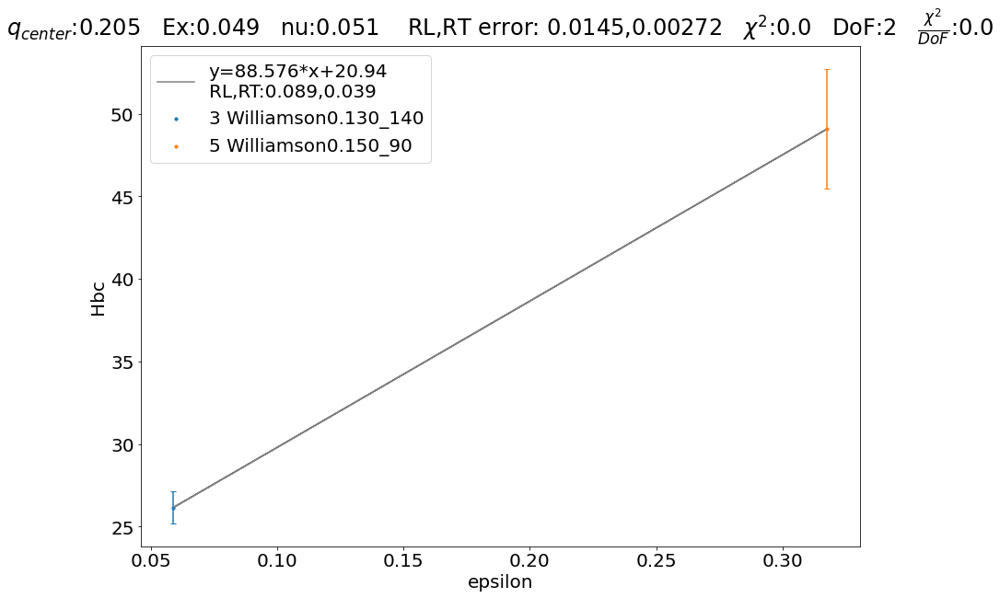

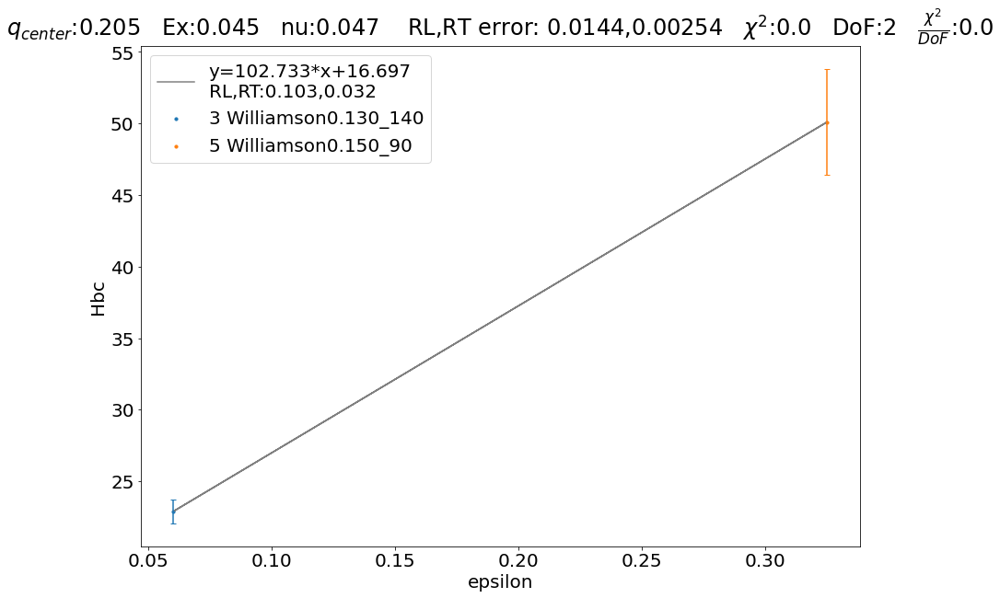

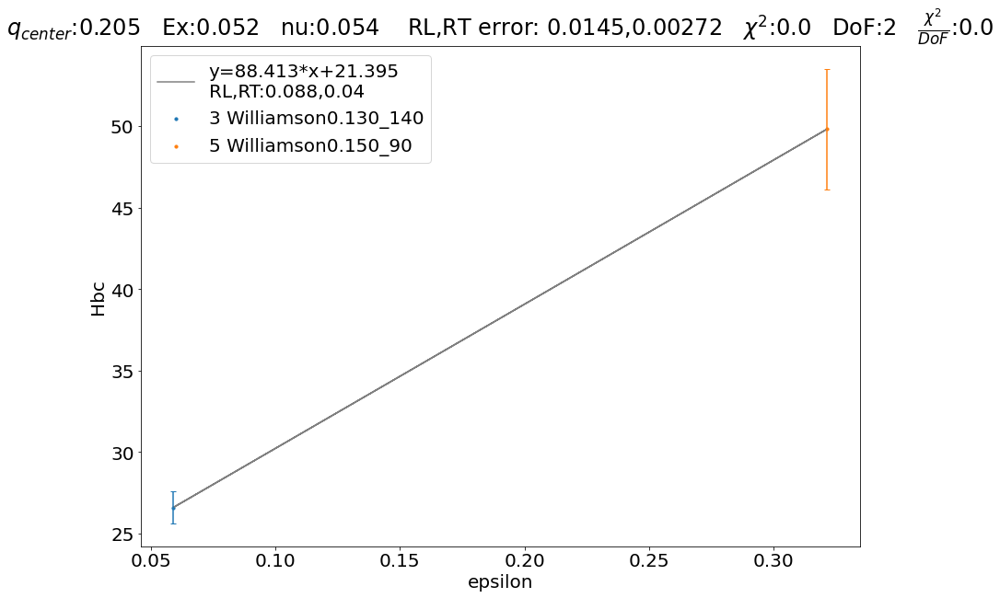

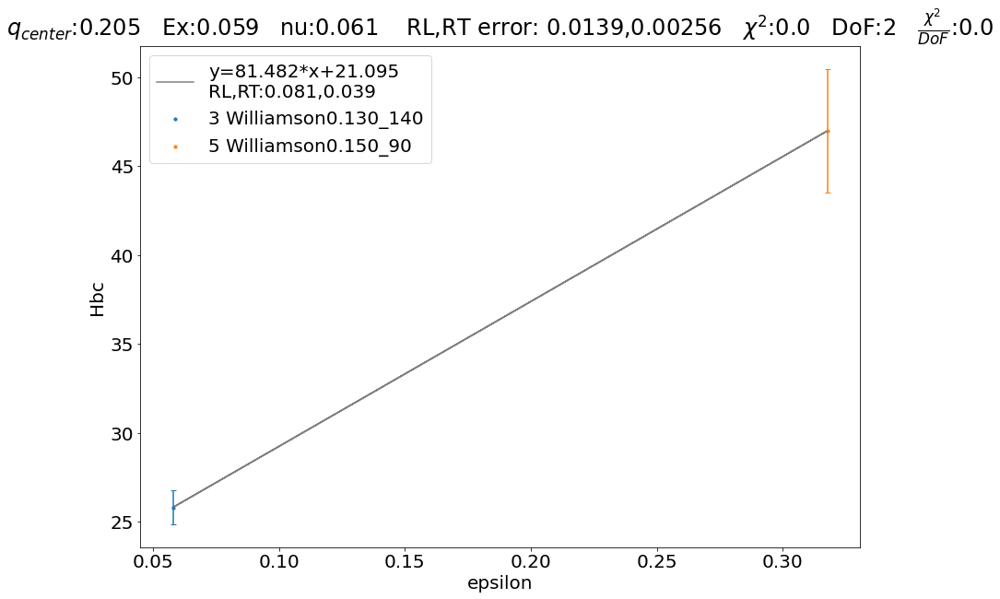

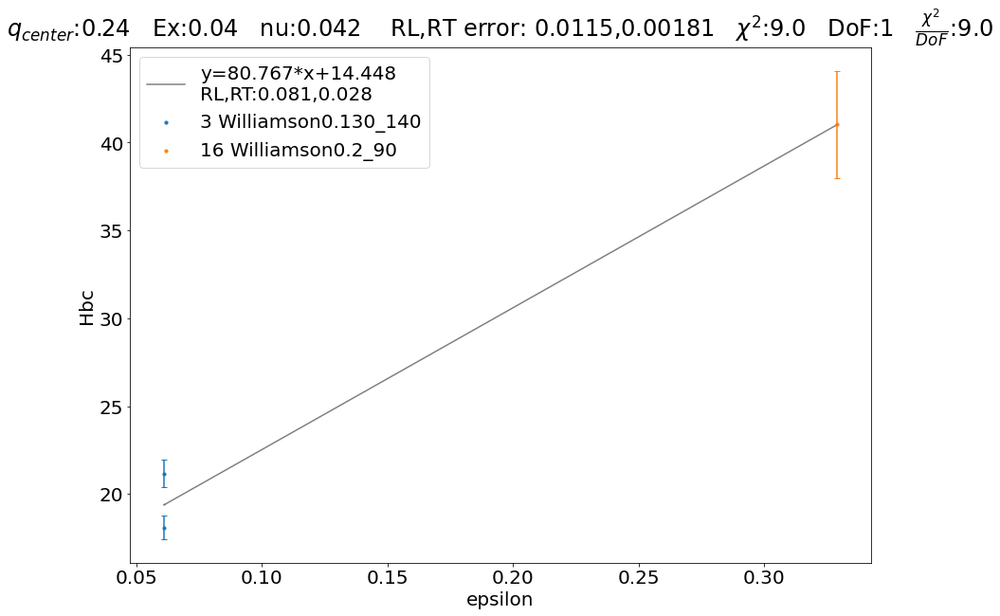

...

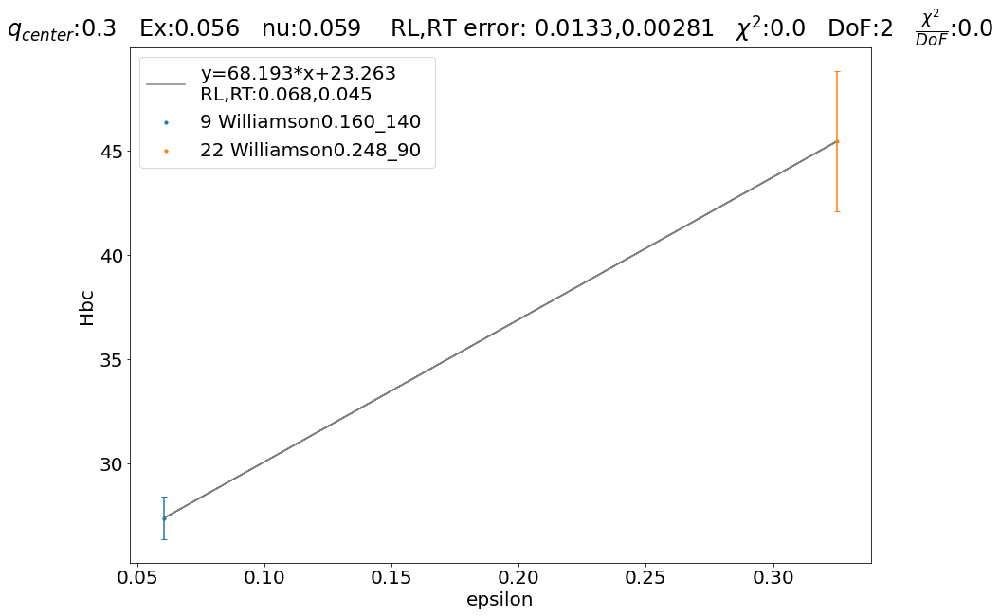

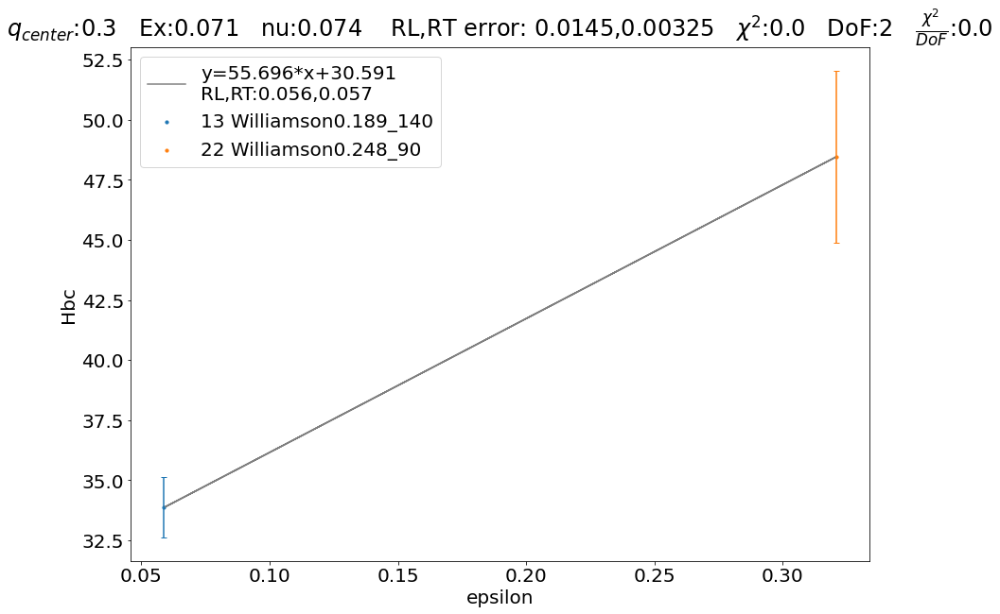

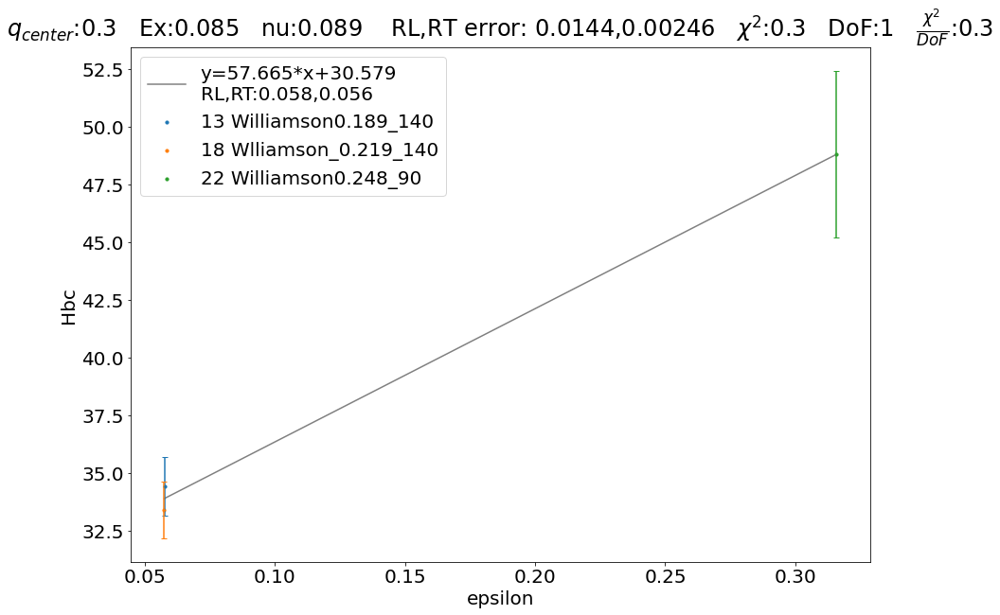

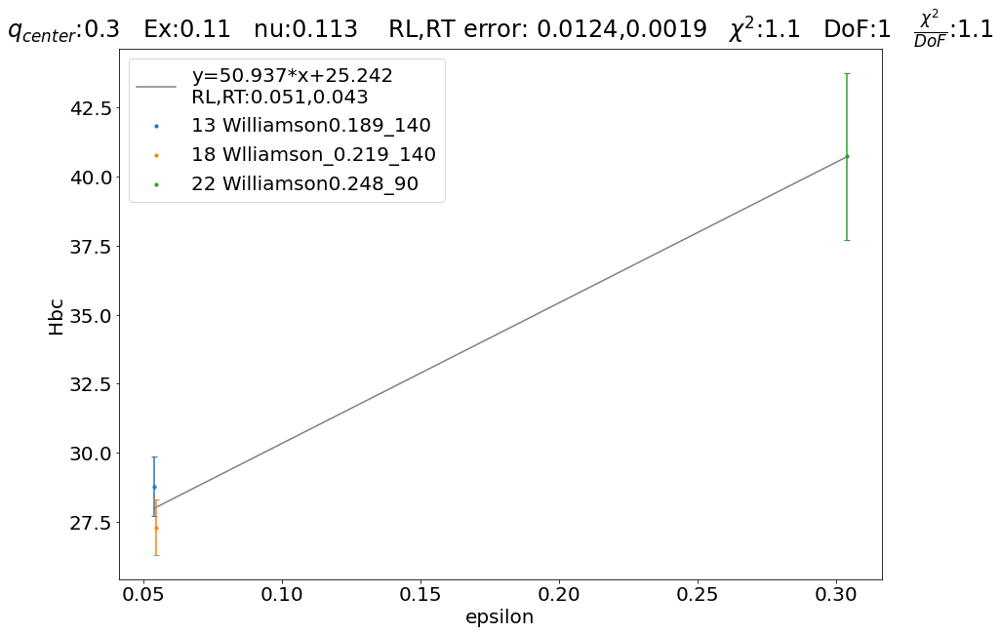

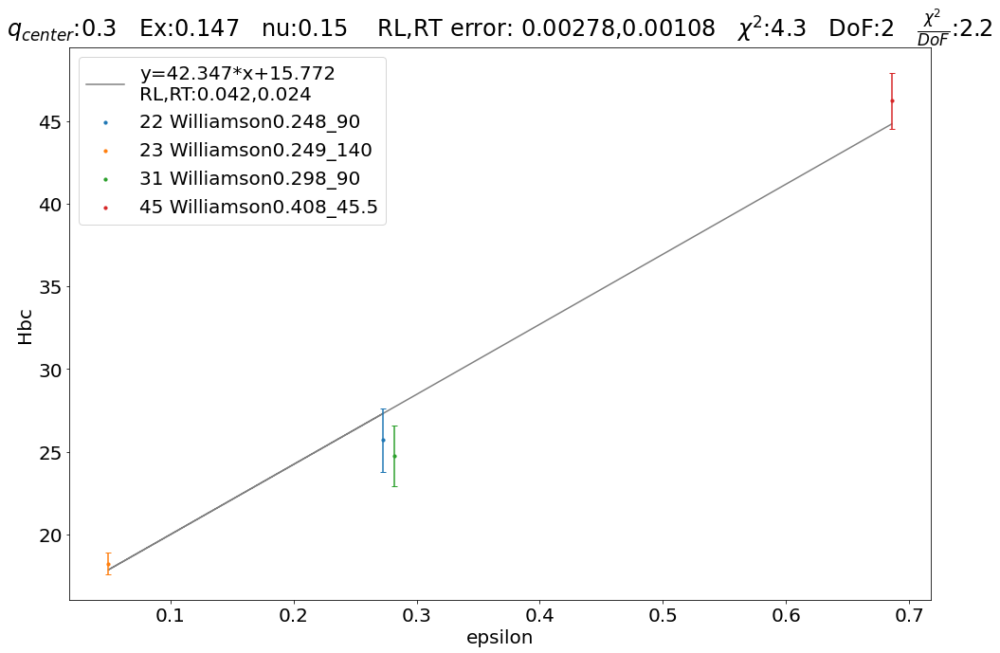

In [103]:
# fig7
# (8,6), 0.17
plt.rc('font', size=20)  # You can change 16 to any desired size
with PdfPages('Ca40paper_figures/fig0_0429_half1_Veff.pdf') as pdf:
    fig = RLRT_plot_qvbin(df,bin_indices=[ 3, 4, 5],figsize=(26,34),subplot_adjust=0.1,legend_ncol=3,
                              RLRTthisAnalysis_plot=True,SuSav2EDRM_plot = True, SuSav2_total = True, ChristyBodekFitQE_plot = True,SuSav2_plotQE2p2h= True,ChristyBodekFitTotal_plot = True, Rosenbluth_plot=True, Yamaguchi_plot=False, SuSav2_plot=True, Goldemberg_plot=False, EDRMF_plot = True, Jourdan_plot=True, RMF_plot = False, Oguro_plot = True, Williamson_plot=True, Torizuka_plot = True, Barreau_plot=False,Buki_plot=False)
    
    pdf.savefig(fig)
    
#0312_remove the scaled 12C fit, include some of this plots in the presentation, but mention that these are just some preliminary results
#ask ziggy for most recent 12C plots and Rhys for the iron plots
#0.148, 0.167, 0.240
# for now fit batest data for 45.5 similar to the way it's done in the paper so that we can extract more data points from the fit 

/var/folders/18/z9zhmmdd7dq4ft3jj1prc9tm0000gn/T/ipykernel_92966/3371848645.py:105: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1 = plt.figure(figsize=(14,10))


1276.8232020793575
Saved ChristyBodekFit extracted values to ChristyBodekFit_extracted_qv0.38.csv
527.7948926618079
Saved ChristyBodekFit extracted values to ChristyBodekFit_extracted_qv0.475.csv
454.7282881809528
Saved ChristyBodekFit extracted values to ChristyBodekFit_extracted_qv0.57.csv
1.7715255251934863
Saved ChristyBodekFit extracted values to ChristyBodekFit_extracted_qv0.649.csv


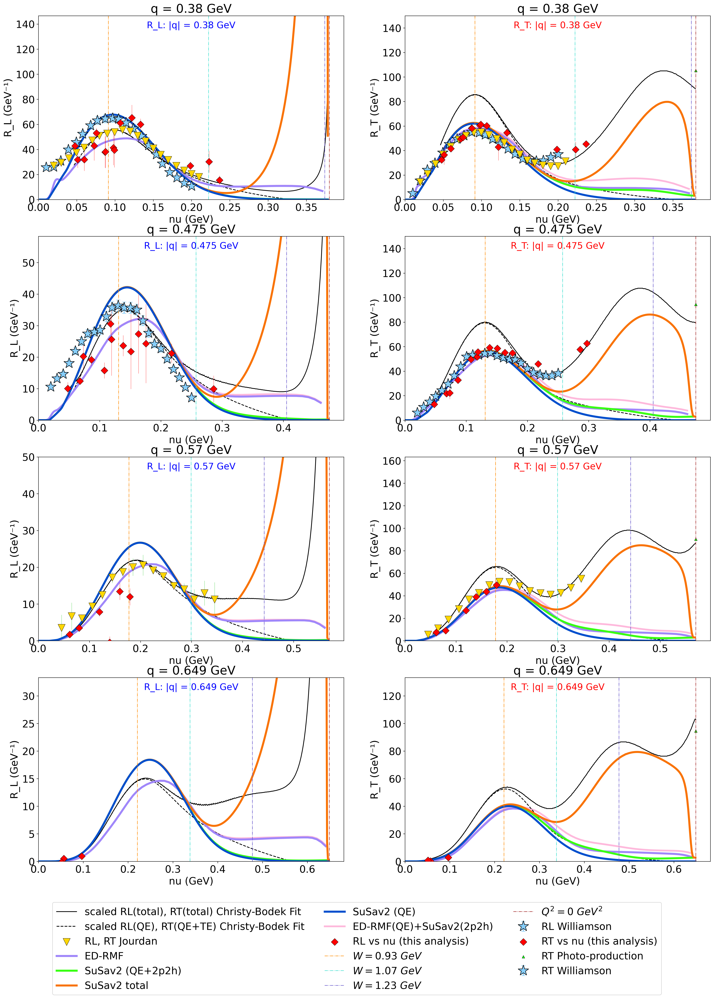

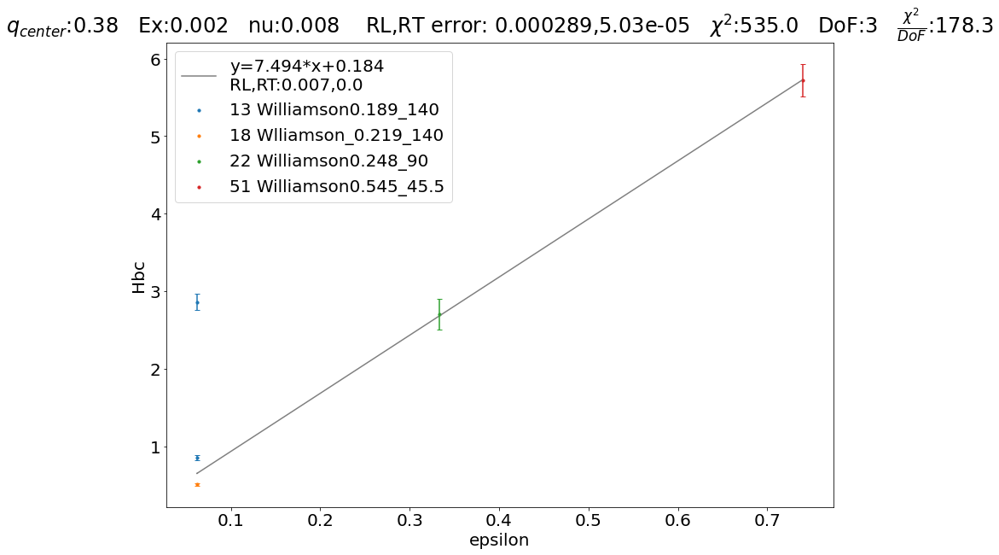

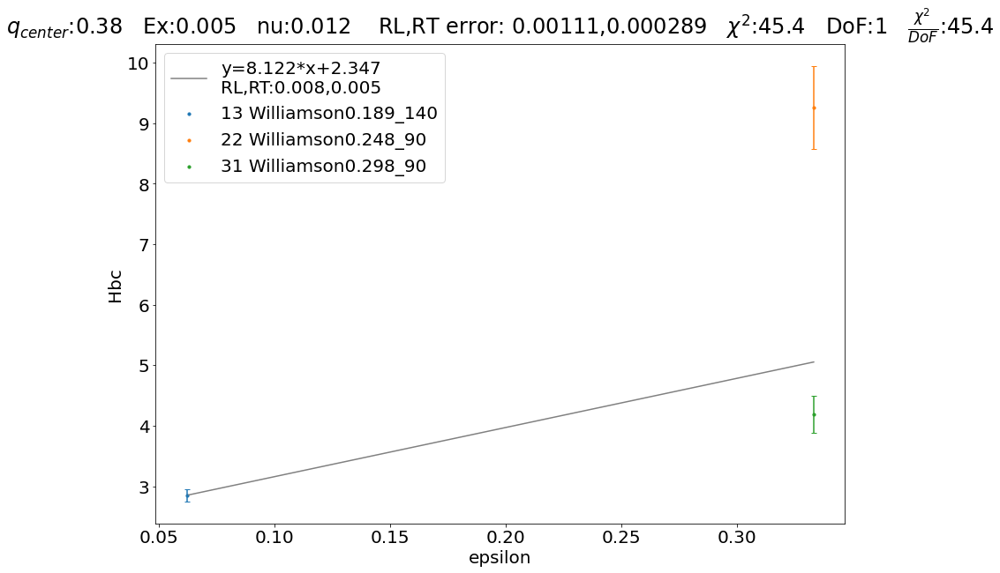

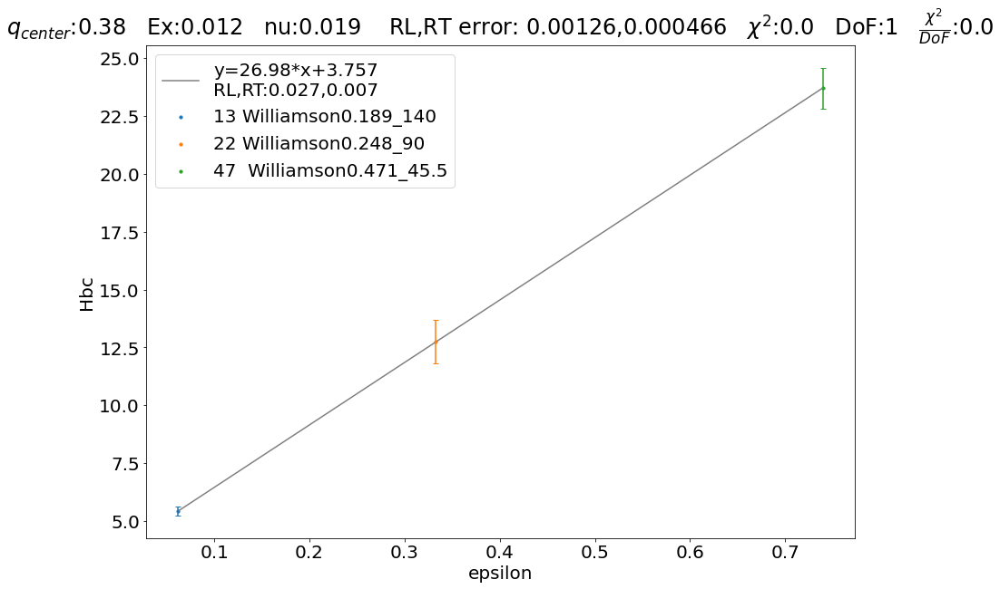

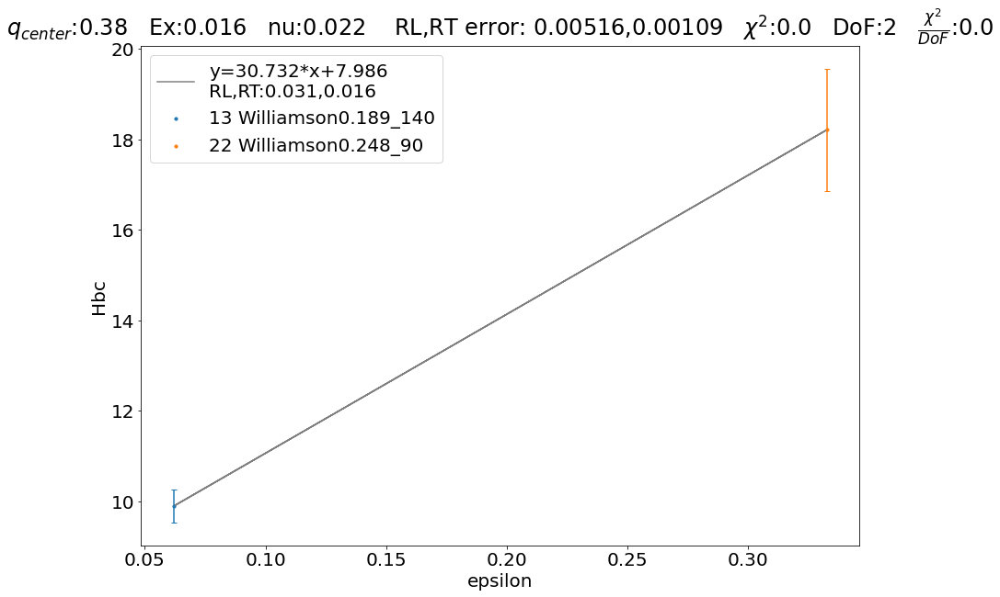

...

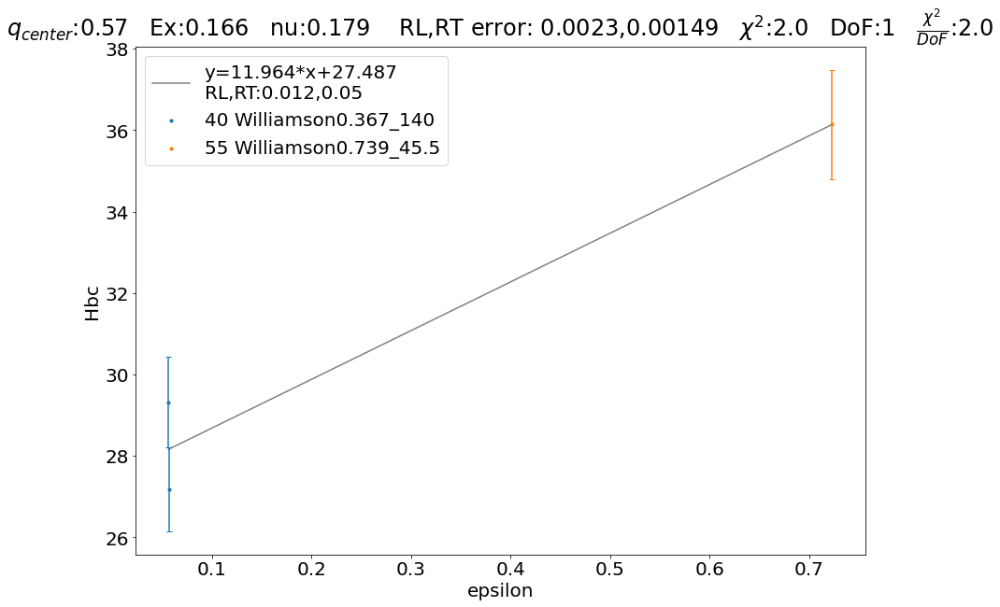

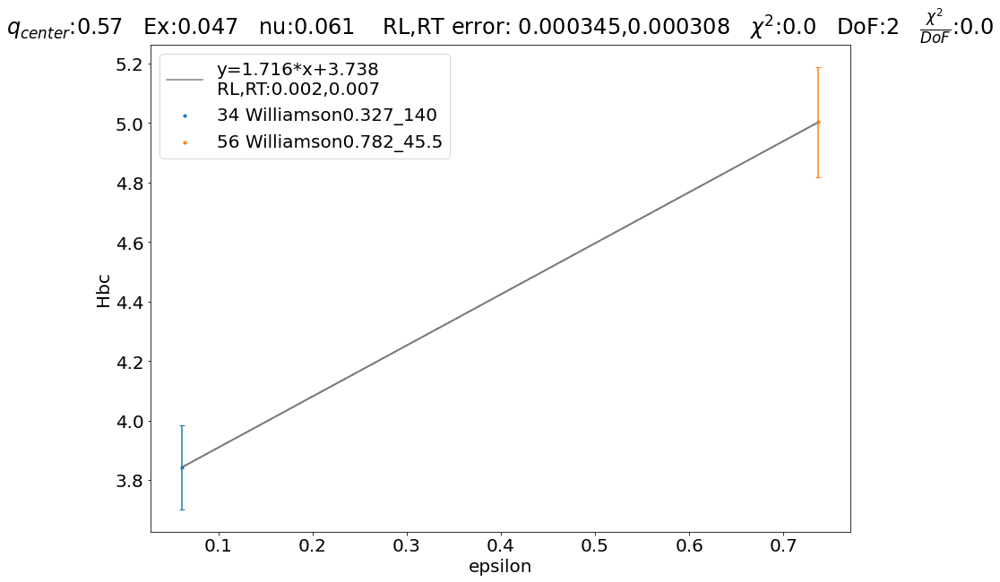

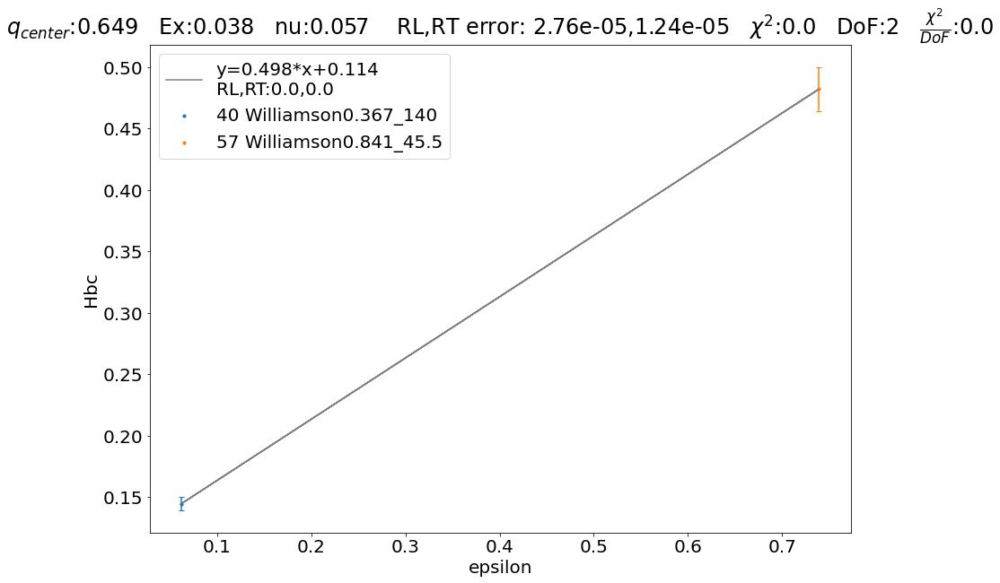

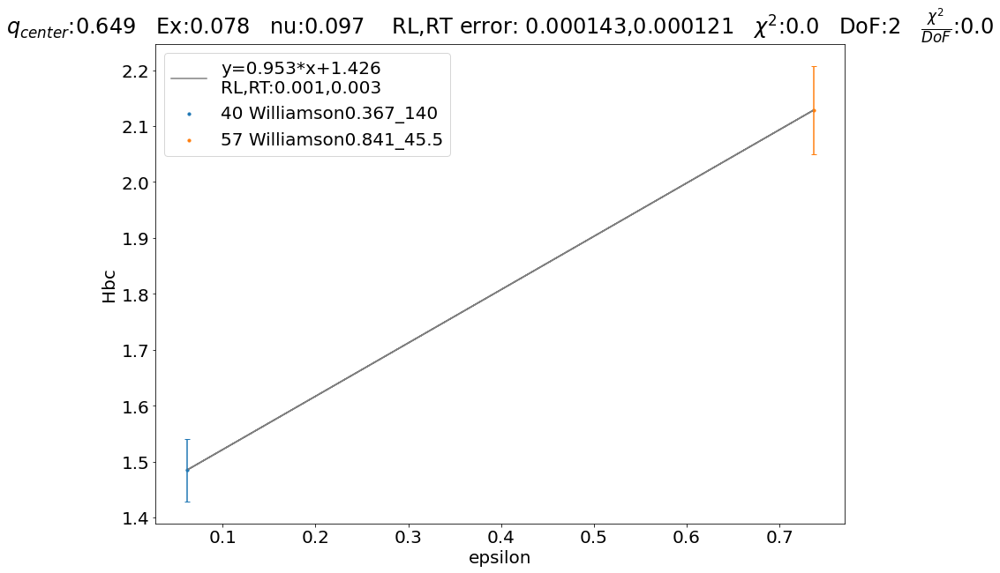

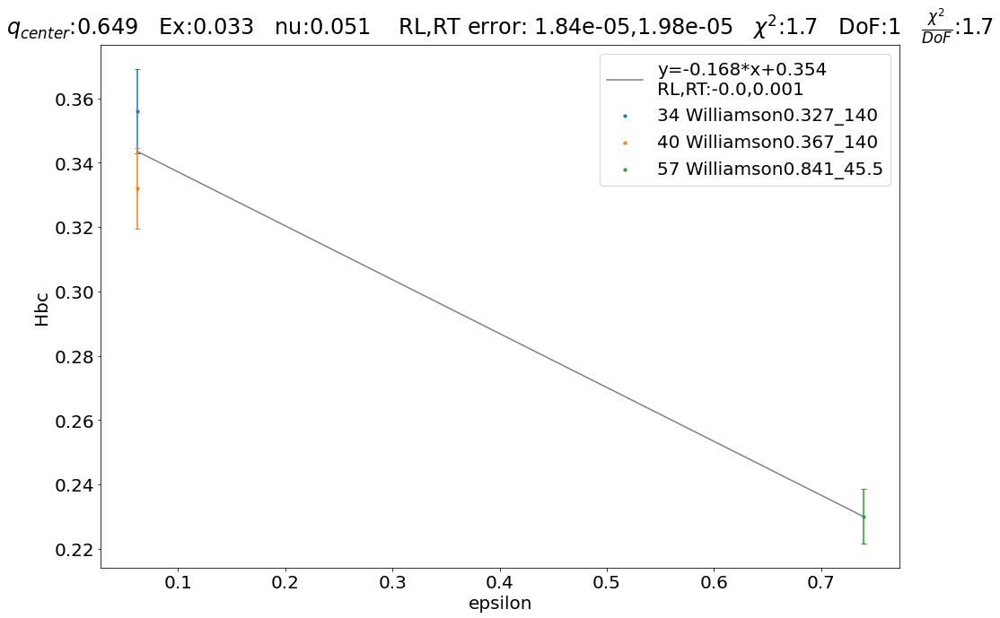

In [104]:
# fig7
# (8,6), 0.17
#plt.rc('font', size=50)  # You can change 16 to any desired size
with PdfPages('Ca40paper_figures/fig0_0429_half2_Veff.pdf') as pdf:
    fig = RLRT_plot_qvbin(df,bin_indices=[6, 7, 8, 9],figsize=(24,31),subplot_adjust=0.1,legend_ncol=3,
                              RLRTthisAnalysis_plot=True,SuSav2EDRM_plot = True, ChristyBodekFitQE_plot = True, ChristyBodekFitTotal_plot = True, Rosenbluth_plot=True, Yamaguchi_plot=False, SuSav2_plot=True, Goldemberg_plot=False, EDRMF_plot = True, Jourdan_plot=True, RMF_plot = False, Oguro_plot = True, Williamson_plot=True, Torizuka_plot = True, Barreau_plot=False,Buki_plot=False)
    
    pdf.savefig(fig)
    
#eliminate the scaled C fit 
#make a 25 cut in Ex

In [10]:
# fig7
# (8,6), 0.17
plt.rc('font', size=20)  # You can change 16 to any desired size
with PdfPages('Ca40paper_figures/fig0_Q2_0310_half2.pdf') as pdf:
    fig = RLRT_plot_Q2bin(df,bin_indices=[3, 4, 5],figsize=(20,30),subplot_adjust=0.08,legend_ncol=3, this_analysis_plot=True, Rosenbluth_plot=False, 
                    Yamaguchi_plot=False,EDRMF_plot=True, Goldemberg_plot=True, RMF_Tania_plot=False, horizontal_plot = False,
                        Sheren_plot=False,SuSav2_plotQE2p2h= True, SuSav2_total = True,  NuWRo_SF_FSI_plot=False,Torizuka_plot=True,SuSav2EDRM_plot = True,  NuWRo_SF_plot=False, ylimit_None=False, df_Genie_LFG=None, df_Genie_susa=None, 
                        lower_bounds=False, SuSav2_plot=True, insert_zoom_in=False, horizontal_cut=-1)
    # Save the figure to the PDF
    pdf.savefig(fig)


Interpolation data missing for Q2center = 0.04: [Errno 2] No such file or directory: '40Ca_Q2_results/csv_files/40Ca_Q2_0.040.csv'
Interpolation data missing for Q2center = 0.056: [Errno 2] No such file or directory: '40Ca_Q2_results/csv_files/40Ca_Q2_0.056.csv'
Interpolation data missing for Q2center = 0.093: [Errno 2] No such file or directory: '40Ca_Q2_results/csv_files/40Ca_Q2_0.093.csv'


In [ ]:
# fig7
# (8,6), 0.17
with PdfPages('Ca40paper_figures/fig0_Q2_0310_half1.pdf') as pdf:
    fig = RLRT_plot_Q2bin(df,bin_indices=[6, 7, 8, 9],figsize=(22,31),subplot_adjust=0.08,legend_ncol=3, this_analysis_plot=True, Rosenbluth_plot=False, 
                    Yamaguchi_plot=False, EDRMF_plot=True, Goldemberg_plot=True, SuSav2_plotQE2p2h= True, RMF_Tania_plot=False, horizontal_plot = False,
                        Sheren_plot=False, NuWRo_SF_FSI_plot=False, NuWRo_SF_plot=False, ylimit_None=False, df_Genie_LFG=None, df_Genie_susa=None, 
                        lower_bounds=False, SuSav2_plot=True, insert_zoom_in=False, horizontal_cut=-1)
    # Save the figure to the PDF
    pdf.savefig(fig)

    # Close the figure to free up memory
    #plt.close(fig)